In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import warnings
from pathlib import Path

#If you get an error either delete or add a parent
project_root = Path('.').resolve().parent.parent.parent
sys.path.append(str(project_root))
print("Project root:", project_root)
print("Python path:", sys.path)

from tools import helpers as hp
from var import stationary as st
from tools import plotresults as pr
from deepvar import deepvar
from var import var
from deepvar import lstm
from deepvar import irf

warnings.filterwarnings('ignore', category=UserWarning, module='statsmodels')
warnings.filterwarnings('ignore', message='X does not have valid feature names, but StandardScaler was fitted with feature names')
warnings.filterwarnings('ignore', message='An unsupported index was provided and will be ignored when e.g. forecasting.')

Project root: /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis
Python path: ['/Library/Frameworks/Python.framework/Versions/3.10/lib/python310.zip', '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10', '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/lib-dynload', '', '/Users/bram/Library/Python/3.10/lib/python/site-packages', '/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages', '/Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results', '/Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis', '/var/folders/mg/jjtr9hhj5zj6g0svf83l817h0000gn/T/tmpp71oue4x', '/Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis']


## Prepare the Data


Prepares the data for the individual VAR, panel VAR, LSTM, and TFT models.

In [12]:
def prepare_df(df):
    df['log_GDP'] = np.log(df['GDP']) 
    df['log_CPI'] = np.log(df['CPI']) 
    final_df = df.copy()
    final_df['TIME_PERIOD'] = pd.to_datetime(final_df['TIME_PERIOD'])
    final_df = final_df.set_index(["Country", "TIME_PERIOD"])
    final_df = final_df.drop(columns = {"Code", "GDP", 'CPI'})
    return final_df

In [13]:
df = pd.read_csv('../../Data/WithoutPolicyRate.csv')
variables_to_keep = ['log_GDP', 'household_debt', 'private_debt']
df = prepare_df(df)
df = df.drop(columns = {"exchange_rate"})
df = df[variables_to_keep]
LAGS = 3

In [14]:
final_detrend = st.detrend_data(df, variables_to_keep, 1) 
final_detrend = final_detrend[final_detrend.index.get_level_values("TIME_PERIOD")< "2020-03-31"]

Index(['Colombia', 'Netherlands, The', 'United Kingdom', 'India', 'Israel',
       'Sweden', 'Thailand', 'Australia', 'New Zealand', 'Ireland', 'Germany',
       'Brazil', 'Mexico', 'Greece', 'Norway', 'Austria', 'Italy', 'Argentina',
       'Singapore', 'France', 'Portugal', 'Hungary', 'Spain', 'Canada',
       'Switzerland', 'United States', 'Denmark', 'Indonesia',
       'China, P.R.: Hong Kong', 'Luxembourg', 'Japan', 'Finland',
       'South Africa', 'Chile', 'Czech Rep.', 'Poland, Rep. of',
       'Türkiye, Rep of', 'Korea, Rep. of', 'Belgium'],
      dtype='object', name='Country')


In [15]:
train_dt_var, test_dt_var = hp.time_panel_split_predict(final_detrend)


## LSTM Prep

In [16]:
inputs = lstm.get_lstm_input(final_detrend, LAGS)

demeaned_df, cross_sectional_means, country_means = deepvar.prepare_data_with_fixed_effects(final_detrend, variables = variables_to_keep)

lstm_df= lstm.create_lstm_data(demeaned_df, LAGS)
# lstm_df = lstm_df.drop(columns={'household_debt','log_GDP'})
# lstm_df = final_detrend.merge(lstm_df, left_index=True, right_index=True)


lstm_train, lstm_val, lstm_test= lstm.train_val_test_split(lstm_df)

panel_var_df= lstm.create_lstm_data(final_detrend, LAGS)



## Panel VAR preparation


The panel var was trained on a balanced dataset. It uses the lstm dataframe.

In [17]:

pvar_dict = {
    1: './pvarcoefs_PD/coef1_PD.xlsx',
    2: './pvarcoefs_PD/coef2_PD.xlsx',
    3: './pvarcoefs_PD/coef3_PD.xlsx',
    4: './pvarcoefs_PD/coef4_PD.xlsx',
    5: './pvarcoefs_PD/coef5_PD.xlsx',
    6: './pvarcoefs_PD/coef6_PD.xlsx'
}


def predict_differences(pvar_dict, LAGS, df):
    """
    Make predictions using panel VAR coefficients
    
    Parameters:
    -----------
    pvar_dict : dict
        Dictionary mapping lag numbers to coefficient file paths
    LAGS : int
        Number of lags to use
    df : DataFrame
        DataFrame containing the lagged variables
        
    Returns:
    --------
    DataFrame
        DataFrame with predictions for each variable
    """
    # Get the coefficient file for the specified lag
    coefs_excel = pvar_dict.get(LAGS)
    coefs_df = pd.read_excel(coefs_excel, index_col=0)
    coefs_df = coefs_df.transpose()
    print(coefs_df)
    
    # Extract lagged variables
    gdp_lags = [df[f'log_GDP_lag{i+1}'] for i in range(LAGS)]
    hd_lags = [df[f'household_debt_lag{i+1}'] for i in range(LAGS)]
    pd_lags = [df[f'private_debt_lag{i+1}'] for i in range(LAGS)]
    
    # Make predictions
    gdp_pred = sum(coefs_df.loc['GDP_eq', f'l_GDP_dif_L{i+1}'] * gdp_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['GDP_eq', f'hd_dif_L{i+1}'] * hd_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['GDP_eq', f'pd_dif_L{i+1}'] * pd_lags[i] for i in range(LAGS))
    
    hhd_pred = sum(coefs_df.loc['HD_eq', f'l_GDP_dif_L{i+1}'] * gdp_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['HD_eq', f'hd_dif_L{i+1}'] * hd_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['HD_eq', f'pd_dif_L{i+1}'] * pd_lags[i] for i in range(LAGS))
    
    pd_pred = sum(coefs_df.loc['PD_eq', f'l_GDP_dif_L{i+1}'] * gdp_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['PD_eq', f'hd_dif_L{i+1}'] * hd_lags[i] for i in range(LAGS)) + \
               sum(coefs_df.loc['PD_eq', f'pd_dif_L{i+1}'] * pd_lags[i] for i in range(LAGS))

    
    # Create a DataFrame with predictions
    pred_df = pd.DataFrame({
        'log_GDP': gdp_pred,
        'household_debt': hhd_pred,
        'private_debt': pd_pred
    }, index=df.index)
    
    return pred_df

# Make predictions
panel_var_df= lstm.create_lstm_data(final_detrend, 5)
predictions_df = predict_differences(pvar_dict, 5, panel_var_df)
predictions_df = predictions_df.dropna()

# Ensure we're comparing datasets of the same length
plot_df = panel_var_df.copy()
plot_df = plot_df[plot_df.index.isin(predictions_df.index)]
plot_df = plot_df.reset_index()
pred_df = predictions_df.reset_index()

def print_pvar_metrics(var, actual_df, pred_df):
    """
    Calculate and print metrics for panel VAR predictions
    
    Parameters:
    -----------
    var : str
        Variable name to evaluate
    actual_df : DataFrame
        DataFrame with actual values
    pred_df : DataFrame
        DataFrame with predicted values
    """
    mse = hp.calculate_mse(actual_df, pred_df, var)
    rmse = np.sqrt(mse)
    mae = hp.calculate_mae(actual_df, pred_df, var)
    
    print(f"{var} Panel VAR MSE In Sample: {mse:.6f}")
    print(f"{var} Panel VAR RMSE In Sample: {rmse:.6f}")
    print(f"{var} Panel VAR MAE In Sample: {mae:.6f}")

# Calculate metrics
print_pvar_metrics('log_GDP', plot_df, pred_df)
print_pvar_metrics('household_debt', plot_df, pred_df)


        l_GDP_dif_L1  l_GDP_dif_L2  l_GDP_dif_L3  l_GDP_dif_L4  l_GDP_dif_L5  \
GDP_eq      0.036496      0.187913      0.172918      0.095172     -0.029125   
HD_eq      -7.847114     -4.269832     -6.966814      2.807830      2.238861   
PD_eq     -59.767905    -28.939649      2.453179     12.331840    -27.247808   

        hd_dif_L1  hd_dif_L2  hd_dif_L3  hd_dif_L4  hd_dif_L5  pd_dif_L1  \
GDP_eq   0.002901   0.001024  -0.000772  -0.000499   0.000413  -0.000035   
HD_eq    0.223964   0.127009  -0.105051   0.094094  -0.009751   0.009387   
PD_eq   -0.485916  -0.758757  -0.450788  -0.843185   0.327904   0.209669   

        pd_dif_L2  pd_dif_L3  pd_dif_L4  pd_dif_L5  
GDP_eq  -0.000047  -0.000067  -0.000316  -0.000156  
HD_eq   -0.000980   0.003609   0.012364   0.014716  
PD_eq    0.084814   0.177373   0.010071  -0.011084  
log_GDP Panel VAR MSE In Sample: 0.000132
log_GDP Panel VAR RMSE In Sample: 0.011483
log_GDP Panel VAR MAE In Sample: 0.007673
household_debt Panel VAR MSE In Sam

Get Prediction for PVAR

In [18]:
def run_panel_VAR_predict_new(df, test, lags, pvar_dict):
    model_vars = ['log_GDP', 'household_debt', 'private_debt']  # Added private_debt
    n_vars = len(model_vars)
    
    all_predictions = []

    unique_countries = test.index.get_level_values('Country').unique()

    for country in unique_countries:
       
        country_data = df[df.index.get_level_values('Country') == country]
        country_test = test[test.index.get_level_values('Country') == country]

       
        initial_values = country_data[country_data.index.get_level_values('TIME_PERIOD') < 
                                      country_test.index.get_level_values('TIME_PERIOD')[0]][model_vars].tail(lags).values
        
        n_periods = len(country_test)
        forecast = np.zeros((n_periods, n_vars))
        
        for t in range(n_periods):
            if t < lags:
                last_values = np.vstack([initial_values[-(lags-t):], forecast[:t]])
            else:
                last_values = forecast[t-lags:t]
            
            temp_df = pd.DataFrame()
            for i in range(lags):
                if i < len(last_values):
                    temp_df[f'log_GDP_lag{i+1}'] = [last_values[i, 0]]
                    temp_df[f'household_debt_lag{i+1}'] = [last_values[i, 1]]
                    temp_df[f'private_debt_lag{i+1}'] = [last_values[i, 2]]  
                else:
                    temp_df[f'log_GDP_lag{i+1}'] = [0]
                    temp_df[f'household_debt_lag{i+1}'] = [0]
                    temp_df[f'private_debt_lag{i+1}'] = [0]  
            
    
            predictions_df = predict_differences(pvar_dict, lags, temp_df)
            
            gdp_pred = predictions_df['log_GDP'].iloc[0]
            hhd_pred = predictions_df['household_debt'].iloc[0]
            pd_pred = predictions_df['private_debt'].iloc[0]  
            
            forecast[t] = [gdp_pred, hhd_pred, pd_pred]  
        
        time_periods = country_test.index.get_level_values('TIME_PERIOD')
        prediction_index = pd.MultiIndex.from_product(
            [[country], time_periods],
            names=['Country', 'TIME_PERIOD']
        )
        predictions_df = pd.DataFrame(forecast, columns=model_vars, index=prediction_index)
        
        all_predictions.append(predictions_df)

    final_predictions_df = pd.concat(all_predictions)
    return final_predictions_df, test

panel_var_pred, pvar_test_df = run_panel_VAR_predict_new(lstm_df, lstm_test, LAGS, pvar_dict)

pvar_data_metrics_df = panel_var_pred + cross_sectional_means + country_means
pvar_data_metrics_df

        l_GDP_dif_L1  l_GDP_dif_L2  l_GDP_dif_L3  hd_dif_L1  hd_dif_L2  \
GDP_eq      0.043983      0.195877      0.171127   0.001890   0.000418   
HD_eq      -7.628447     -5.393445     -8.063167   0.252244   0.105172   
PD_eq     -45.316220    -25.140264     -0.274677  -0.003991  -0.609801   

        hd_dif_L3  pd_dif_L1  pd_dif_L2  pd_dif_L3  
GDP_eq  -0.000813   0.000030  -0.000015  -0.000018  
HD_eq   -0.107490   0.010886   0.003312   0.009632  
PD_eq   -0.649200   0.165487   0.040682   0.111121  
        l_GDP_dif_L1  l_GDP_dif_L2  l_GDP_dif_L3  hd_dif_L1  hd_dif_L2  \
GDP_eq      0.043983      0.195877      0.171127   0.001890   0.000418   
HD_eq      -7.628447     -5.393445     -8.063167   0.252244   0.105172   
PD_eq     -45.316220    -25.140264     -0.274677  -0.003991  -0.609801   

        hd_dif_L3  pd_dif_L1  pd_dif_L2  pd_dif_L3  
GDP_eq  -0.000813   0.000030  -0.000015  -0.000018  
HD_eq   -0.107490   0.010886   0.003312   0.009632  
PD_eq   -0.649200   0.165487   0.04

log_GDP  household_debt  private_debt
Country  TIME_PERIOD                                        
Colombia 2017-03-31   0.010072        0.158673      1.378596
         2017-06-30   0.012933        0.337323      0.955653
         2017-09-30   0.015089        0.230324     -0.033003
         2017-12-31   0.015954        0.428275      0.776618
         2018-03-31   0.015901        0.165131      0.482797
...                        ...             ...           ...
Belgium  2018-12-31   0.008602        0.351976      0.337543
         2019-03-31   0.011049        0.019839      1.311714
         2019-06-30   0.011326        0.367644      1.084750
         2019-09-30   0.008034        0.418599      1.295664
         2019-12-31   0.005845        0.406577      0.311919

[826 rows x 3 columns]

In [19]:
def generate_panel_var_forecast(df, test, lags, pvar_dict):
    """
    Generate forecasts using predict_differences function
    
    Parameters:
    df: DataFrame with historical data
    test: DataFrame specifying the forecast period
    lags: number of lags
    pvar_dict: dictionary containing paths to coefficient files
    """
    model_vars = ['log_GDP', 'household_debt', 'private_debt']  
    n_vars = len(model_vars)
    
    initial_values = df[df.index.get_level_values('TIME_PERIOD') < 
                       test.index.get_level_values('TIME_PERIOD')[0]][model_vars].tail(lags).values
    
    n_periods = len(test)
    forecast = np.zeros((n_periods, n_vars))
    
    # Generate forecasts
    for t in range(n_periods):
        if t < lags:
            last_values = np.vstack([initial_values[-(lags-t):], forecast[:t]])
        else:
            last_values = forecast[t-lags:t]
        
        # Create a temporary DataFrame with the lagged values
        temp_df = pd.DataFrame()
        for i in range(lags):
            if i < len(last_values):
                temp_df[f'log_GDP_lag{i+1}'] = [last_values[i, 0]]
                temp_df[f'household_debt_lag{i+1}'] = [last_values[i, 1]]
                temp_df[f'private_debt_lag{i+1}'] = [last_values[i, 2]]  
            else:
                temp_df[f'log_GDP_lag{i+1}'] = [0]
                temp_df[f'household_debt_lag{i+1}'] = [0]
                temp_df[f'private_debt_lag{i+1}'] = [0] 
        
        # Get predictions
        predictions_df = predict_differences(pvar_dict, lags, temp_df)
        
        # Extract the predicted values
        gdp_pred = predictions_df['log_GDP'].iloc[0]
        hhd_pred = predictions_df['household_debt'].iloc[0]
        pd_pred = predictions_df['private_debt'].iloc[0] 
        
        forecast[t] = [gdp_pred, hhd_pred, pd_pred]  
    
    time_periods = test.index.get_level_values('TIME_PERIOD')
    country = test.index.get_level_values('Country')[0]
    prediction_index = pd.MultiIndex.from_product(
        [[country], time_periods],
        names=['Country', 'TIME_PERIOD']
    )
    predictions_df = pd.DataFrame(forecast, columns=model_vars, index=prediction_index)
    
    return predictions_df, test

def get_country_forecast(df, test, country, lags, pvar_dict):
    """
    Get forecasts for a specific country
    
    Parameters:
    df: full dataset
    test: test dataset
    country: country to forecast for
    lags: number of lags
    pvar_dict: dictionary containing paths to coefficient files
    """
    country_data = df[df.index.get_level_values('Country') == country]
    country_test = test[test.index.get_level_values('Country') == country]
    
    predictions, actual = generate_panel_var_forecast(country_data, country_test, 
                                                    lags, pvar_dict)
    return predictions, actual


all_predictions = []
for country in lstm_test.index.get_level_values('Country').unique():
    pred, _ = get_country_forecast(lstm_df, lstm_test, country, LAGS, pvar_dict)
    all_predictions.append(pred)

final_pvar_predictions = pd.concat(all_predictions)


        l_GDP_dif_L1  l_GDP_dif_L2  l_GDP_dif_L3  hd_dif_L1  hd_dif_L2  \
GDP_eq      0.043983      0.195877      0.171127   0.001890   0.000418   
HD_eq      -7.628447     -5.393445     -8.063167   0.252244   0.105172   
PD_eq     -45.316220    -25.140264     -0.274677  -0.003991  -0.609801   

        hd_dif_L3  pd_dif_L1  pd_dif_L2  pd_dif_L3  
GDP_eq  -0.000813   0.000030  -0.000015  -0.000018  
HD_eq   -0.107490   0.010886   0.003312   0.009632  
PD_eq   -0.649200   0.165487   0.040682   0.111121  
        l_GDP_dif_L1  l_GDP_dif_L2  l_GDP_dif_L3  hd_dif_L1  hd_dif_L2  \
GDP_eq      0.043983      0.195877      0.171127   0.001890   0.000418   
HD_eq      -7.628447     -5.393445     -8.063167   0.252244   0.105172   
PD_eq     -45.316220    -25.140264     -0.274677  -0.003991  -0.609801   

        hd_dif_L3  pd_dif_L1  pd_dif_L2  pd_dif_L3  
GDP_eq  -0.000813   0.000030  -0.000015  -0.000018  
HD_eq   -0.107490   0.010886   0.003312   0.009632  
PD_eq   -0.649200   0.165487   0.04

In [65]:
final_pvar_predictions

log_GDP  household_debt  private_debt
Country  TIME_PERIOD                                        
Colombia 2017-03-31  -0.006290        0.129887      1.355669
         2017-06-30  -0.005585        0.034665      1.206161
         2017-09-30  -0.003928        0.061870      0.736891
         2017-12-31  -0.001823        0.165386      0.719998
         2018-03-31  -0.001358        0.098472      0.516690
...                        ...             ...           ...
Belgium  2018-12-31  -0.000002       -0.001856     -0.003308
         2019-03-31  -0.000004       -0.001147     -0.001136
         2019-06-30  -0.000005       -0.000802      0.000386
         2019-09-30  -0.000005       -0.000463      0.000839
         2019-12-31  -0.000004       -0.000229      0.001017

[826 rows x 3 columns]

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Finding optimal learning rate...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
Finding best initial lr:   9%|▉         | 9/100 [00:00<00:01, 71.56it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 181.84it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /U

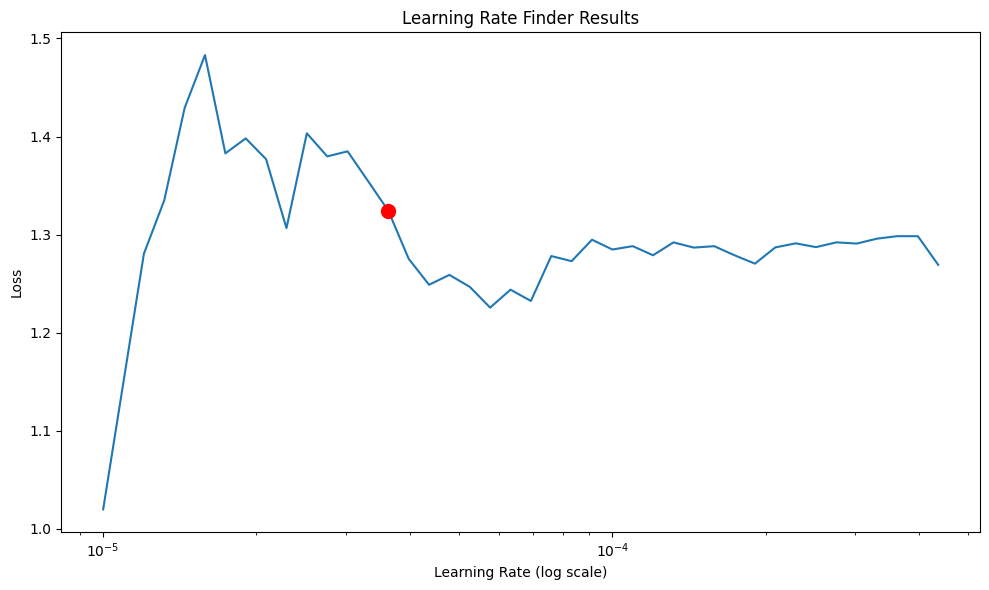

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Suggested learning rate: 0.00003631
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 544.91it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e7764c21-df8f-47fe-9235-6a06211820ae.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e7764c21-df8f-47fe-9235-6a06211820ae.ckpt


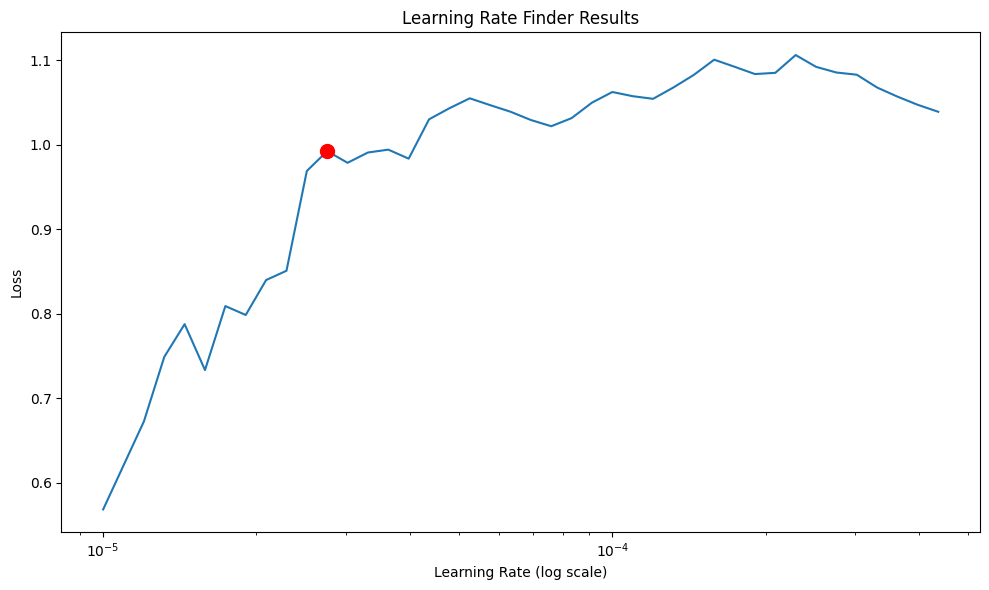

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Suggested learning rate: 0.00002754
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 540.74it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d6915c30-76bf-48dc-89aa-38ee00fe9eca.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d6915c30-76bf-48dc-89aa-38ee00fe9eca.ckpt


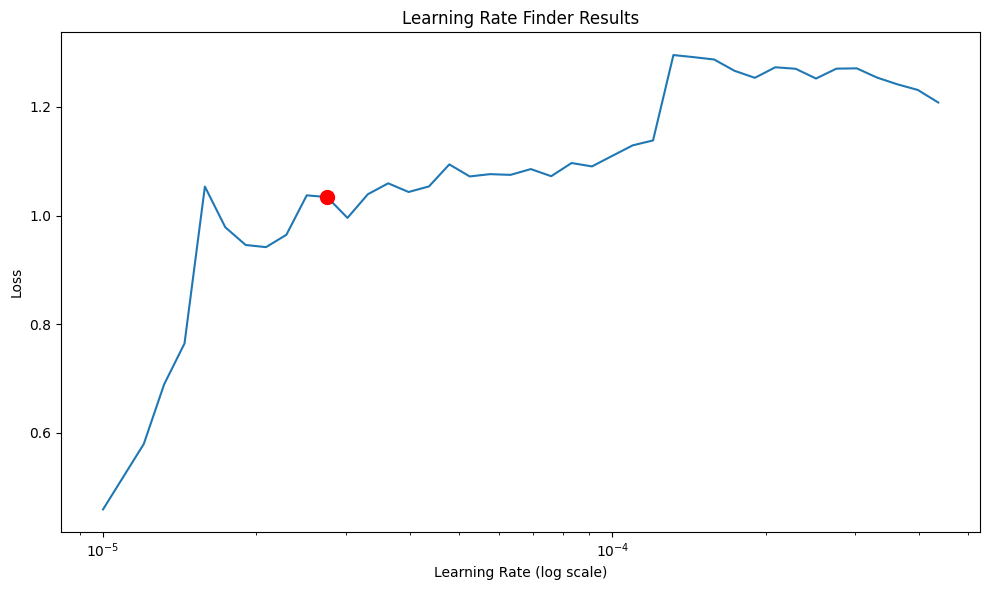

Suggested learning rate: 0.00002754


In [20]:
best_lr_GDP = lstm.find_learning_rate(lstm_df, inputs, 'log_GDP',min_lr=1e-5, max_lr=1e-1)
best_lr_hhd = lstm.find_learning_rate(lstm_df, inputs, 'household_debt',min_lr=1e-5, max_lr=1e-1)
best_lr_pd = lstm.find_learning_rate(lstm_df, inputs, 'private_debt',min_lr=1e-5, max_lr=1e-1)
# GDP_model_lstm, GDP_predictions_lstm, GDP_lstm_metrics, GDP_scaler_X, GDP_scaler_y = lstm.train_lstm_model(lstm_df, inputs, ['log_GDP'], learning_rate = best_lr, num_epochs= 500)


In [21]:
# best_lr_hhd = lstm.find_learning_rate(lstm_df, inputs, 'household_debt',min_lr=1e-5, max_lr=1e-1)

# hhd_model_lstm, hhd_predictions_lstm, hhd_lstm_metrics, hhd_scaler_X, hhd_scaler_y = lstm.train_lstm_model(lstm_df, inputs, ['household_debt'], learning_rate = best_lr, num_epochs= 500)


In [22]:
param_dict = {
    'household_debt':{'learning_rate': best_lr_hhd, 'epochs': 1000},
    'log_GDP':{'learning_rate': best_lr_GDP, 'epochs': 1000},
    'private_debt':{'learning_rate': best_lr_pd, 'epochs': 1000},  
}

variables = final_detrend.columns
model_scaler_dict = deepvar.get_model_and_scaler_no_window(lstm_df, variables, inputs, param_dict)





# irf_predictions = autoregressive_predict(test_df, inputs, steps, model_dict, LAG, country_means=None)

# For country-specific predictions (add back country effects)
# country_predictions = autoregressive_predict(test_df, inputs, steps, model_dict, LAG, country_means=country_means)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

In [23]:
inputs

['log_GDP_lag1',
 'log_GDP_lag2',
 'log_GDP_lag3',
 'household_debt_lag1',
 'household_debt_lag2',
 'household_debt_lag3',
 'private_debt_lag1',
 'private_debt_lag2',
 'private_debt_lag3']

In [24]:
country_means.loc["Argentina", "household_debt"]


0.046031746031746035

In [25]:
def test_errors(df, inputs_test, actuals_test, variable, dictionary, inputs, LAG, cross_sectional_means, country_means):
    lstm.set_seed()
    countries = df.index.get_level_values('Country').unique()
    df = df.drop(columns = inputs)
    total_squared_error = 0
    total_absolute_error = 0 
    total_samples = 0
    # print(inputs)
    # inputs = df.columns
    # print(inputs)
    for country in countries:
        actual_values = hp.get_country(actuals_test, country)
        input_values = hp.get_country(inputs_test, country)
        steps_to_predict = len(actual_values)
        predictions_dict = deepvar.autoregressive_predict(input_values, inputs, steps_to_predict, dictionary, LAG)
        prediction = predictions_dict[variable]
        
        # Get the time periods for the predictions
        time_periods = actual_values.index.get_level_values('TIME_PERIOD')
        # Add the corresponding cross-sectional means
        prediction = prediction + cross_sectional_means.loc[time_periods, variable].values + country_means.loc[country, variable]
        

        fitted_values = pd.DataFrame(prediction, columns=[variable])
        
        mse = hp.calculate_mse(actual_values, fitted_values, variable)
        total_squared_error += mse * len(actual_values[variable]) 
        
        mae = hp.calculate_mae(actual_values, fitted_values, variable)
        total_absolute_error += mae * len(actual_values[variable])
        
        total_samples += len(actual_values[variable])
    
    total_mse = total_squared_error / total_samples
    rmse = np.sqrt(total_mse)
    total_mae = total_absolute_error / total_samples
    return [total_mse, rmse, total_mae]

gdp_deepvar_metrics = test_errors(lstm_df, lstm_test, test_dt_var, 'log_GDP', model_scaler_dict, inputs, LAGS, cross_sectional_means, country_means)
hhd_deepvar_metrics = test_errors(lstm_df, lstm_test, test_dt_var, 'household_debt', model_scaler_dict, inputs, LAGS, cross_sectional_means, country_means)
pd_deepvar_metrics = test_errors(lstm_df, lstm_test, test_dt_var, 'private_debt', model_scaler_dict, inputs, LAGS, cross_sectional_means, country_means)

   

In [26]:
def calculate_percent_improvement(deepvar_metrics, compare_metrics):
    improvements = {}
    
    # Define the metric names for clarity (order should match the input lists)
    metric_names = ['total_mse', 'rmse', 'total_mae']
    
    for i, metric in enumerate(metric_names):
        # Get the values for DeepVAR and the comparison model
        deepvar_value = deepvar_metrics[i]
        compare_value = compare_metrics[i]
        
        if compare_value != 0:  
            improvement = ((compare_value - deepvar_value) / compare_value) * 100
            improvements[metric] = improvement
        else:
            improvements[metric] = None  
    
    return improvements

# improvement_deepvar_vs_var_gdp = calculate_percent_improvement(gdp_deepvar_metrics, panel_var_pred['log_GDP'])
# print("GDP model improvement",improvement_deepvar_vs_var_gdp)


# improvement_deepvar_vs_var_hhd = calculate_percent_improvement(hhd_deepvar_metrics, panel_var_pred['household_debt'])
# print("household debt model improvement",improvement_deepvar_vs_var_hhd)



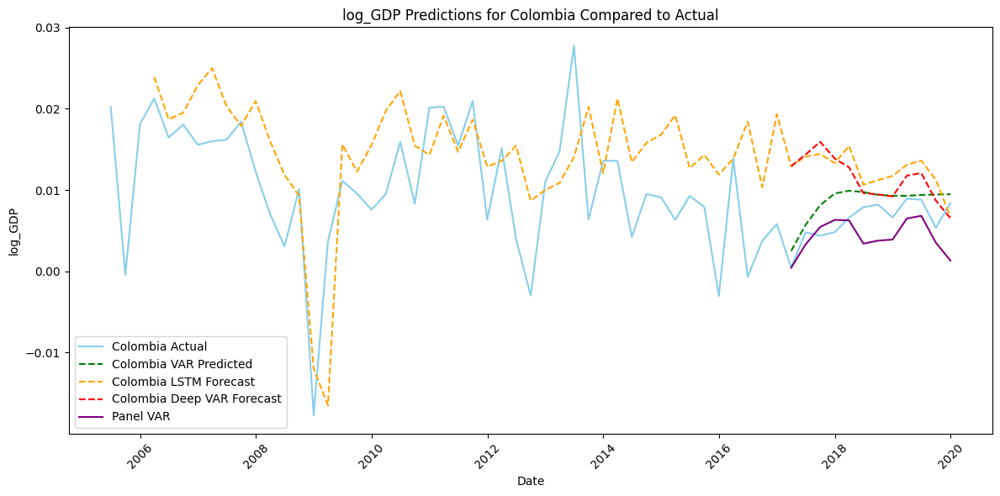

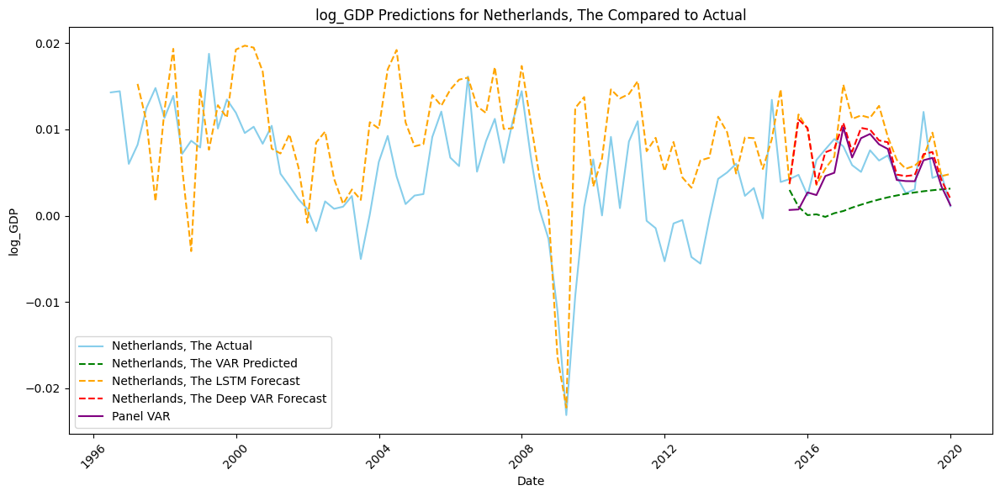

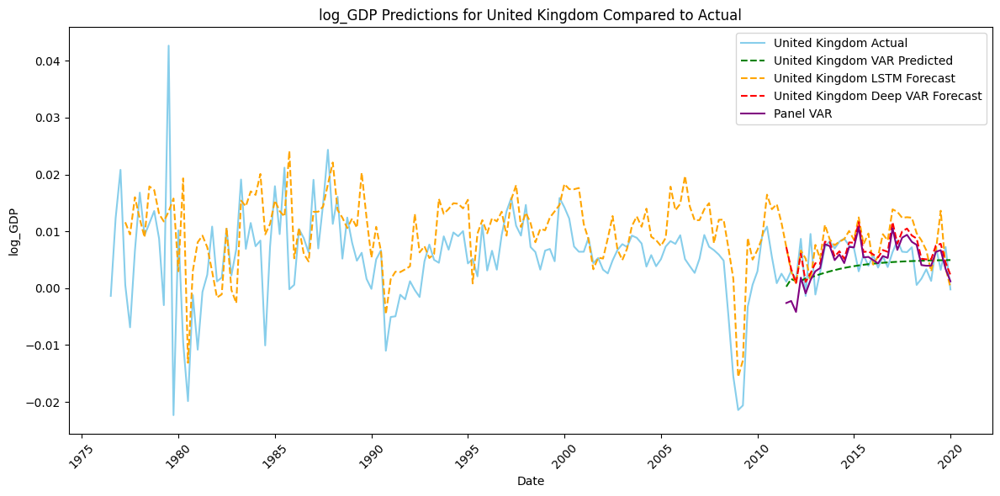

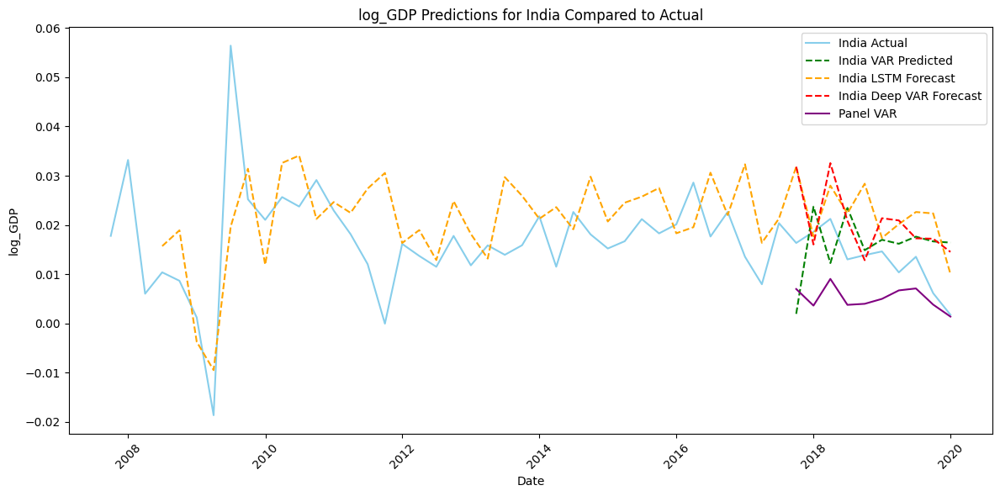

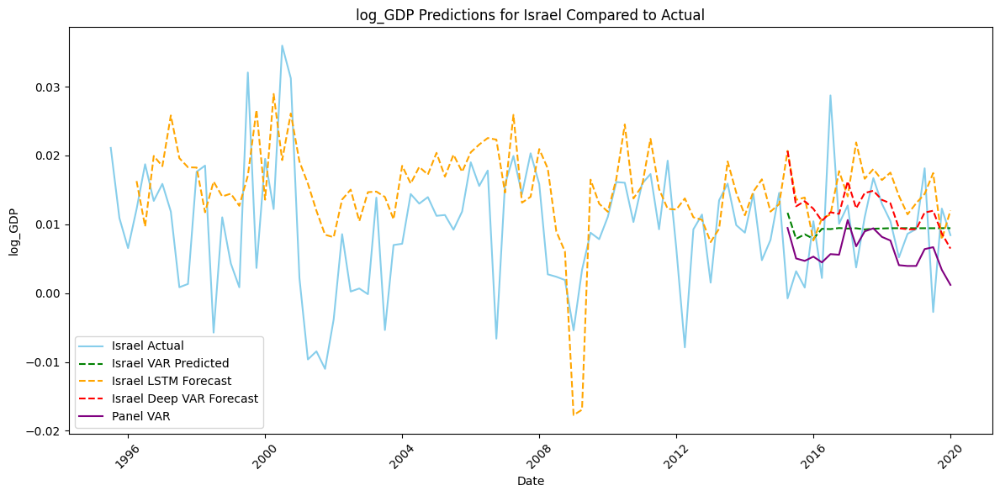

...

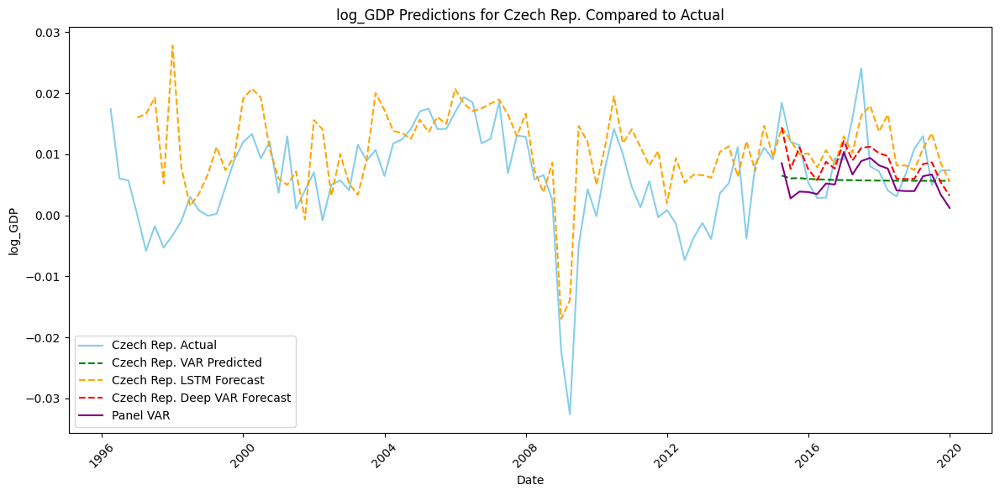

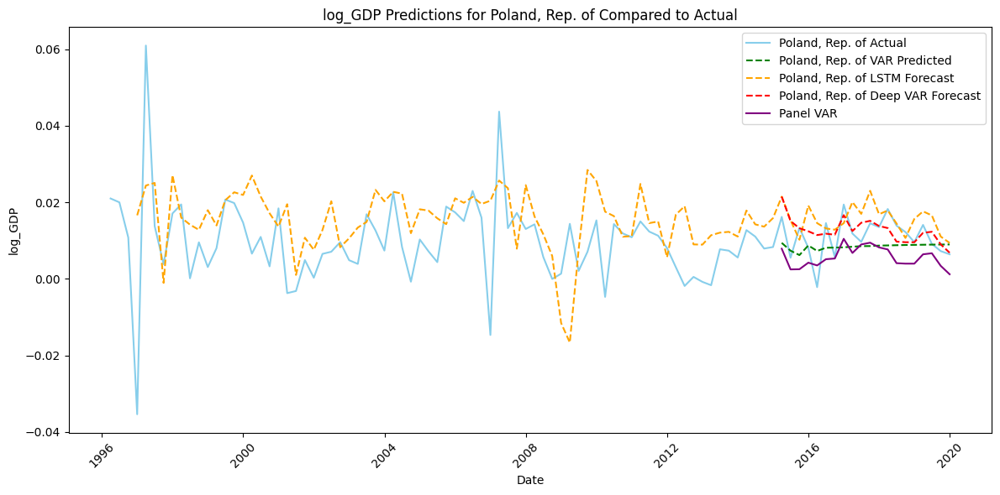

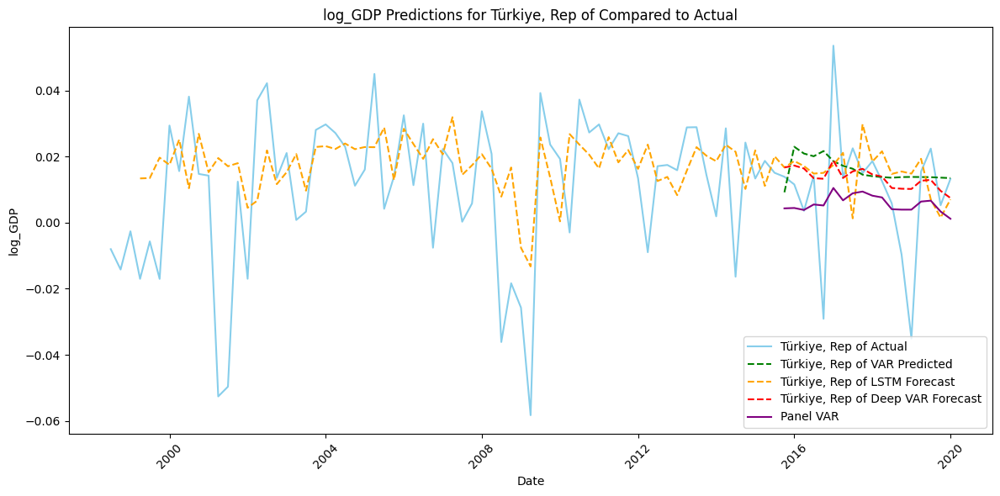

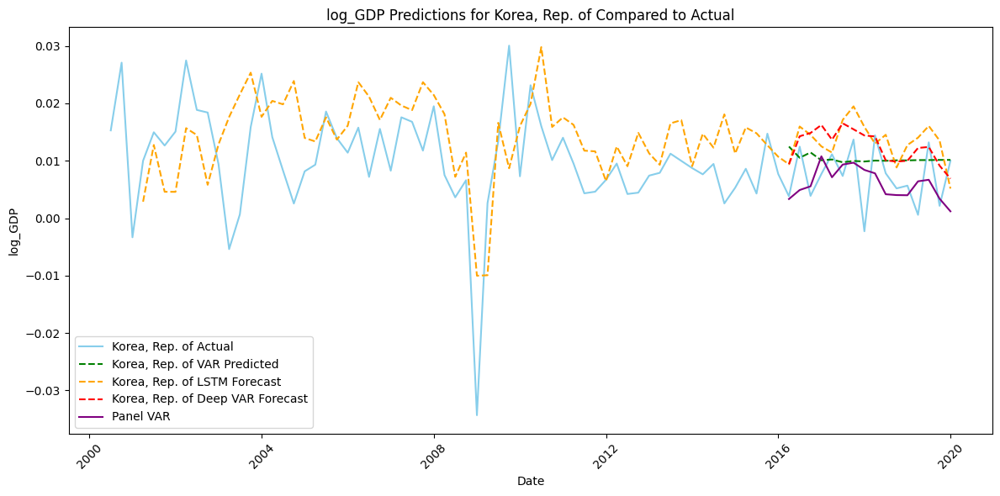

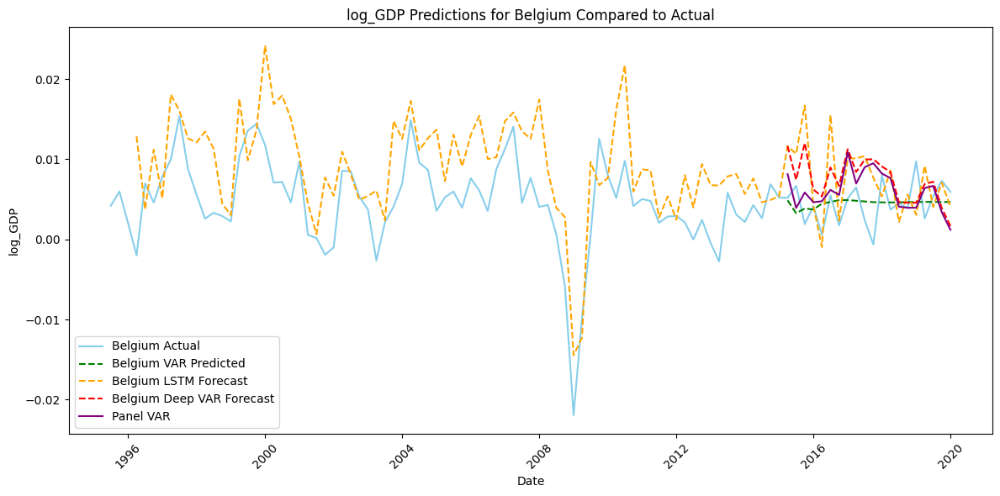

In [27]:
countries = lstm_df.index.get_level_values("Country").unique()
from var import var
def plot_country_predictions_test(country, variable, inputs, lags, df, dict, train_dt_var, test_dt_var, final_detrend, cross_sectional_means, country_means, panel_predictions, train_fraction=0.8):
    country_data = hp.get_country(df, country)
    country_var_detrend_predict, _ = var.get_VAR_predict(final_detrend, train_dt_var, test_dt_var, country, lags)

    # Get panel VAR predictions and add back means
    panel_predictions_country = hp.get_country(panel_predictions, country)
    panel_predictions_adjusted = panel_predictions_country.copy()
    panel_predictions_adjusted[variable] = panel_predictions_adjusted[variable] + cross_sectional_means[variable]

    # LSTM predictions 
    country_test_data = hp.get_test_data(country_data, train_fraction=train_fraction)
    lstm_predict = lstm.fill_forecast_values(country_data, inputs, variable, dict)
    lstm_predict = lstm_predict + cross_sectional_means+country_means

    # Deep var predictions
    steps_to_predict = len(country_test_data)
    deepvar_predict_dict = deepvar.autoregressive_predict(country_test_data, inputs, steps_to_predict, dict, lags)
    deepvar_predict = deepvar_predict_dict[variable]
    
    deepvar_predict_df = pd.DataFrame(
        deepvar_predict, 
        index=country_test_data.index,
        columns=[variable]
    )
    
    deepvar_predict_df[variable] = deepvar_predict_df[variable] + cross_sectional_means[variable]+country_means[variable]

    plt.figure(figsize = (12,6))

    plt.plot(country_data.index.get_level_values('TIME_PERIOD'), country_data[variable], label=f"{country} Actual", color='skyblue')
    plt.plot(country_var_detrend_predict.index.get_level_values('TIME_PERIOD'), country_var_detrend_predict[variable], label=f"{country} VAR Predicted", color='green', linestyle='--')
    plt.plot(lstm_predict.index.get_level_values('TIME_PERIOD'), lstm_predict[variable], label=f"{country} LSTM Forecast", color='orange', linestyle='--')
    plt.plot(deepvar_predict_df.index.get_level_values('TIME_PERIOD'), deepvar_predict_df[variable], label=f"{country} Deep VAR Forecast", color='red', linestyle='--')
    plt.plot(panel_predictions_adjusted.index.get_level_values('TIME_PERIOD'),
              panel_predictions_adjusted[variable], label='Panel VAR', color='purple')
    
    plt.title(f'{variable} Predictions for {country} Compared to Actual')
    plt.xlabel('Date')
    plt.ylabel(f'{variable}')
    
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.show()
    
for country in countries:
    plot_country_predictions_test(
        country, 
        'log_GDP', 
        inputs, 
        3, 
        panel_var_df, 
        model_scaler_dict, 
        train_dt_var,
        test_dt_var, 
        final_detrend,
        cross_sectional_means,
        country_means, 
        panel_var_pred
    )


In [28]:
pvar_metrics_gdp = [
    hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'log_GDP'),
    np.sqrt(hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'log_GDP')),
    hp.calculate_mae(test_dt_var, pvar_data_metrics_df, 'log_GDP')
]

pvar_metrics_hhd = [
    hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'household_debt'),
    np.sqrt(hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'household_debt')),
    hp.calculate_mae(test_dt_var, pvar_data_metrics_df, 'household_debt')
]

pvar_metrics_pd = [
    hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'private_debt'),
    np.sqrt(hp.calculate_mse(test_dt_var, pvar_data_metrics_df, 'private_debt')),
    hp.calculate_mae(test_dt_var, pvar_data_metrics_df, 'private_debt')
] 

improvement_deepvar_vs_var_gdp = calculate_percent_improvement(gdp_deepvar_metrics,pvar_metrics_gdp)
print("GDP model improvement",improvement_deepvar_vs_var_gdp)


improvement_deepvar_vs_var_hhd = calculate_percent_improvement(hhd_deepvar_metrics, pvar_metrics_hhd)
print("household debt model improvement",improvement_deepvar_vs_var_hhd)
improvement_deepvar_vs_var_pd = calculate_percent_improvement(pd_deepvar_metrics, pvar_metrics_pd)
print("private debt model improvement",improvement_deepvar_vs_var_pd) 

GDP model improvement {'total_mse': 36.70141225588686, 'rmse': 20.439590408223037, 'total_mae': 31.383441548072856}
household debt model improvement {'total_mse': 23.070555839719546, 'rmse': 12.290568260716423, 'total_mae': 12.824143228803605}
private debt model improvement {'total_mse': 5.3236179916027115, 'rmse': 2.698210700729, 'total_mae': 3.366580010169027}


In [29]:
GDP_var_metrics = var.get_test_errors(final_detrend, train_dt_var, test_dt_var, LAGS, 'log_GDP')
hhd_var_metrics = var.get_test_errors(final_detrend, train_dt_var, test_dt_var, LAGS, 'household_debt')
pd_var_metrics = var.get_test_errors(final_detrend, train_dt_var, test_dt_var, LAGS, 'private_debt')

improvement_deepvar_vs_var_gdp = calculate_percent_improvement(gdp_deepvar_metrics,GDP_var_metrics )
print("GDP model improvement",improvement_deepvar_vs_var_gdp)

improvement_deepvar_vs_var_hhd = calculate_percent_improvement(hhd_deepvar_metrics, hhd_var_metrics)
print("household debt model improvement",improvement_deepvar_vs_var_hhd)

improvement_deepvar_vs_var_pd = calculate_percent_improvement(pd_deepvar_metrics, pd_var_metrics)
print("private debt model improvement",improvement_deepvar_vs_var_pd)  

GDP model improvement {'total_mse': 9.581980975306582, 'rmse': 4.911610054279801, 'total_mae': 3.2317529299267846}
household debt model improvement {'total_mse': 32.48635768426344, 'rmse': 17.83331434471963, 'total_mae': 15.35896051003177}
private debt model improvement {'total_mse': 26.521928776394, 'rmse': 14.280649078748858, 'total_mae': 4.578043059625204}


In [30]:
gdp_latex = hp.create_model_comparison_latex_table(gdp_deepvar_metrics, GDP_var_metrics, pvar_metrics_gdp)
hhd_latex = hp.create_model_comparison_latex_table(hhd_deepvar_metrics, hhd_var_metrics, pvar_metrics_hhd)
pd_latex = hp.create_model_comparison_latex_table(pd_deepvar_metrics, pd_var_metrics, pvar_metrics_pd)

In [31]:
# gdp_latex 

In [32]:
hhd_latex

'\\begin{table}[htbp]\n\\centering\n\\caption{Model Performance Comparison}\n\\begin{tabular}{lccc}\n\\hline\n\\textbf{Metric} & \\textbf{DeepVAR} & \\textbf{VAR} & \\textbf{Panel VAR} \\\\\n\\hline\nMean Squared Error (MSE) & 0.371726 & 0.550595 & 0.483204  \\\\\nRoot Mean Squared Error (RMSE) & 0.609694 & 0.742021 & 0.695129  \\\\\nMean Absolute Error (MAE) & 0.443735 & 0.524255 & 0.509011  \\\\\n\\hline\n\\end{tabular}\n\\end{table}'

In [33]:
# # ... existing code ...
# import deepvar.hyperopt as hyperopt
# import time

# # Define the variables you want to optimize
# variables = final_detrend.columns  # ['household_debt', 'log_GDP']

# # Start timer to track optimization time
# start_time = time.time()

# print("Starting hyperparameter optimization for DeepVAR models...")
# # Run hyperparameter optimization for all variables
# best_params = hyperopt.optimize_all_variables(
#     df=lstm_df,  # Your training dataframe
#     variables=variables,  # Variables to predict
#     inputs=inputs,  # Input features
#     n_trials=30  # Number of trials per variable (adjust based on your time constraints)
# )

# # Print optimization time
# optimization_time = time.time() - start_time
# print(f"Hyperparameter optimization completed in {optimization_time:.2f} seconds")

# # Print the best hyperparameters for each variable
# for var, params in best_params.items():
#     print(f"\nBest hyperparameters for {var}:")
#     for param_name, param_value in params.items():
#         print(f"  {param_name}: {param_value}")

# # Train models with the optimized hyperparameters
# print("\nTraining DeepVAR models with optimized hyperparameters...")
# optimized_model_dict = {}

# for var in variables:
#     print(f"Training model for {var} with optimized hyperparameters...")
#     params = best_params[var]
    
#     model_params = {
#         'learning_rate': params['learning_rate'],
#         'hidden_size': params['hidden_size'],
#         'dropout': params['dropout'],
#         'weight_decay': params['weight_decay'],
#         'batch_size': params['batch_size'],
#         'num_epochs': 500  # Use a fixed number of epochs
#     }
    
#     # Train the model with the optimized parameters
#     model, predictions, metrics, scaler_X, scaler_y = lstm.train_lstm_model(
#         lstm_df, 
#         inputs, 
#         [var], 
#         **model_params
#     )
    
#     # Store in the format expected by autoregressive_predict
#     optimized_model_dict[var] = (model, predictions, metrics, scaler_X, scaler_y)

# # Now you can use these optimized models for prediction and evaluation
# print("\nEvaluating optimized DeepVAR models...")

# # Calculate test errors for the optimized models
# gdp_optimized_metrics = test_errors(
#     lstm_df, lstm_test, test_dt_var, 'log_GDP', 
#     optimized_model_dict, inputs, LAGS, 
#     cross_sectional_means, country_means
# )

# hhd_optimized_metrics = test_errors(
#     lstm_df, lstm_test, test_dt_var, 'household_debt', 
#     optimized_model_dict, inputs, LAGS, 
#     cross_sectional_means, country_means
# )

# # Compare the optimized models with the previous models
# print("\nComparison of model performance:")
# print("\nGDP Model:")
# print(f"{'Metric':<25} {'Original DeepVAR':<15} {'Optimized DeepVAR':<15}")
# print(f"{'MSE':<25} {gdp_deepvar_metrics[0]:<15.6f} {gdp_optimized_metrics[0]:<15.6f}")
# print(f"{'RMSE':<25} {gdp_deepvar_metrics[1]:<15.6f} {gdp_optimized_metrics[1]:<15.6f}")
# print(f"{'MAE':<25} {gdp_deepvar_metrics[2]:<15.6f} {gdp_optimized_metrics[2]:<15.6f}")

# print("\nHousehold Debt Model:")
# print(f"{'Metric':<25} {'Original DeepVAR':<15} {'Optimized DeepVAR':<15}")
# print(f"{'MSE':<25} {hhd_deepvar_metrics[0]:<15.6f} {hhd_optimized_metrics[0]:<15.6f}")
# print(f"{'RMSE':<25} {hhd_deepvar_metrics[1]:<15.6f} {hhd_optimized_metrics[1]:<15.6f}")
# print(f"{'MAE':<25} {hhd_deepvar_metrics[2]:<15.6f} {hhd_optimized_metrics[2]:<15.6f}")

# # Calculate improvement percentages
# gdp_improvement = {
#     'MSE': ((gdp_deepvar_metrics[0] - gdp_optimized_metrics[0]) / gdp_deepvar_metrics[0]) * 100,
#     'RMSE': ((gdp_deepvar_metrics[1] - gdp_optimized_metrics[1]) / gdp_deepvar_metrics[1]) * 100,
#     'MAE': ((gdp_deepvar_metrics[2] - gdp_optimized_metrics[2]) / gdp_deepvar_metrics[2]) * 100
# }

# hhd_improvement = {
#     'MSE': ((hhd_deepvar_metrics[0] - hhd_optimized_metrics[0]) / hhd_deepvar_metrics[0]) * 100,
#     'RMSE': ((hhd_deepvar_metrics[1] - hhd_optimized_metrics[1]) / hhd_deepvar_metrics[1]) * 100,
#     'MAE': ((hhd_deepvar_metrics[2] - hhd_optimized_metrics[2]) / hhd_deepvar_metrics[2]) * 100
# }

# print("\nImprovement with optimized hyperparameters:")
# print("\nGDP Model:")
# print(f"{'Metric':<25} {'Improvement (%)':<15}")
# print(f"{'MSE':<25} {gdp_improvement['MSE']:<15.2f}")
# print(f"{'RMSE':<25} {gdp_improvement['RMSE']:<15.2f}")
# print(f"{'MAE':<25} {gdp_improvement['MAE']:<15.2f}")

# print("\nHousehold Debt Model:")
# print(f"{'Metric':<25} {'Improvement (%)':<15}")
# print(f"{'MSE':<25} {hhd_improvement['MSE']:<15.2f}")
# print(f"{'RMSE':<25} {hhd_improvement['RMSE']:<15.2f}")
# print(f"{'MAE':<25} {hhd_improvement['MAE']:<15.2f}")


In [34]:
# from var import var
# for country in countries:
#     plot_country_predictions_test(
#         country, 
#         'log_GDP', 
#         inputs, 
#         3, 
#         panel_var_df, 
#         optimized_model_dict,  # Use optimized models
#         train_dt_var,
#         test_dt_var, 
#         final_detrend,
#         cross_sectional_means,
#         country_means, 
#         panel_var_pred
#     )

In [36]:
# gdp_improvement = {
#     'MSE': ((GDP_var_metrics[0] - gdp_optimized_metrics[0]) / GDP_var_metrics[0]) * 100,
#     'RMSE': ((GDP_var_metrics[1] - gdp_optimized_metrics[1]) / GDP_var_metrics[1]) * 100,
#     'MAE': ((GDP_var_metrics[2] - gdp_optimized_metrics[2]) / GDP_var_metrics[2]) * 100
# }
# gdp_improvement

In [37]:

# gdp_improvement = {
#     'MSE': ((GDP_var_metrics[0] - gdp_optimized_metrics[0]) / GDP_var_metrics[0]) * 100,
#     'RMSE': ((GDP_var_metrics[1] - gdp_optimized_metrics[1]) / GDP_var_metrics[1]) * 100,
#     'MAE': ((GDP_var_metrics[2] - gdp_optimized_metrics[2]) / GDP_var_metrics[2]) * 100
# }

# # Calculate improvement percentages for household debt compared to VAR
# hhd_improvement = {
#     'MSE': ((hhd_var_metrics[0] - hhd_optimized_metrics[0]) / hhd_var_metrics[0]) * 100,
#     'RMSE': ((hhd_var_metrics[1] - hhd_optimized_metrics[1]) / hhd_var_metrics[1]) * 100,
#     'MAE': ((hhd_var_metrics[2] - hhd_optimized_metrics[2]) / hhd_var_metrics[2]) * 100
# }

# # Calculate improvement percentages for GDP compared to Panel VAR
# gdp_improvement_vs_panel = {
#     'MSE': ((pvar_metrics_gdp[0] - gdp_optimized_metrics[0]) / pvar_metrics_gdp[0]) * 100,
#     'RMSE': ((pvar_metrics_gdp[1] - gdp_optimized_metrics[1]) / pvar_metrics_gdp[1]) * 100,
#     'MAE': ((pvar_metrics_gdp[2] - gdp_optimized_metrics[2]) / pvar_metrics_gdp[2]) * 100
# }

# # Calculate improvement percentages for household debt compared to Panel VAR
# hhd_improvement_vs_panel = {
#     'MSE': ((pvar_metrics_hhd[0] - hhd_optimized_metrics[0]) / pvar_metrics_hhd[0]) * 100,
#     'RMSE': ((pvar_metrics_hhd[1] - hhd_optimized_metrics[1]) / pvar_metrics_hhd[1]) * 100,
#     'MAE': ((pvar_metrics_hhd[2] - hhd_optimized_metrics[2]) / pvar_metrics_hhd[2]) * 100
# }

# # Display the results
# print("\nGDP improvement vs VAR:")
# print(gdp_improvement)

# print("\nHousehold debt improvement vs VAR:")
# print(hhd_improvement)

# print("\nGDP improvement vs Panel VAR:")
# print(gdp_improvement_vs_panel)

# print("\nHousehold debt improvement vs Panel VAR:")
# print(hhd_improvement_vs_panel)


In [38]:
num_variables_deepvar = len(inputs)
df_zeros = pd.DataFrame(np.zeros((1, num_variables_deepvar)), columns=inputs)


In [39]:
# Get standard deviations for the variables
std_devs = lstm_df[['household_debt', 'log_GDP']].std()
print("Standard deviations of variables:")
print(std_devs)

std_multipliers = [-3, -2, -1, 1, 2, 3]

household_debt_shocks = {m: std_devs['household_debt'] * m for m in std_multipliers}
log_gdp_shocks = {m: std_devs['log_GDP'] * m for m in std_multipliers}

print(f"-3 std dev shock for household debt: {household_debt_shocks[-3]}")

Standard deviations of variables:
household_debt    0.738476
log_GDP           0.009769
dtype: float64
-3 std dev shock for household debt: -2.2154266791664345


In [40]:
hp.get_country(lstm_df[['household_debt', 'log_GDP']], "United States").mean()

household_debt   -0.225395
log_GDP          -0.007443
dtype: float64

In [41]:
# from deepvar import irf

# shock = 3
# plot1_irf_results = irf.predict(df_zeros, inputs, 'household_debt_lag1', household_debt_shocks[shock], 'log_GDP', 20, optimized_model_dict, LAGS)
# plot1_title = f'%Δ GDP Impulse Response Function (Shock: {shock} Std Deviation)'
# plot1_var = '%Δ GDP'
# irf.plot(plot1_irf_results, 'log_hhd', plot1_title, plot1_var)
# sum(plot1_irf_results)


Evaluating models with 1 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 1: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef1_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 1...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 1:
  learning_rate: 9.898176746110272e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.3
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for household_debt with lag 1:
  learning_rate: 2.13511255507706e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.3
  weight_decay: 0.01
  batch_size: 32

Best hyperparameters for private_debt with lag 1:
  learning_rate: 1.1147023160681808e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.3
  weight_decay: 1e-05
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  37%|███▋      | 37/100 [00:00<00:00, 364.68it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 372.79it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_bf41aecb-e416-43e9-aae5-93bb94a1176a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_bf41aecb-e416-43e9-aae5-93bb94a1176a.ckpt


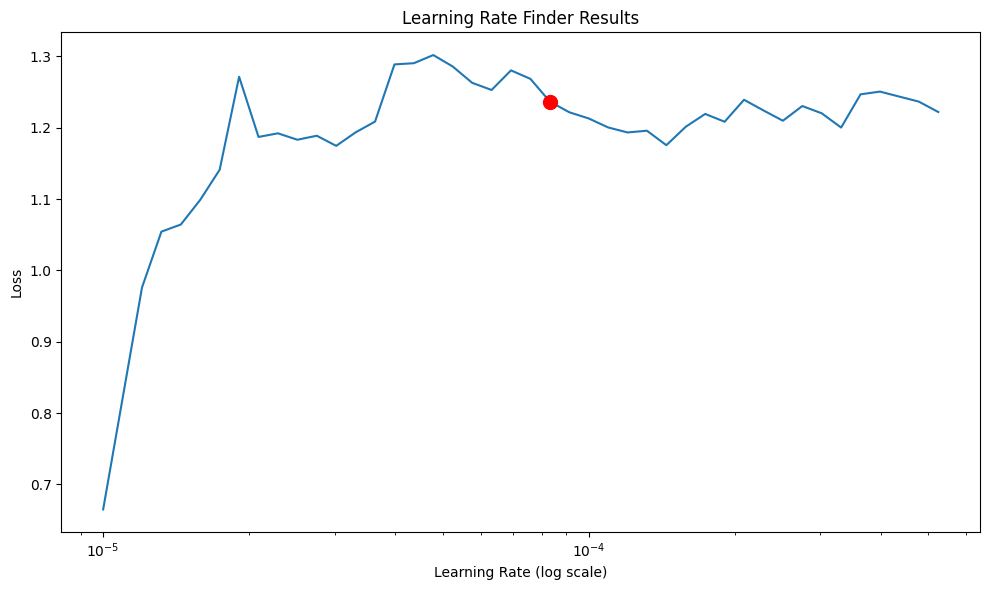

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 459.21it/s]
Learning rate set to 5.75439937337157e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_535569be-fc21-45d0-a5f2-cda56293f67f.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_535569be-fc21-45d0-a5f2-cda56293f67f.ckpt


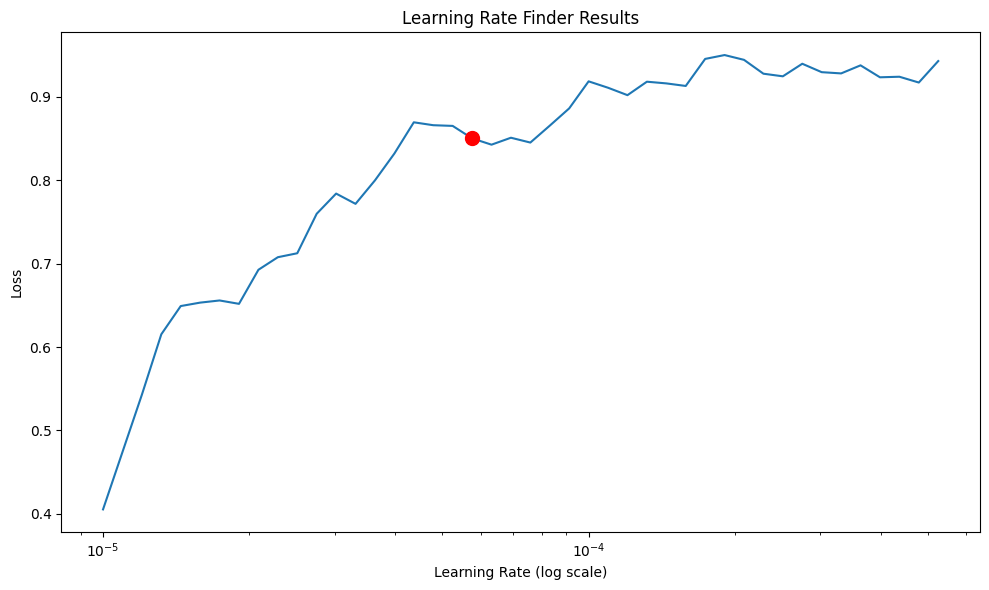

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00005754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  37%|███▋      | 37/100 [00:00<00:00, 368.27it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 379.28it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_fd0e3278-f56e-4f5b-9f8e-229a02a59330.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_fd0e3278-f56e-4f5b-9f8e-229a02a59330.ckpt


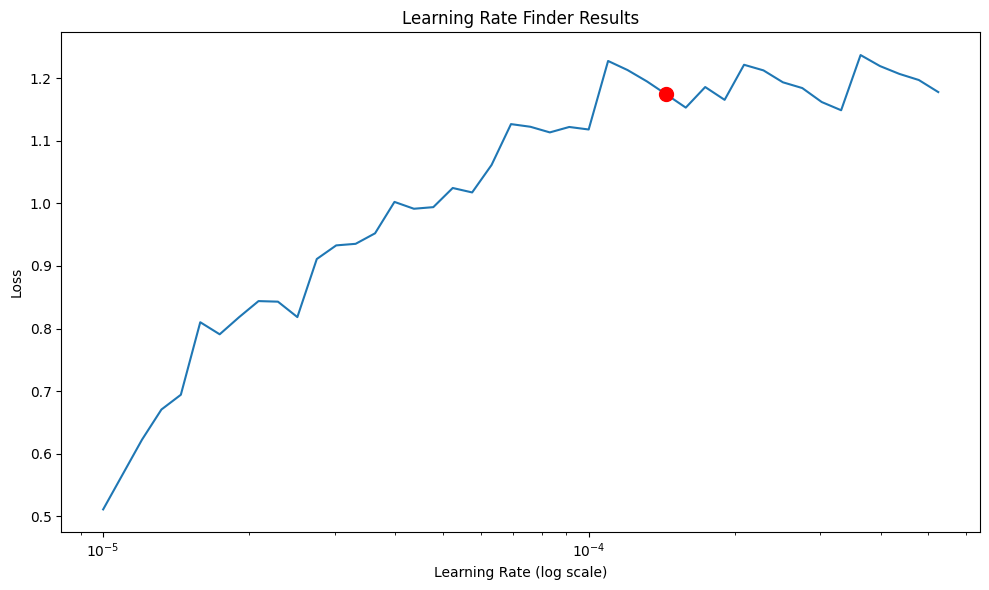

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00014454


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Evaluating models with 2 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 2: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef2_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 2...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 2:
  learning_rate: 0.0002527700246450032
  hidden_size: 128
  num_layers: 2
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for household_debt with lag 2:
  learning_rate: 0.0007053932086065256
  hidden_size: 128
  num_layers: 2
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for private_debt with lag 2:
  learning_rate: 0.000506088092078019
  hidden_size: 128
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 128
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 458.64it/s]
Learning rate set to 0.00020892961308540398
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2b3e971b-370a-4ee8-b86a-8a993b9f5cbb.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2b3e971b-370a-4ee8-b86a-8a993b9f5cbb.ckpt


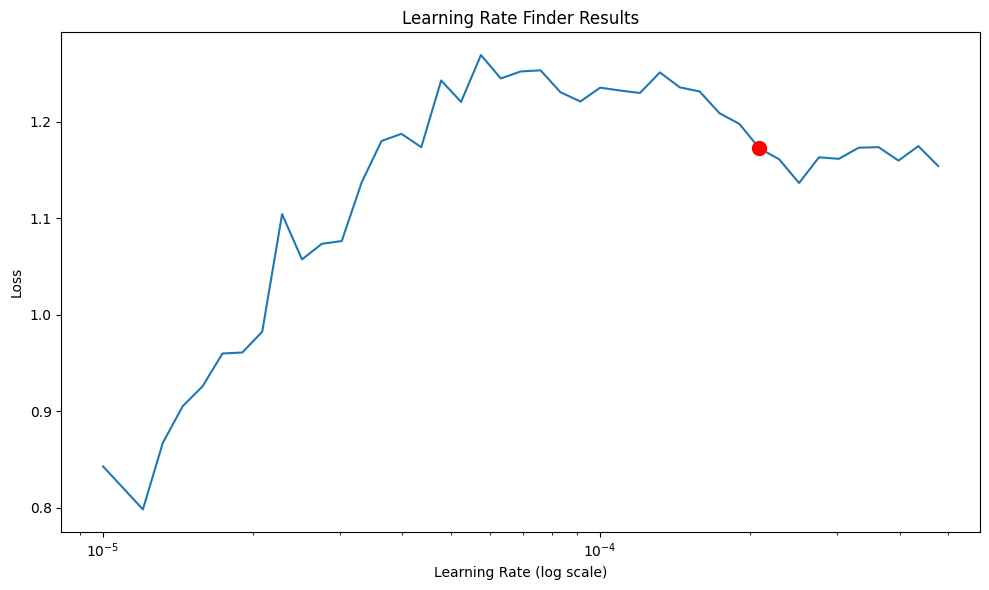

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00020893


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 545.20it/s]
Learning rate set to 0.00022908676527677737
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_580b220c-a368-416c-a252-1314a2f9962c.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_580b220c-a368-416c-a252-1314a2f9962c.ckpt


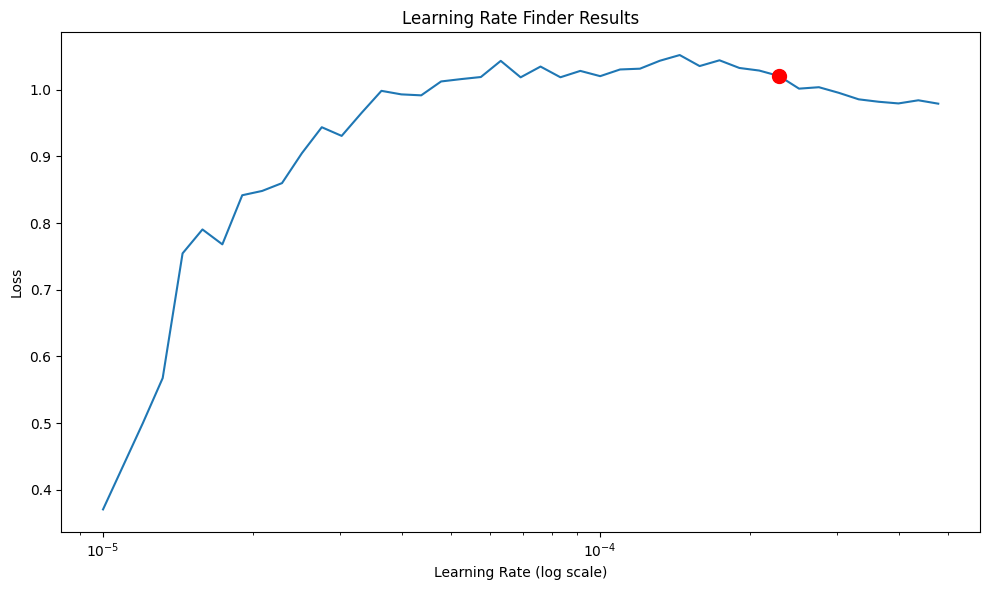

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00022909


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 528.33it/s]
Learning rate set to 9.120108393559098e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a87af786-b6b0-4ab6-ae08-76a383c68b31.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a87af786-b6b0-4ab6-ae08-76a383c68b31.ckpt


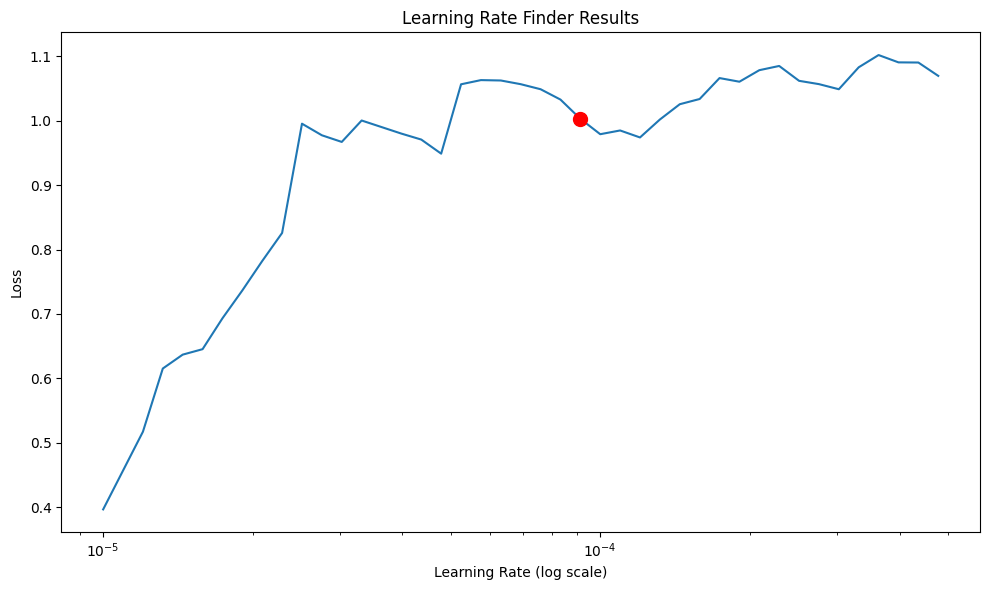

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00009120

Evaluating models with 3 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 3: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef3_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 3...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 3:
  learning_rate: 0.0002289790409903239
  hidden_size: 16
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for household_debt with lag 3:
  learning_rate: 1.9955401246782583e-05
  hidden_size: 32
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 64

Best hyperparameters for private_debt with lag 3:
  learning_rate: 7.92134476315123e-05
  hidden_size: 32
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 442.71it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_6bc750da-264b-45a8-8617-75b2ff046133.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_6bc750da-264b-45a8-8617-75b2ff046133.ckpt


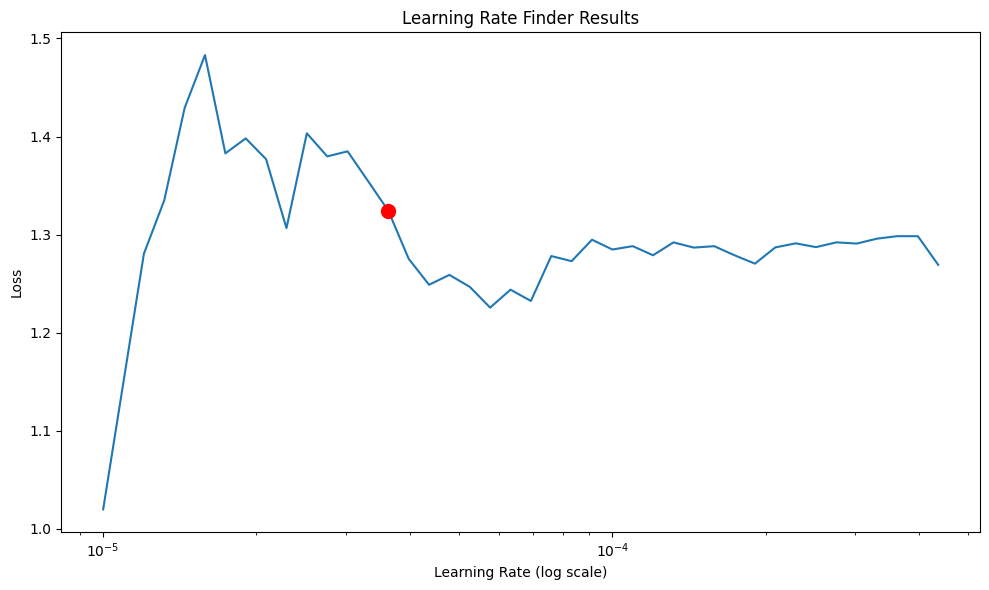

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00003631


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  35%|███▌      | 35/100 [00:00<00:00, 308.79it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 303.11it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2c2654c1-062c-49b8-9bd1-527038ac85a8.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2c2654c1-062c-49b8-9bd1-527038ac85a8.ckpt


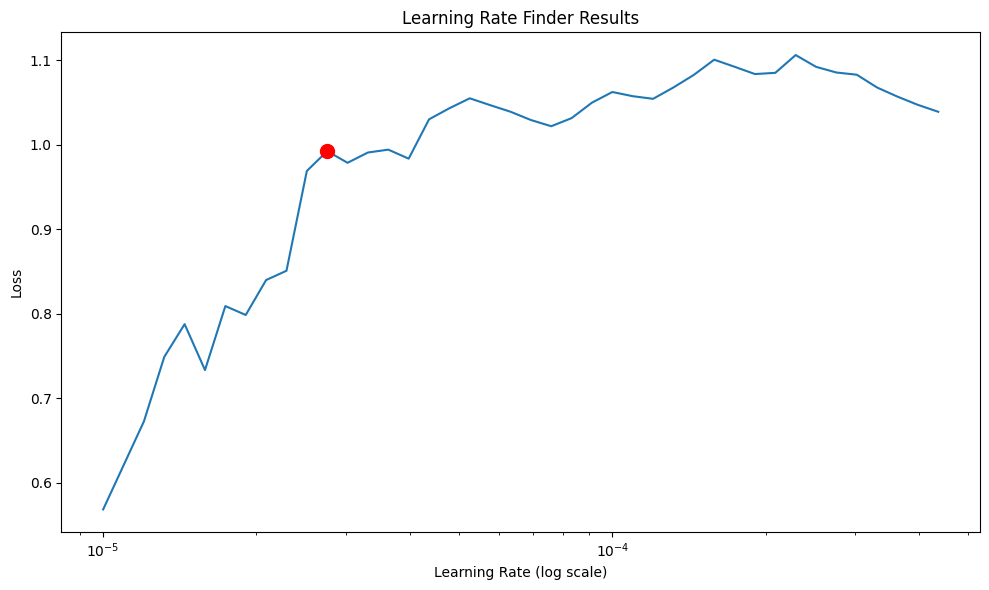

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/L

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 498.90it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5e8064d6-fd30-4ed4-bbb3-30995ea721fb.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5e8064d6-fd30-4ed4-bbb3-30995ea721fb.ckpt


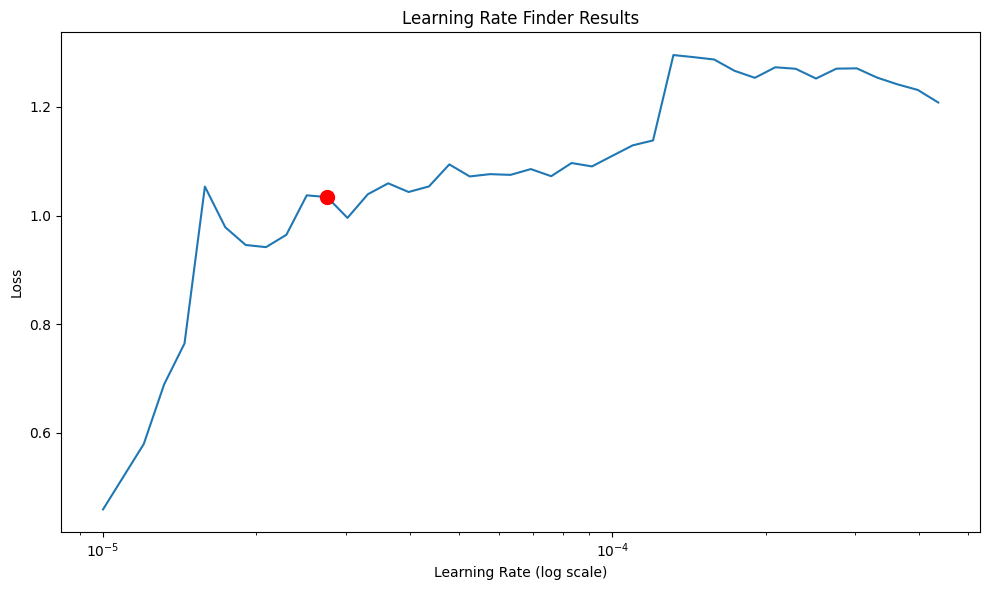

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 4 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 4: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef4_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 4...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 4:
  learning_rate: 7.938227663783552e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.5
  weight_decay: 0.0001
  batch_size: 32

Best hyperparameters for household_debt with lag 4:
  learning_rate: 1.0258343663958421e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 64

Best hyperparameters for private_debt with lag 4:
  learning_rate: 0.000127434020263035
  hidden_size: 16
  num_layers: 2
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 535.55it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_114cb51e-f8d7-4f78-ac25-2c78e41dcb88.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_114cb51e-f8d7-4f78-ac25-2c78e41dcb88.ckpt


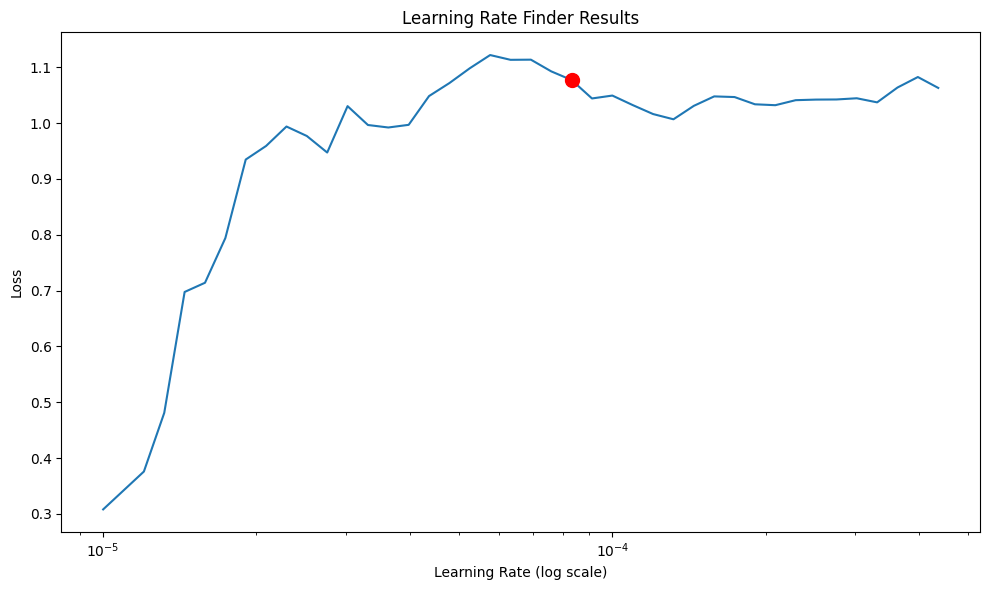

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 447.38it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_825d80cd-9940-420a-a4fa-13978dfecf2e.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_825d80cd-9940-420a-a4fa-13978dfecf2e.ckpt


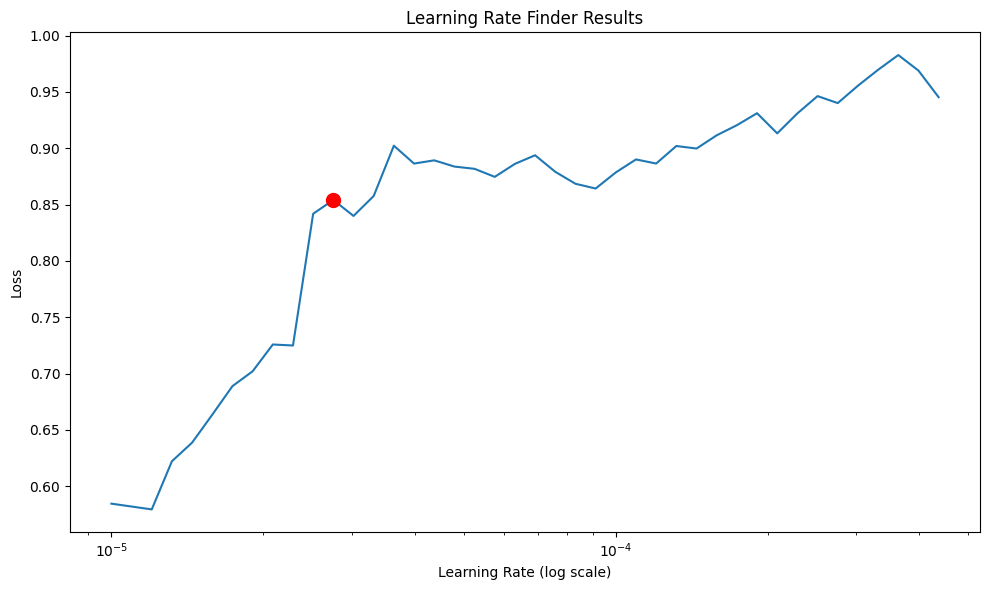

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 478.69it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7dfe6709-eef4-466b-8e80-d4044022469a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7dfe6709-eef4-466b-8e80-d4044022469a.ckpt


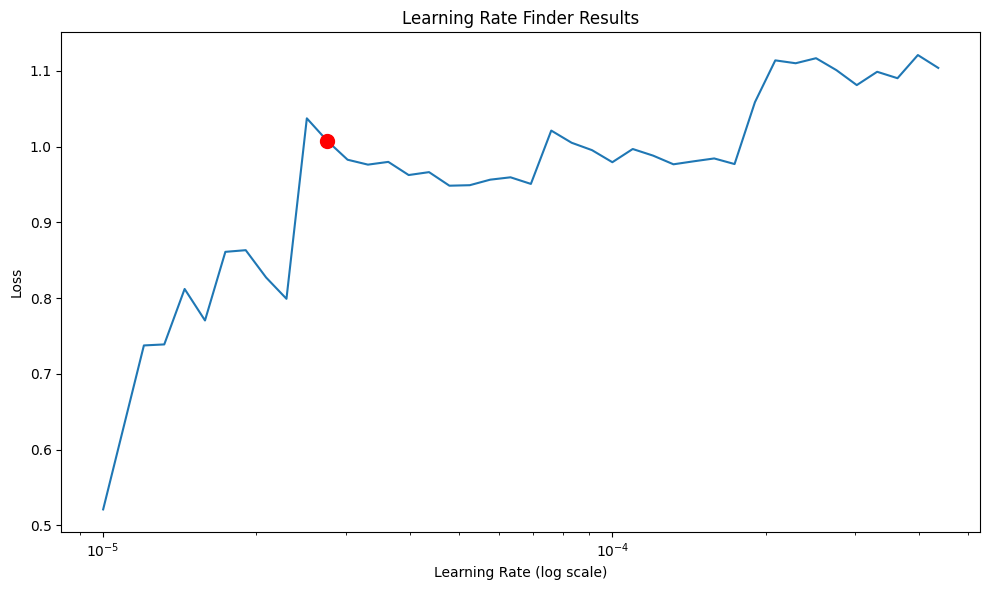

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 5 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 5: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef5_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 5...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 5:
  learning_rate: 0.0012438706805303098
  hidden_size: 32
  num_layers: 1
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for household_debt with lag 5:
  learning_rate: 0.000100716153826132
  hidden_size: 128
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 16

Best hyperparameters for private_debt with lag 5:
  learning_rate: 1.503395925227179e-05
  hidden_size: 128
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 634.45it/s]
Learning rate set to 3.981071705534973e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_24e9a407-26f8-4a0b-a778-b141d8ac2198.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_24e9a407-26f8-4a0b-a778-b141d8ac2198.ckpt


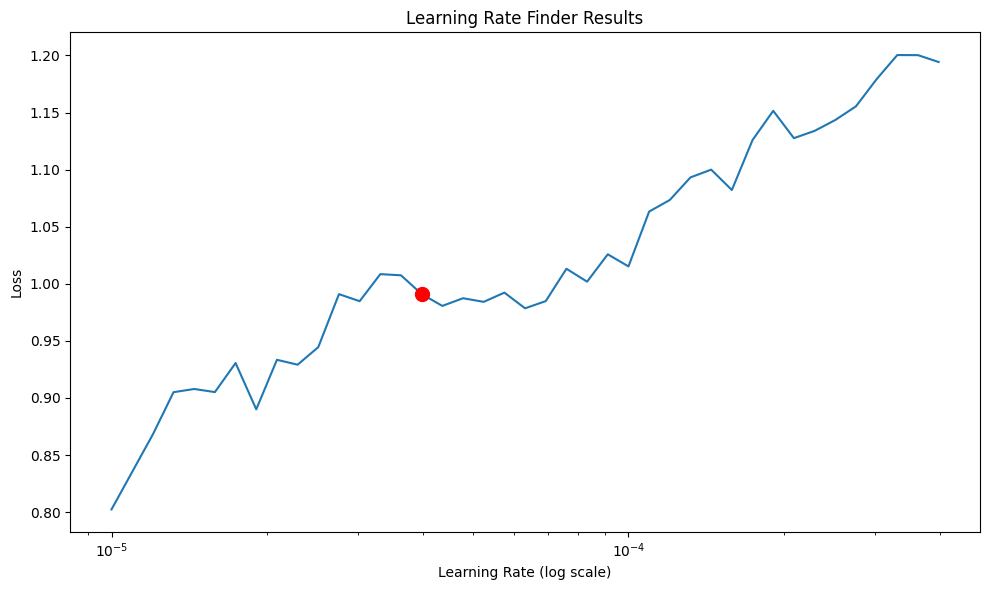

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00003981


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 533.26it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_9676039b-79b2-4b39-af29-712ec3fc5cf8.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_9676039b-79b2-4b39-af29-712ec3fc5cf8.ckpt


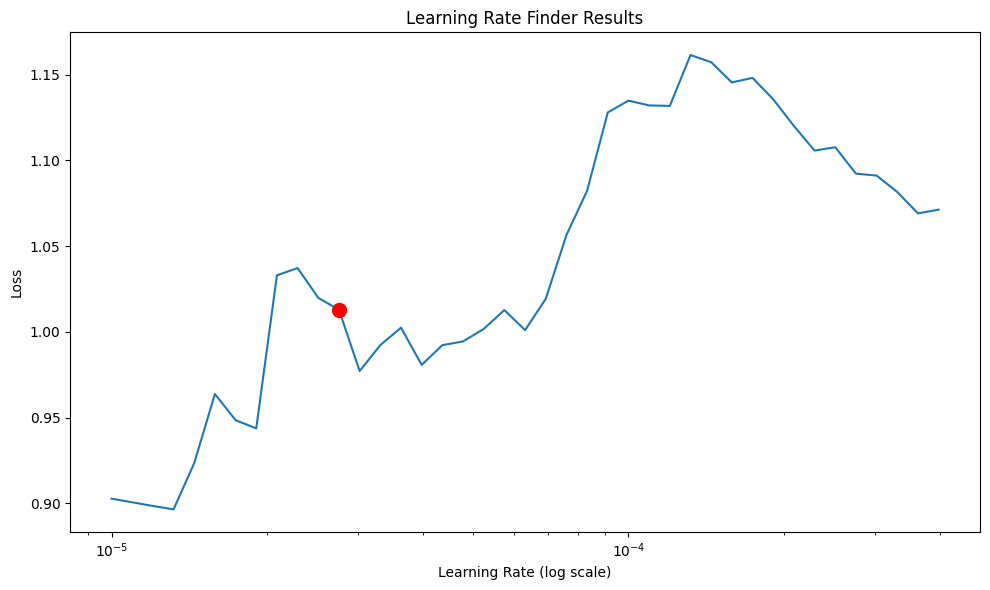

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 587.87it/s]
Learning rate set to 3.0199517204020165e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_88d33c93-122d-4907-aafa-d5564ba8c9d8.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_88d33c93-122d-4907-aafa-d5564ba8c9d8.ckpt


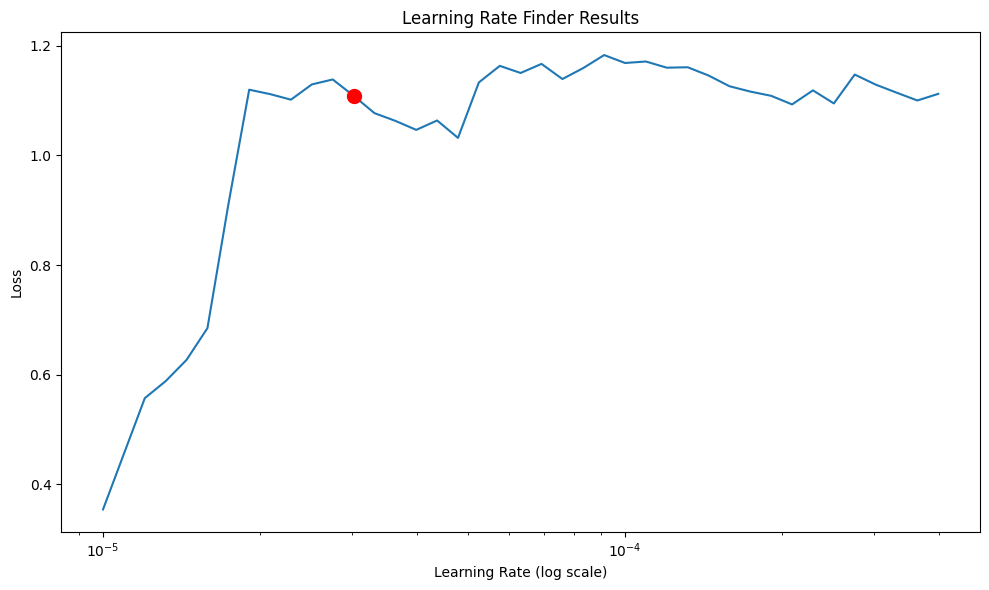

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003020

Evaluating models with 6 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 6: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef6_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 6...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 6:
  learning_rate: 0.00017508231295108298
  hidden_size: 64
  num_layers: 2
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 64

Best hyperparameters for household_debt with lag 6:
  learning_rate: 1.2922035950336921e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.5
  weight_decay: 0.01
  batch_size: 32

Best hyperparameters for private_debt with lag 6:
  learning_rate: 0.00022850264408829534
  hidden_size: 32
  num_layers: 3
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 599.95it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d158fa68-71f6-4555-8b90-d64969df18c3.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d158fa68-71f6-4555-8b90-d64969df18c3.ckpt


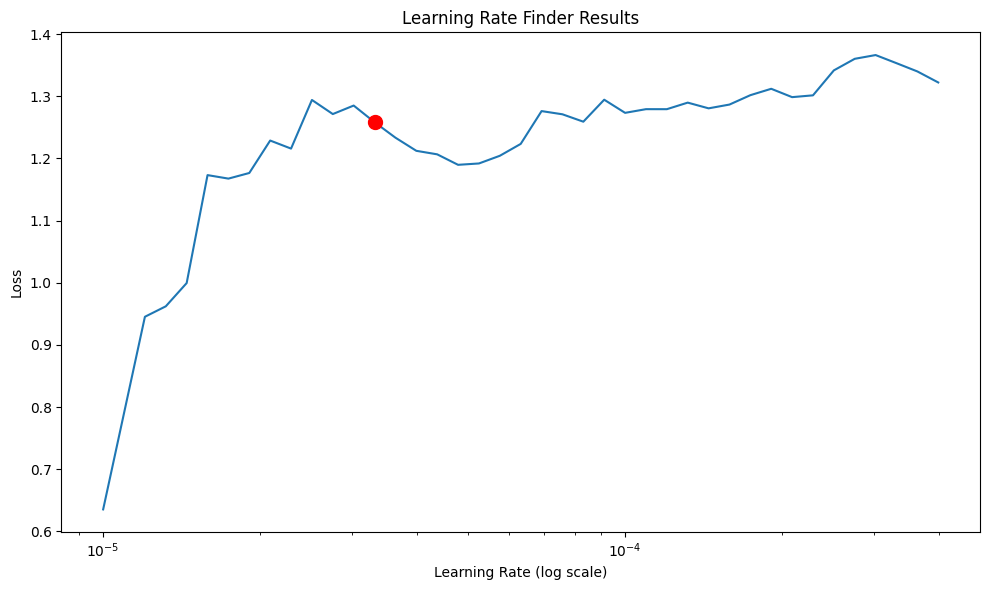

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 602.22it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_16a0703f-0c84-48c3-b482-ad9c3818835a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_16a0703f-0c84-48c3-b482-ad9c3818835a.ckpt


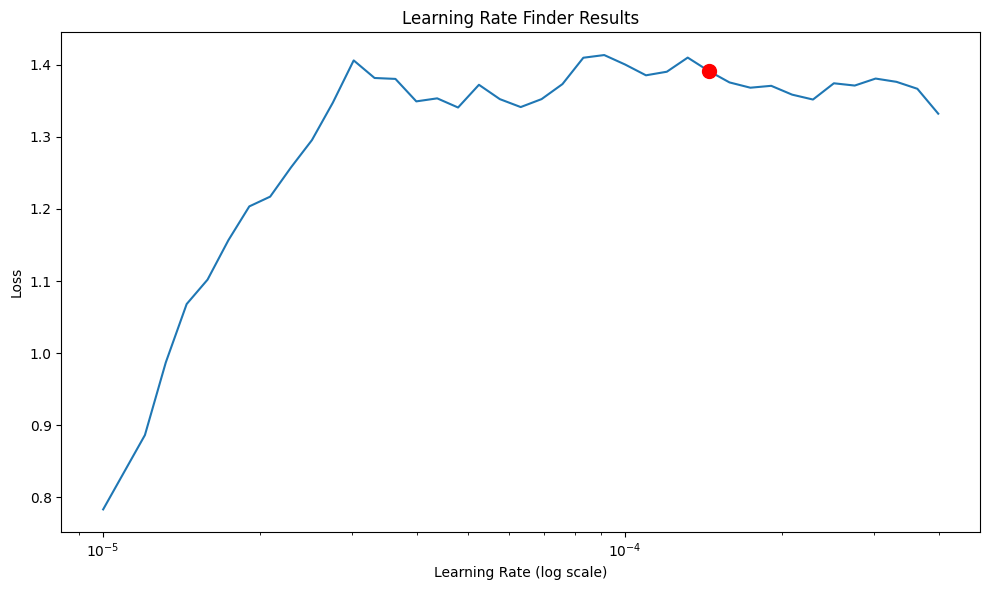

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 495.13it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_15f27320-150a-438c-a0da-8e1a14b34e5a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_15f27320-150a-438c-a0da-8e1a14b34e5a.ckpt


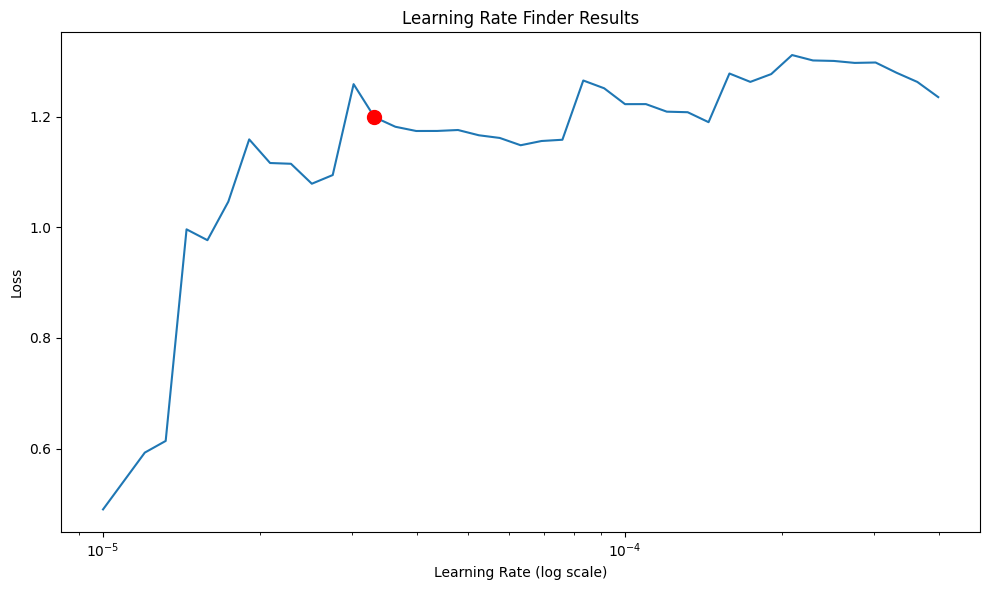

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


In [43]:
import deepvar.hyperopt as hyperopt
from var import var
import random
import numpy as np
import torch
import optuna
def evaluate_models_with_lags(final_detrend, train_dt_var, test_dt_var, variables, 
                             max_lags=6, n_trials=20, seed=42):
    """
    Evaluate VAR, Panel VAR, and DeepVAR models with different lag lengths
    
    Parameters:
    -----------
    final_detrend : DataFrame
        Detrended data
    train_dt_var : DataFrame
        Training data
    test_dt_var : DataFrame
        Test data
    variables : list
        List of variables to evaluate
    max_lags : int
        Maximum number of lags to evaluate
    n_trials : int
        Number of hyperparameter optimization trials
    seed : int
        Random seed for reproducibility
    
    Returns:
    --------
    tuple
        (results_dict, optimized_models_dict)
    """

    
    # Set seeds for reproducibility
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    # Also set the seed for Optuna
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    
    results = {
        'VAR': {var_name: {lag: {} for lag in range(1, max_lags+1)} for var_name in variables},
        'PVAR': {var_name: {lag: {} for lag in range(1, max_lags+1)} for var_name in variables},
        'DeepVAR': {var_name: {lag: {} for lag in range(1, max_lags+1)} for var_name in variables}
    }
    optimized_models_by_lag = {}
    
    for lag in range(1, max_lags+1):
        print(f"\nEvaluating models with {lag} lags...")
        
        # For each lag length, create a new lstm_df with the appropriate number of lags
        demeaned_df, cross_sectional_means, country_means = deepvar.prepare_data_with_fixed_effects(final_detrend, variables=variables)
        lstm_df = lstm.create_lstm_data(demeaned_df, lag)
        lstm_train, lstm_val, lstm_test = lstm.train_val_test_split(lstm_df)
        
        # Generate inputs for this lag specification
        inputs = lstm.get_lstm_input(final_detrend, lag)
        
        # 1. Evaluate VAR models
        for var_name in variables:
            var_metrics = var.get_test_errors(final_detrend, train_dt_var, test_dt_var, lag, var_name)
            results['VAR'][var_name][lag] = {
                'MSE': var_metrics[0],
                'RMSE': var_metrics[1],
                'MAE': var_metrics[2]
            }
        
        # 2. Evaluate Panel VAR models
        pvar_dict = {
            lag: f'./pvarcoefs_PD/coef{lag}_PD.xlsx'
        }
        
        # Create panel VAR data with appropriate lags
        panel_var_df = lstm.create_lstm_data(final_detrend, lag)
        
        # Run panel VAR predictions
        try:
            panel_var_pred, _ = run_panel_VAR_predict_new(panel_var_df, lstm_test, lag, pvar_dict)
            pvar_data_metrics_df = panel_var_pred + cross_sectional_means + country_means
            
            for var_name in variables:
                pvar_metrics = [
                    hp.calculate_mse(test_dt_var, pvar_data_metrics_df, var_name),
                    np.sqrt(hp.calculate_mse(test_dt_var, pvar_data_metrics_df, var_name)),
                    hp.calculate_mae(test_dt_var, pvar_data_metrics_df, var_name)
                ]
                results['PVAR'][var_name][lag] = {
                    'MSE': pvar_metrics[0],
                    'RMSE': pvar_metrics[1],
                    'MAE': pvar_metrics[2]
                }
        except Exception as e:
            print(f"Error evaluating Panel VAR with lag {lag}: {e}")
            # Set default values if Panel VAR fails
            for var_name in variables:
                results['PVAR'][var_name][lag] = {
                    'MSE': float('nan'),
                    'RMSE': float('nan'),
                    'MAE': float('nan')
                }
        
        # 3. Train and evaluate DeepVAR models with hyperparameter optimization
        print(f"Starting hyperparameter optimization for lag {lag}...")
        
        # Set seed for hyperparameter optimization
        lstm.set_seed(seed=seed)
        
        # Create a fixed seed for Optuna study
        optuna_seed = seed + lag  # Different seed for each lag to avoid identical results
        
        # Run hyperparameter optimization for all variables with fixed seed
        best_params = {}
        for variable in variables:
            print(f"Optimizing hyperparameters for {variable}")
            
            # Prepare data with fixed seed
            (X_train, y_train), (X_val, y_val), _, _, _ = lstm.prepare_lstm_data(lstm_df, inputs, [variable])
            
            # Create Optuna study with fixed seed
            sampler = optuna.samplers.TPESampler(seed=optuna_seed)
            study = optuna.create_study(direction="minimize", sampler=sampler)
            
            # Define objective function
            from functools import partial
            objective_func = partial(
                hyperopt.objective,
                X_train=X_train,
                y_train=y_train,
                X_val=X_val,
                y_val=y_val,
                input_size=X_train.shape[2]
            )
            
            # Run optimization
            study.optimize(objective_func, n_trials=n_trials)
            
            # Store best parameters
            best_params[variable] = study.best_params
                
        # print the best hyperparameters for each variable
        for var_name in variables:
            print(f"\nBest hyperparameters for {var_name} with lag {lag}:")
            for param_name, param_value in best_params[var_name].items():
                print(f"  {param_name}: {param_value}")
        
        
        optimized_model_dict = {}
        
        for var_name in variables:
            print(f"Training model for {var_name} with optimized hyperparameters...")
            params = best_params[var_name]
            
            # Reset seed before finding learning rate
            lstm.set_seed(seed=seed)
            
            # Find optimal learning rate
            best_lr = lstm.find_learning_rate(lstm_df, inputs, var_name, min_lr=1e-5, max_lr=1e-1)
            
            model_params = {
                'learning_rate': best_lr,
                'hidden_size': params['hidden_size'],
                'dropout': params['dropout'],
                'weight_decay': params['weight_decay'],
                'batch_size': params['batch_size'],
                'num_epochs': 500  # Use a fixed number of epochs
            }
            
            # Reset seed before training
            lstm.set_seed(seed=seed)
            
            # Train the model with the optimized parameters
            model, predictions, metrics, scaler_X, scaler_y = lstm.train_lstm_model(
                lstm_df, 
                inputs, 
                [var_name], 
                **model_params
            )
            
            # Store in the format expected by autoregressive_predict
            optimized_model_dict[var_name] = (model, predictions, metrics, scaler_X, scaler_y)
        
        optimized_models_by_lag[lag] = {
            'model_dict': optimized_model_dict,
            'inputs': inputs
        }

        # Evaluate DeepVAR models
        for var_name in variables:
            deepvar_metrics = test_errors(
                lstm_df, lstm_test, test_dt_var, var_name, 
                optimized_model_dict, inputs, lag, 
                cross_sectional_means, country_means
            )
            results['DeepVAR'][var_name][lag] = {
                'MSE': deepvar_metrics[0],
                'RMSE': deepvar_metrics[1],
                'MAE': deepvar_metrics[2]
            }
    
    return results, optimized_models_by_lag

def create_latex_table_from_results(results, variables):
    """
    Create a LaTeX table from the evaluation results
    """
    latex_tables = {}
    
    for var_name in variables:
        # Start LaTeX table
        latex = "\\begin{table}[htbp]\n"
        latex += "\\centering\n"
        latex += f"\\caption{{Performance Comparison for {var_name}}}\n"
        latex += "\\begin{tabular}{lccccccc}\n"
        latex += "\\hline\n"
        latex += "\\textbf{Model} & \\textbf{Metric} & \\textbf{Lag 1} & \\textbf{Lag 2} & \\textbf{Lag 3} & \\textbf{Lag 4} & \\textbf{Lag 5} & \\textbf{Lag 6} \\\\\n"
        latex += "\\hline\n"
        
        
        for model in ['VAR', 'PVAR', 'DeepVAR']:
            # MSE row
            latex += f"{model} & MSE "
            for lag in range(1, 7):
                if lag in results[model][var_name]:
                    latex += f"& {results[model][var_name][lag]['MSE']:.6f} "
                else:
                    latex += "& - "
            latex += "\\\\\n"
            
            # RMSE row
            latex += f" & RMSE "
            for lag in range(1, 7):
                if lag in results[model][var_name]:
                    latex += f"& {results[model][var_name][lag]['RMSE']:.6f} "
                else:
                    latex += "& - "
            latex += "\\\\\n"
            
            # MAE row
            latex += f" & MAE "
            for lag in range(1, 7):
                if lag in results[model][var_name]:
                    latex += f"& {results[model][var_name][lag]['MAE']:.6f} "
                else:
                    latex += "& - "
            latex += "\\\\\n"
            
            # Add a separator line between models
            if model != 'DeepVAR':
                latex += "\\hline\n"
        
        # End LaTeX table
        latex += "\\hline\n"
        latex += "\\end{tabular}\n"
        latex += "\\end{table}"
        
        latex_tables[var_name] = latex
    
    return latex_tables

max_lags_to_evaluate = 6
variables_to_evaluate = ['log_GDP', 'household_debt', 'private_debt'] 

# takes a while to run
all_results, model_dict_1 = evaluate_models_with_lags(
    final_detrend, 
    train_dt_var, 
    test_dt_var, 
    variables_to_evaluate, 
    max_lags=max_lags_to_evaluate,
)



In [44]:
# Best hyperparameters for log_GDP with lag 1:
#   learning_rate: 0.000124530028757876
#   hidden_size: 16
#   num_layers: 3
#   dropout: 0.1
#   weight_decay: 0.01
#   batch_size: 64

# Best hyperparameters for household_debt with lag 1:
#   learning_rate: 2.2139290514335146e-05
#   hidden_size: 16
#   num_layers: 1
#   dropout: 0.4
#   weight_decay: 0.0001
#   batch_size: 128


# Best hyperparameters for log_GDP with lag 1:
#   learning_rate: 0.00023974709913404535
#   hidden_size: 16
#   num_layers: 3
#   dropout: 0.1
#   weight_decay: 0.0001
#   batch_size: 64

# Best hyperparameters for household_debt with lag 1:
#   learning_rate: 0.0003344036652141134
#   hidden_size: 64
#   num_layers: 1
#   dropout: 0.2
#   weight_decay: 1e-05
#   batch_size: 64

In [45]:

# # Generate LaTeX tables
# latex_tables = create_latex_table_from_results(all_results, variables_to_evaluate)

# # Display the LaTeX tables
# for var, table in latex_tables.items():
#     print(f"\nLaTeX table for {var}:")
#     print(table)


   log_GDP_lag1  log_GDP_lag2  log_GDP_lag3  log_GDP_lag4  log_GDP_lag5  \
0           0.0           0.0           0.0           0.0           0.0   

   log_GDP_lag6  household_debt_lag1  household_debt_lag2  \
0           0.0                  0.0                  0.0   

   household_debt_lag3  household_debt_lag4  household_debt_lag5  \
0                  0.0                  0.0                  0.0   

   household_debt_lag6  private_debt_lag1  private_debt_lag2  \
0                  0.0                0.0                0.0   

   private_debt_lag3  private_debt_lag4  private_debt_lag5  private_debt_lag6  
0                0.0                0.0                0.0                0.0  
   log_GDP_lag1  log_GDP_lag2  log_GDP_lag3  log_GDP_lag4  log_GDP_lag5  \
0           0.0           0.0           0.0           0.0           0.0   

   log_GDP_lag6  household_debt_lag1  household_debt_lag2  \
0           0.0                  0.0                  0.0   

   household_debt_lag3  ho

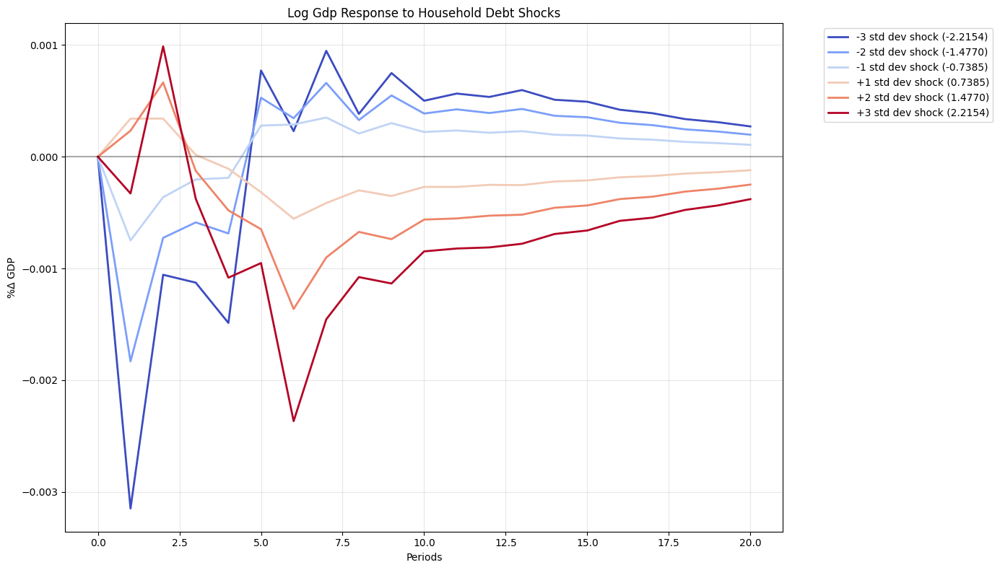

In [46]:
for lag in range(1,2):
    lag = 6
    lag_inputs = model_dict_1[lag]['inputs']
    df_zeros = pd.DataFrame(np.zeros((1, len(lag_inputs))), columns=lag_inputs)
    plot_irf_with_multiple_shocks(
        df_zeros, 
        lag_inputs,  
        'household_debt_lag1', 
        'log_GDP', 
        model_dict_1[lag]['model_dict'], 
        lag,  
        periods=20, 
        std_multipliers=std_multipliers
    )


Seed Robustness Check


Evaluating models with 1 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 1: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef1_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 1...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 1:
  learning_rate: 0.0008441868903460493
  hidden_size: 64
  num_layers: 3
  dropout: 0.4
  weight_decay: 0.01
  batch_size: 32

Best hyperparameters for household_debt with lag 1:
  learning_rate: 3.679193455922983e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.2
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for private_debt with lag 1:
  learning_rate: 1.9960496018639572e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.01
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 491.00it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a5964977-3cd5-4560-b8db-f6f1b25281ec.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a5964977-3cd5-4560-b8db-f6f1b25281ec.ckpt


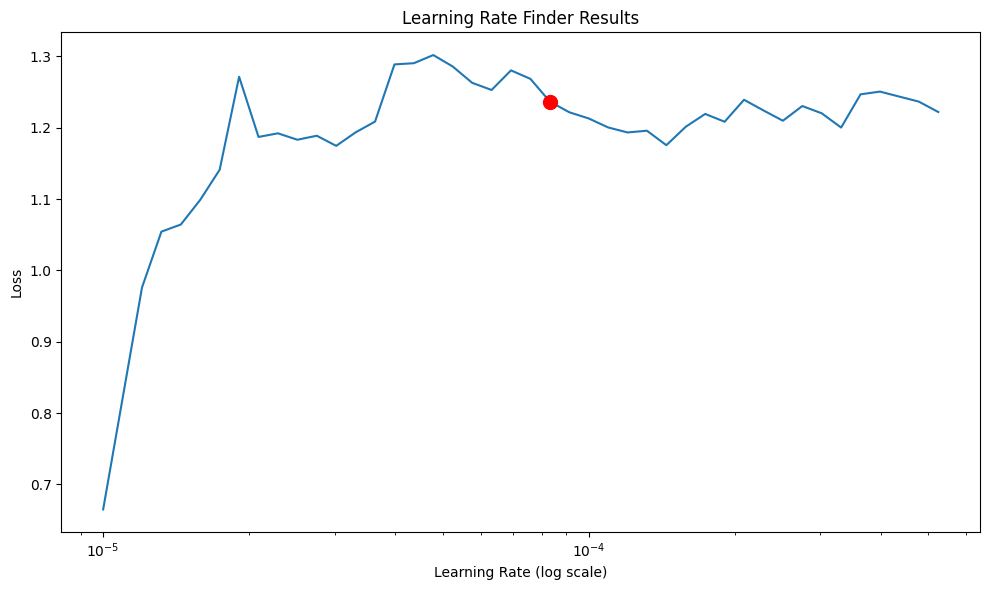

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00008318


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 606.09it/s]
Learning rate set to 5.75439937337157e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3573a042-28b9-4b55-b58e-47649b02efec.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3573a042-28b9-4b55-b58e-47649b02efec.ckpt


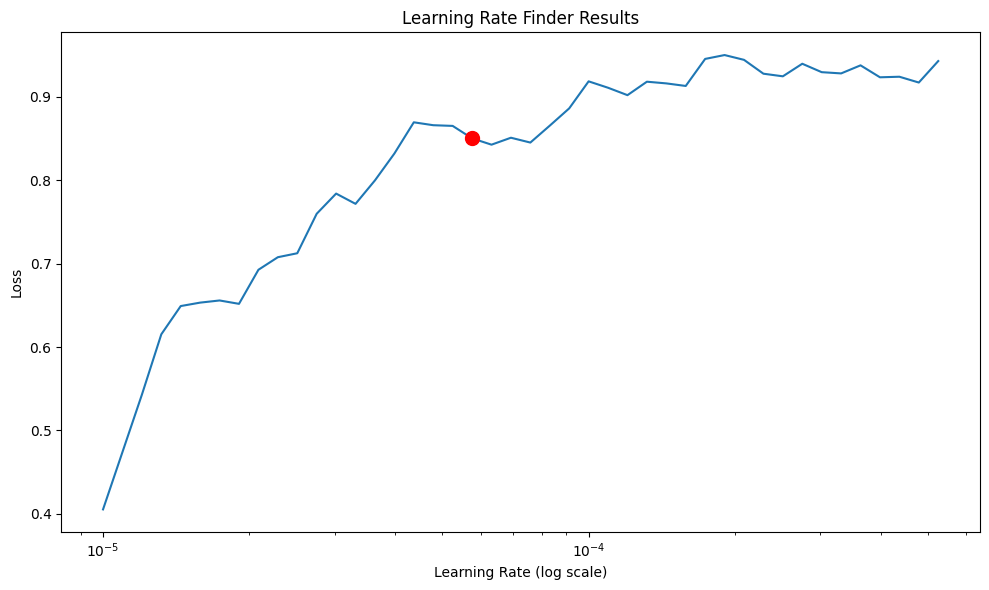

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00005754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 479.41it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_c991ce6c-2959-4a0f-b332-351566b9a3d7.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_c991ce6c-2959-4a0f-b332-351566b9a3d7.ckpt


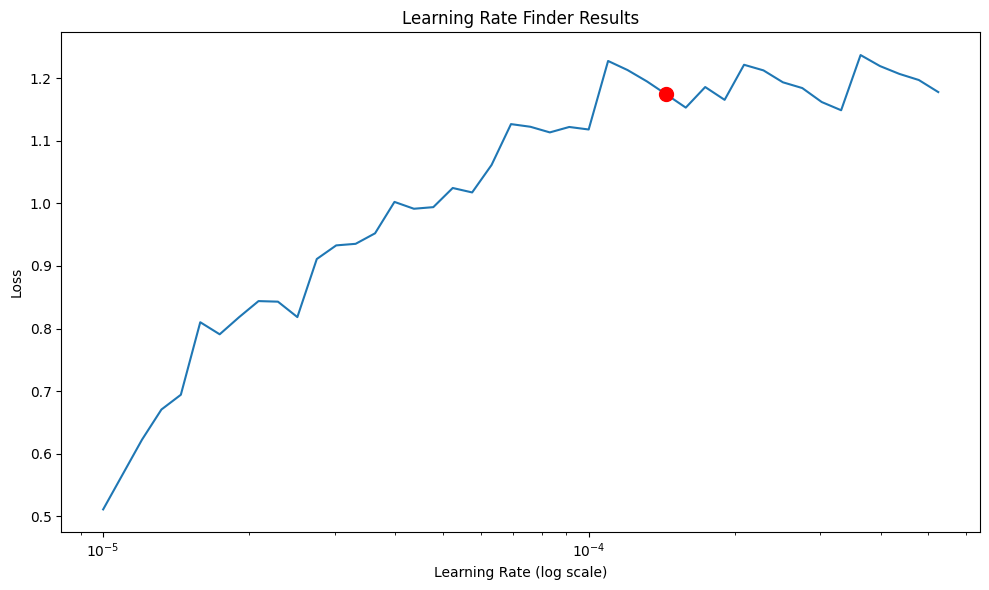

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454

Evaluating models with 2 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 2: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef2_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 2...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 2:
  learning_rate: 3.8366619902207425e-05
  hidden_size: 16
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for household_debt with lag 2:
  learning_rate: 0.0001140715666811961
  hidden_size: 128
  num_layers: 2
  dropout: 0.5
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for private_debt with lag 2:
  learning_rate: 4.2247710158955436e-05
  hidden_size: 16
  num_layers: 2
  dropout: 0.3
  weight_decay: 0.01
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 631.49it/s]
Learning rate set to 0.00020892961308540398
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b715903d-b441-4923-a537-cc3720843caf.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b715903d-b441-4923-a537-cc3720843caf.ckpt


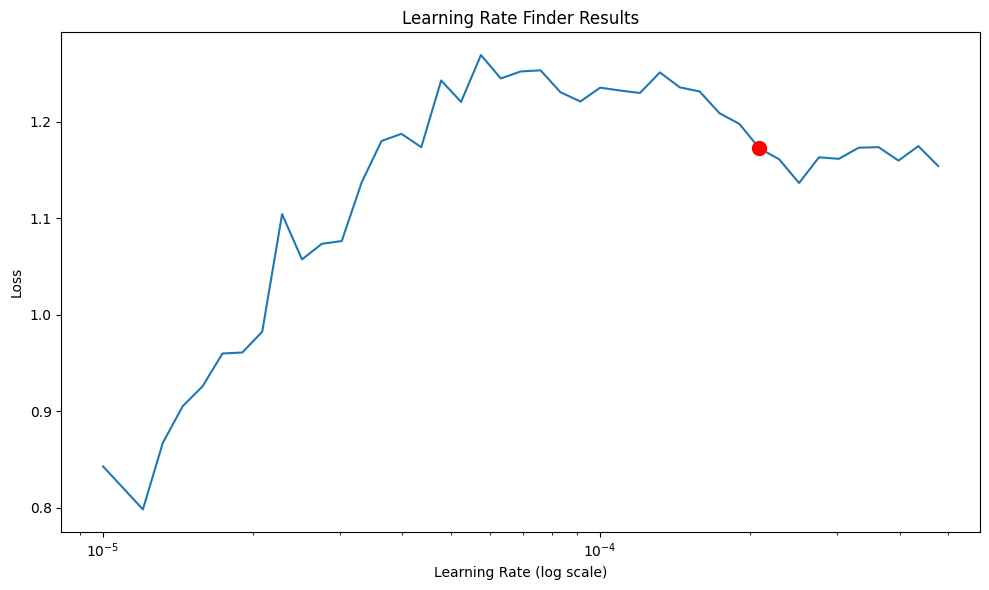

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00020893


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 612.56it/s]
Learning rate set to 0.00022908676527677737
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_64ce2025-b17b-4413-aba7-cdad9827b6f6.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_64ce2025-b17b-4413-aba7-cdad9827b6f6.ckpt


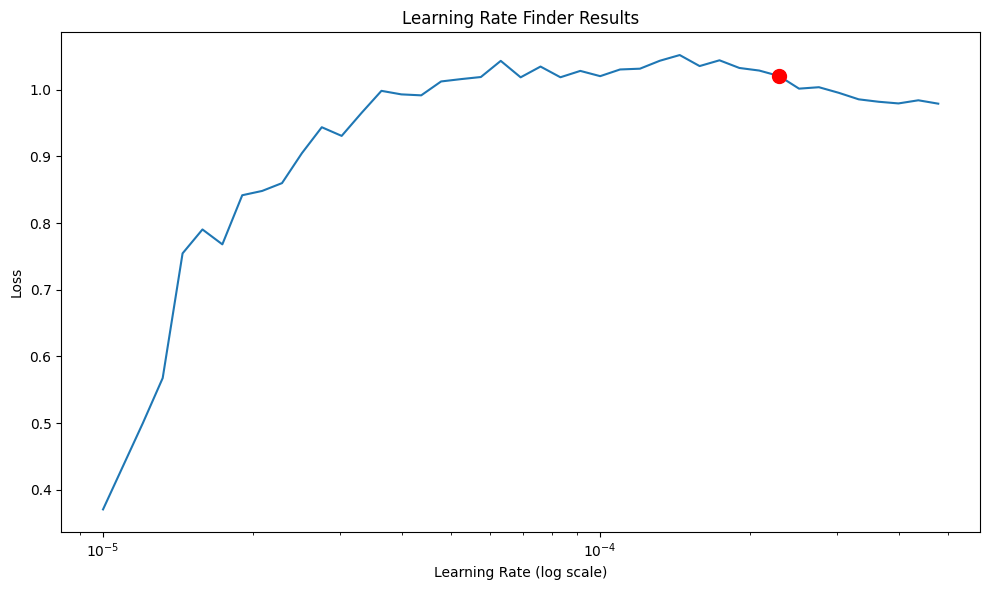

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00022909


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 579.83it/s]
Learning rate set to 9.120108393559098e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7f1145be-b4d7-400c-98cc-346105fe0895.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7f1145be-b4d7-400c-98cc-346105fe0895.ckpt


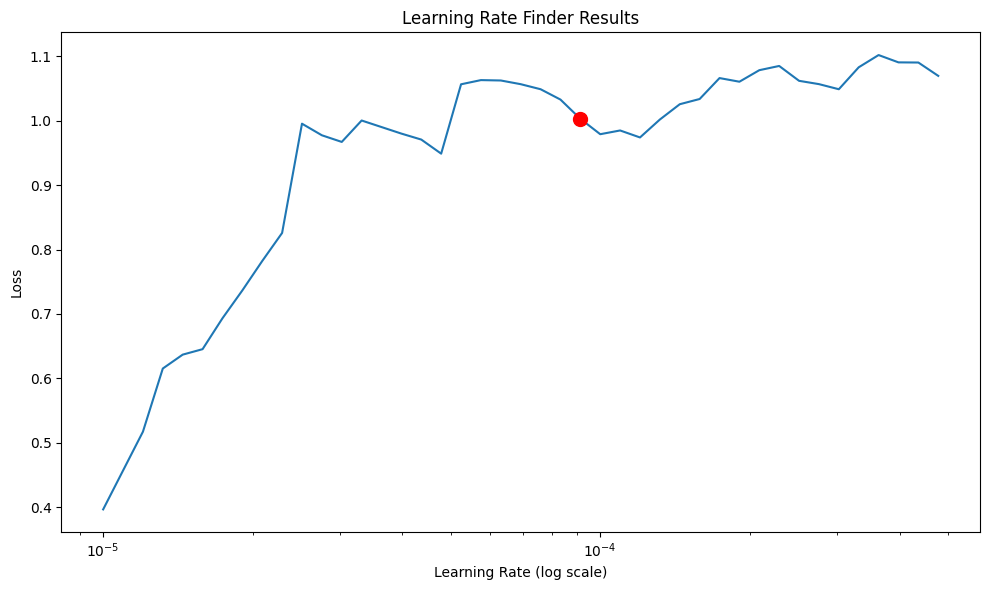

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00009120

Evaluating models with 3 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 3: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef3_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 3...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 3:
  learning_rate: 0.00020165419627913995
  hidden_size: 32
  num_layers: 1
  dropout: 0.3
  weight_decay: 1e-05
  batch_size: 32

Best hyperparameters for household_debt with lag 3:
  learning_rate: 0.00018836865280016745
  hidden_size: 128
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for private_debt with lag 3:
  learning_rate: 0.00018836865280016745
  hidden_size: 128
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 613.64it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7bf81fc4-09d4-45e4-afc9-71b4af4ad748.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7bf81fc4-09d4-45e4-afc9-71b4af4ad748.ckpt


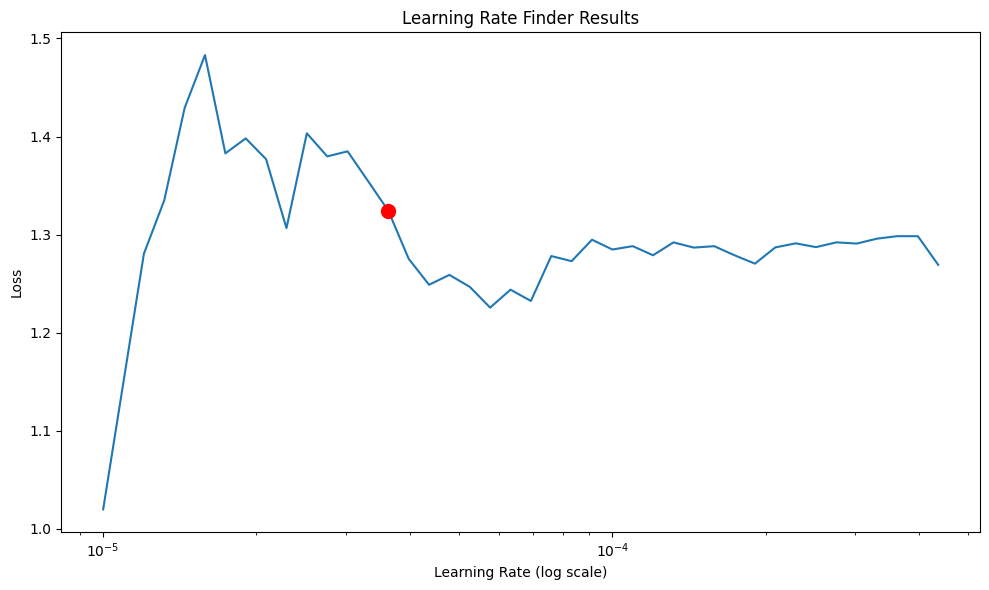

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003631


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 607.04it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2fecbf00-6c7f-45fa-8b9b-845480b7bcdc.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2fecbf00-6c7f-45fa-8b9b-845480b7bcdc.ckpt


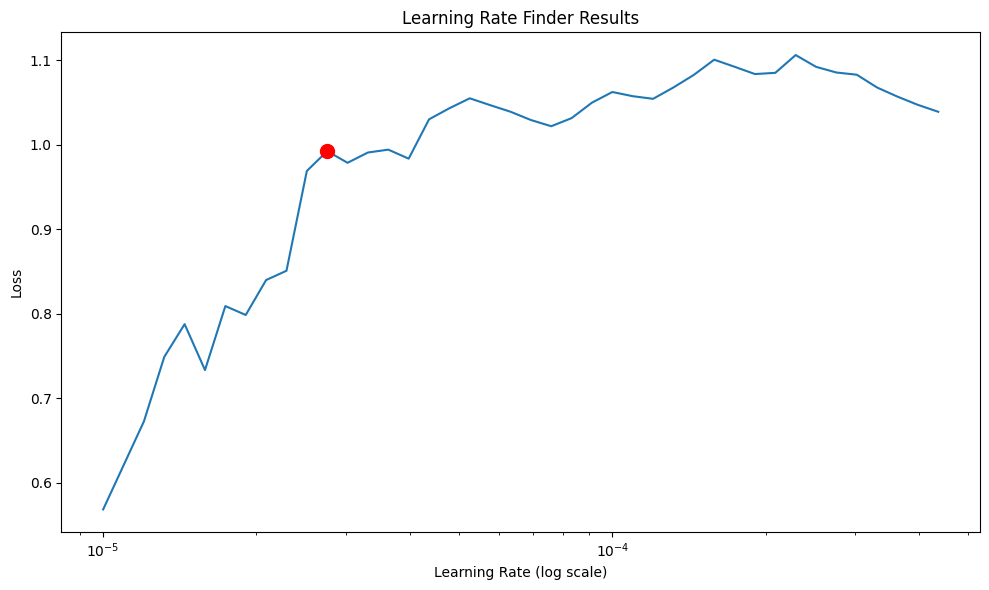

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 607.47it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8920f547-ea98-42bb-8522-213105618d9c.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8920f547-ea98-42bb-8522-213105618d9c.ckpt


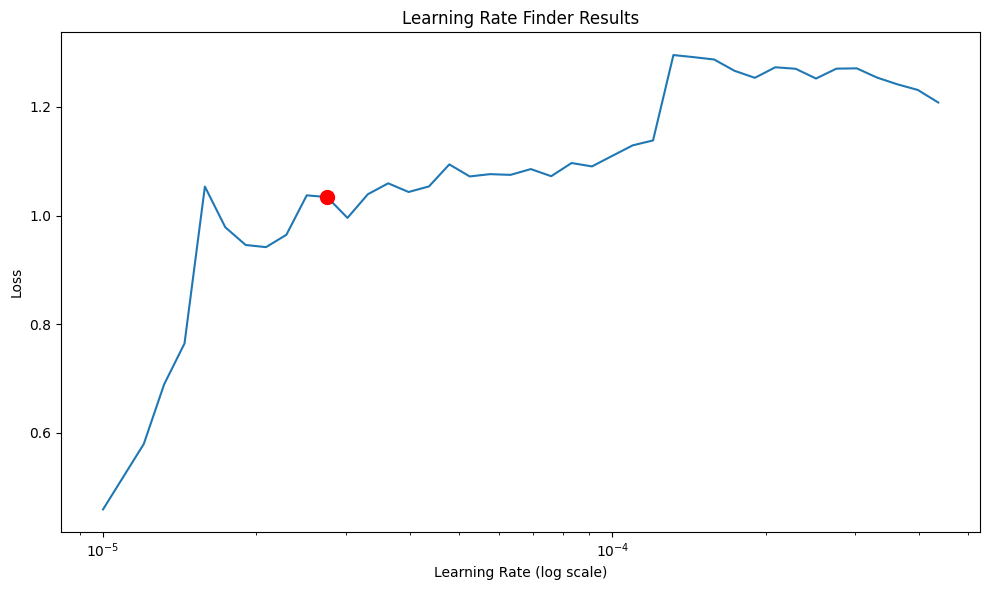

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Evaluating models with 4 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 4: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef4_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 4...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 4:
  learning_rate: 0.007068659765417669
  hidden_size: 64
  num_layers: 2
  dropout: 0.2
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for household_debt with lag 4:
  learning_rate: 9.925578314495101e-05
  hidden_size: 32
  num_layers: 3
  dropout: 0.5
  weight_decay: 0.01
  batch_size: 64

Best hyperparameters for private_debt with lag 4:
  learning_rate: 0.0002495376993658721
  hidden_size: 64
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.0001
  batch_size: 128
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 599.03it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_cfde822c-9b0e-478a-a2b5-8bcd5ec3f382.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_cfde822c-9b0e-478a-a2b5-8bcd5ec3f382.ckpt


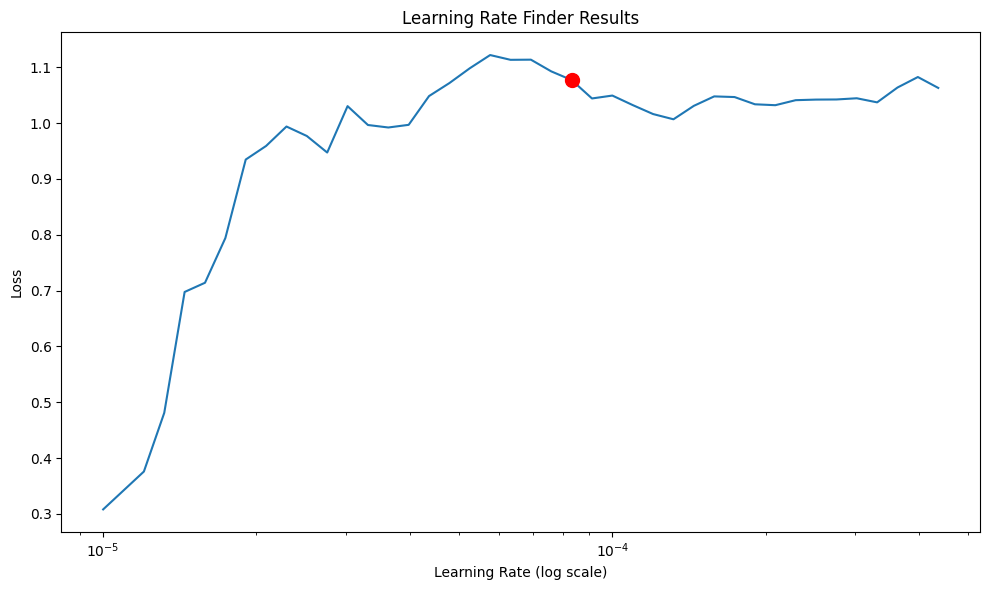

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 603.62it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_eb9c40f1-c6f6-4b19-9113-71fe1bfbf0af.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_eb9c40f1-c6f6-4b19-9113-71fe1bfbf0af.ckpt


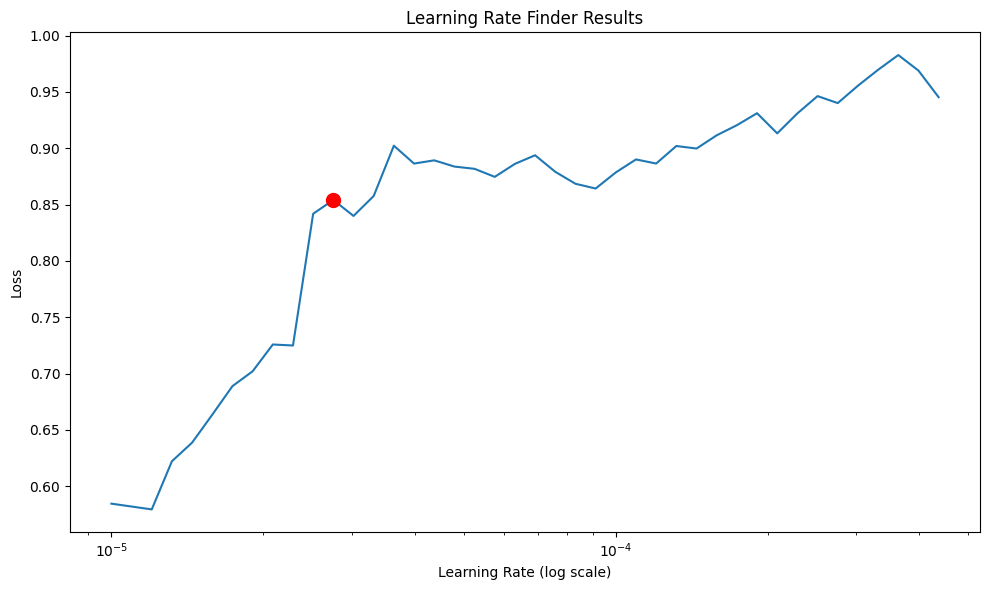

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 575.32it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3b8e9b5f-6bf2-40df-a4e7-5d598cd921d3.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3b8e9b5f-6bf2-40df-a4e7-5d598cd921d3.ckpt


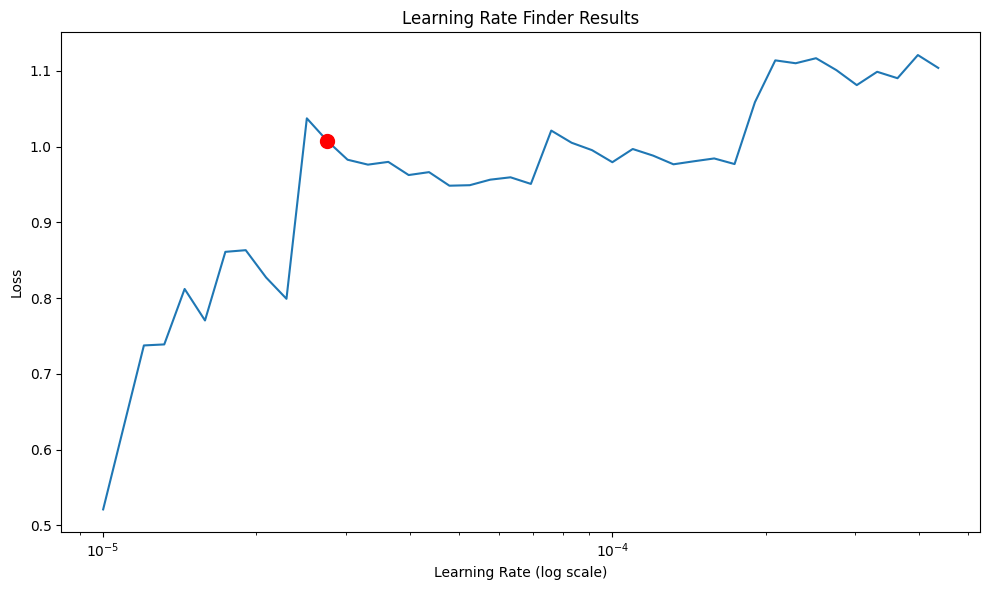

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 5 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 5: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef5_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 5...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 5:
  learning_rate: 0.000819913733534187
  hidden_size: 32
  num_layers: 2
  dropout: 0.2
  weight_decay: 1e-05
  batch_size: 128

Best hyperparameters for household_debt with lag 5:
  learning_rate: 0.00010030099744732191
  hidden_size: 64
  num_layers: 2
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 64

Best hyperparameters for private_debt with lag 5:
  learning_rate: 1.4001502504701307e-05
  hidden_size: 32
  num_layers: 3
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 553.82it/s]
Learning rate set to 3.981071705534973e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0de185d1-3621-42e2-933c-01983d8e34af.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0de185d1-3621-42e2-933c-01983d8e34af.ckpt


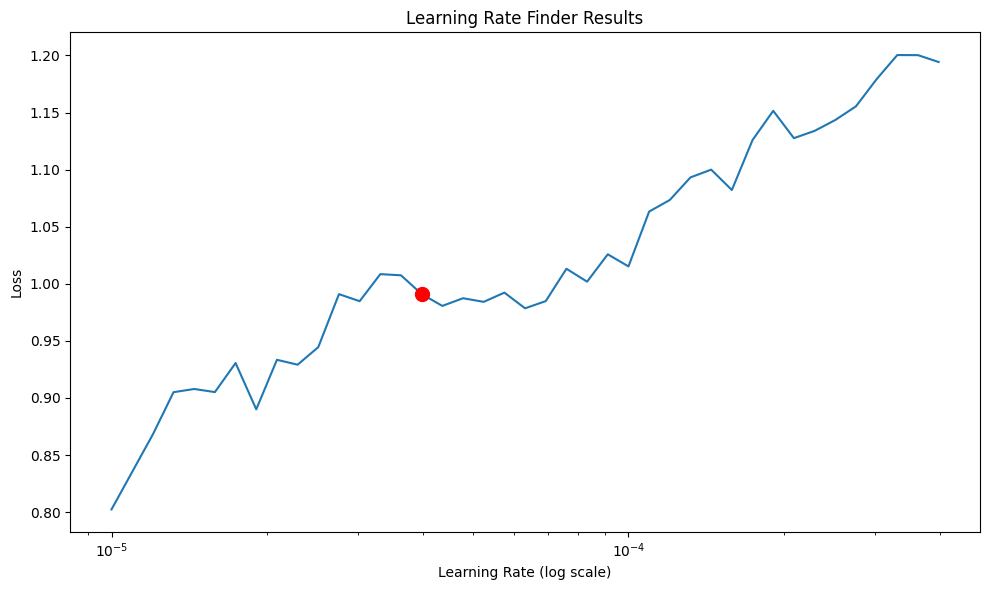

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00003981


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 560.04it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_85be6072-bb44-469d-86e0-8a4652c279ef.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_85be6072-bb44-469d-86e0-8a4652c279ef.ckpt


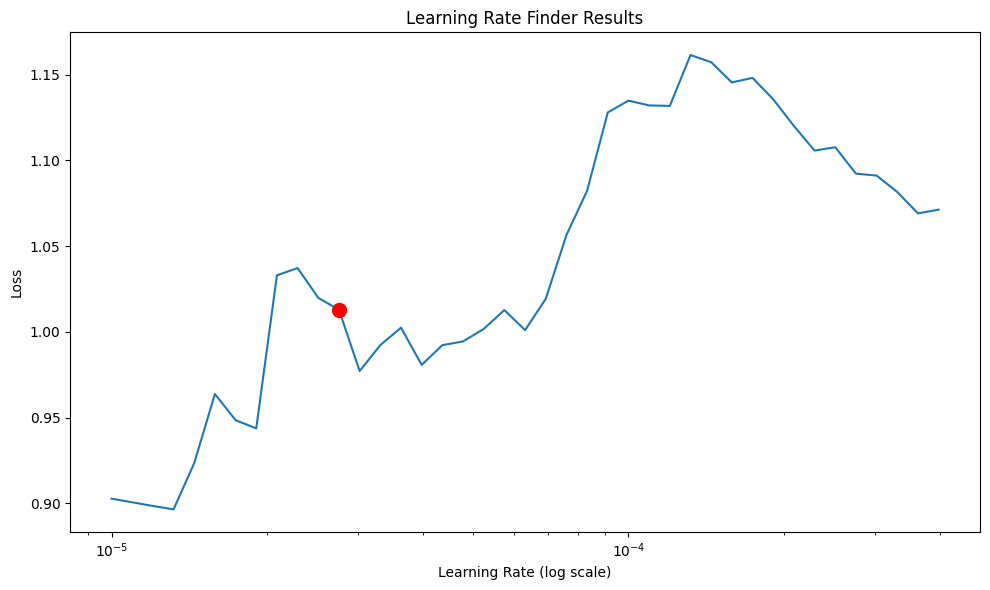

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 575.85it/s]
Learning rate set to 3.0199517204020165e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3d3fb9ea-af70-41a3-be75-38408692797a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3d3fb9ea-af70-41a3-be75-38408692797a.ckpt


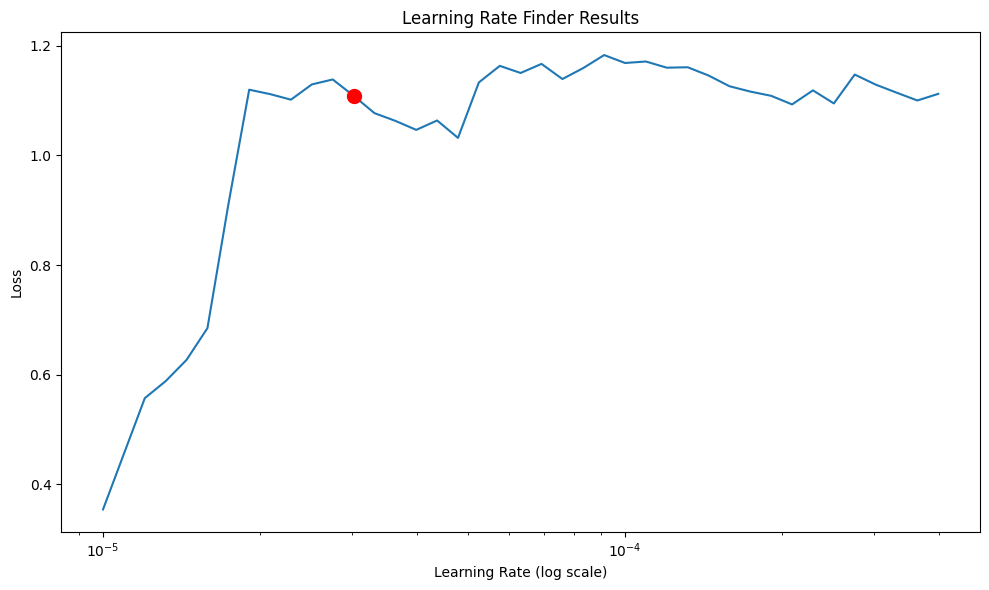

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003020

Evaluating models with 6 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 6: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef6_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 6...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 6:
  learning_rate: 0.0026207721263742743
  hidden_size: 64
  num_layers: 3
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for household_debt with lag 6:
  learning_rate: 0.009533750781435937
  hidden_size: 128
  num_layers: 2
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 64

Best hyperparameters for private_debt with lag 6:
  learning_rate: 0.00064287123430775
  hidden_size: 16
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 629.27it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b2405c98-3c2d-42f4-944b-4a4e1af4e413.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b2405c98-3c2d-42f4-944b-4a4e1af4e413.ckpt


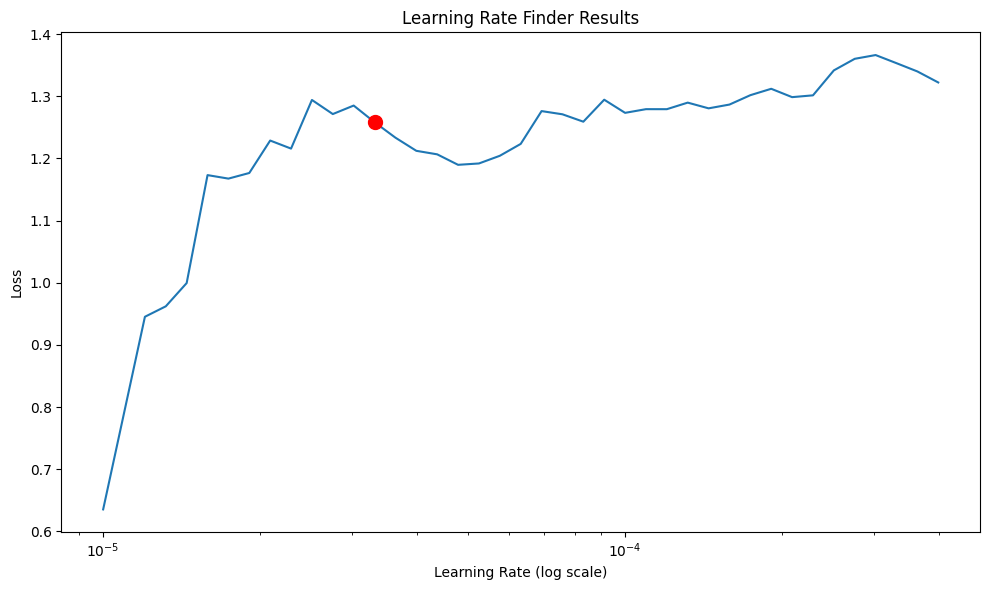

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 642.27it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0c44269d-6b17-4a38-af77-d2655df25dbe.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0c44269d-6b17-4a38-af77-d2655df25dbe.ckpt


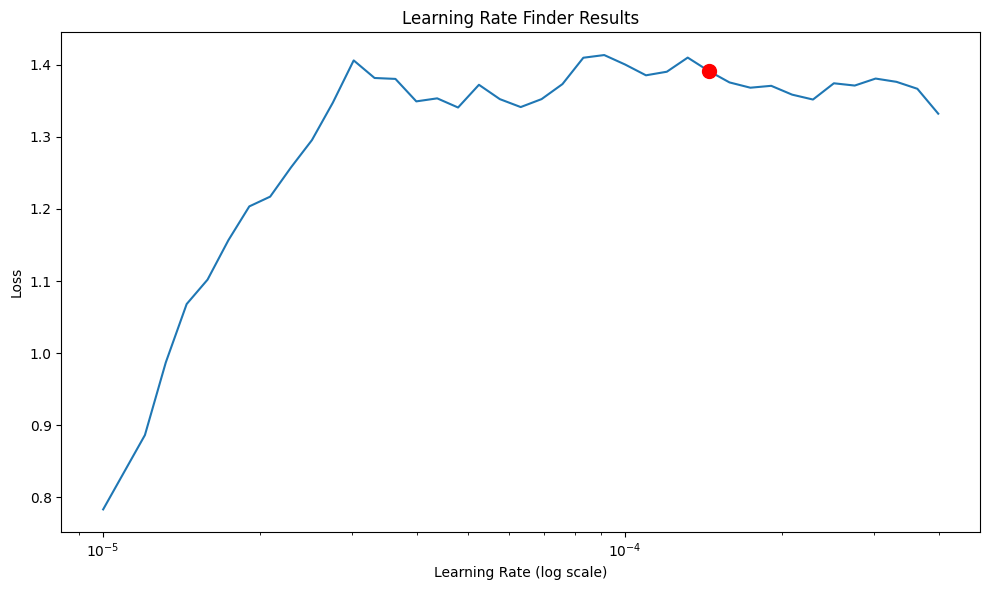

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 417.14it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_bc42aeb0-dd21-49dd-85ad-53a6d8224a9b.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_bc42aeb0-dd21-49dd-85ad-53a6d8224a9b.ckpt


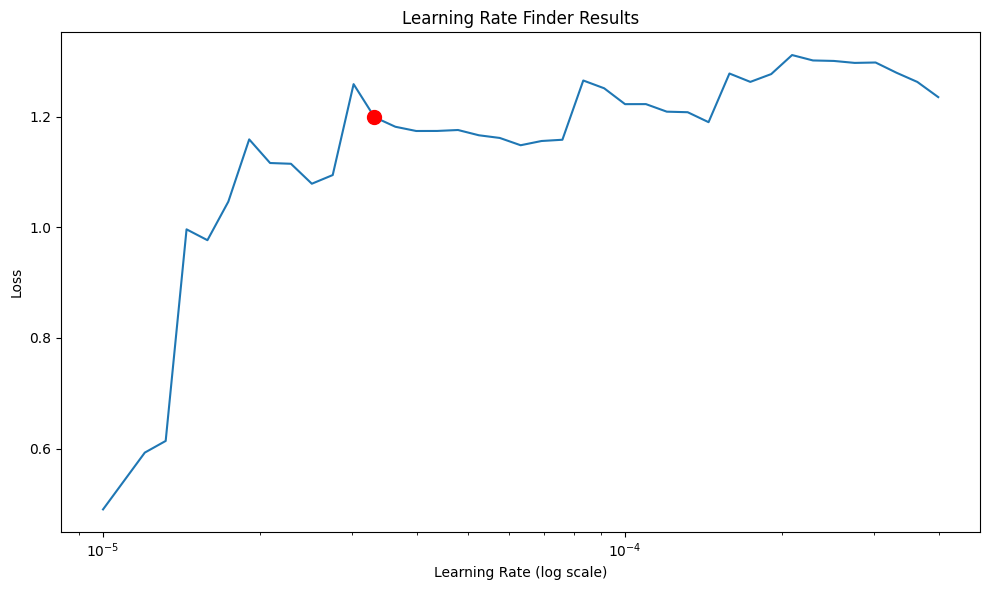

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003311


In [47]:
 
variables_to_evaluate = ['log_GDP', 'household_debt', 'private_debt'] 
from var import var
# takes a while to run
robust_check_results, robustness_dict = evaluate_models_with_lags(
    final_detrend, 
    train_dt_var, 
    test_dt_var, 
    variables_to_evaluate, 
    max_lags=max_lags_to_evaluate,
    seed = 16
)




In [48]:
# # Fix for the IRF prediction error
# shock = 3
# lag_rob = 1  # The lag you want to use

# # Make sure to use the inputs from the same lag specification
# inputs = model_dict_1[lag_rob]['inputs']  # Get inputs for lag_rob
# df_zeros = pd.DataFrame(np.zeros((1, len(inputs))), columns=inputs)

# # Use the model dictionary from the same lag specification
# dictionary_rob_test = model_dict_1[lag_rob]['model_dict']  # Use model from lag_rob

# # Now run the IRF prediction
# plot1_irf_results = irf.predict(df_zeros, inputs, 'household_debt_lag1', household_debt_shocks[shock], 'log_GDP', 20, dictionary_rob_test, lag_rob)
# plot1_title = f'%Δ GDP Impulse Response Function (Shock: {shock} Std Deviation)'
# plot1_var = '%Δ GDP'
# irf.plot(plot1_irf_results, 'log_hhd', plot1_title, plot1_var)
# sum(plot1_irf_results)

# # For the second IRF (GDP shock to household debt)
# plot2_irf_results = irf.predict(df_zeros, inputs, 'log_GDP_lag1', log_gdp_shocks[shock], 'household_debt', 20, dictionary_rob_test, lag_rob)
# plot2_title = f'Household Debt Response to GDP Shock (Shock: {shock} Std Deviation)'
# plot2_var = 'Δ Household Debt'
# irf.plot(plot2_irf_results, 'GDP', plot2_title, plot2_var)
# sum(plot2_irf_results)


Evaluating models with 1 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 1: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef1_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 1...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 1:
  learning_rate: 0.003172303274577476
  hidden_size: 128
  num_layers: 3
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 64

Best hyperparameters for household_debt with lag 1:
  learning_rate: 1.62424322558958e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.5
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for private_debt with lag 1:
  learning_rate: 0.00013986354064069218
  hidden_size: 64
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 128
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 580.31it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8a09322b-96d4-45f7-bfe2-cb48f1783dd9.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8a09322b-96d4-45f7-bfe2-cb48f1783dd9.ckpt


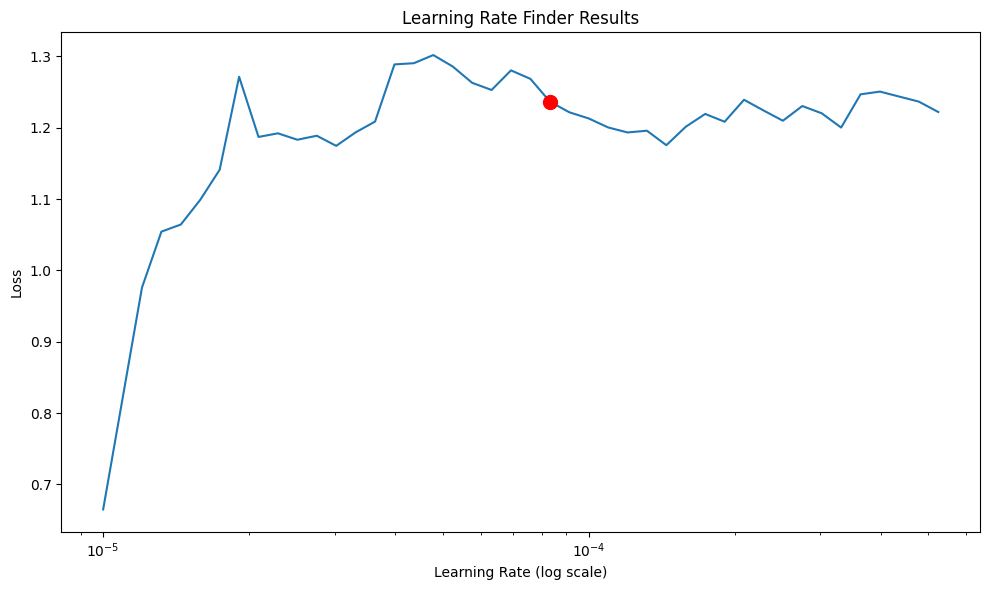

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00008318


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 621.17it/s]
Learning rate set to 5.75439937337157e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5adb0942-11db-4fd3-bed4-b470bda5bd59.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5adb0942-11db-4fd3-bed4-b470bda5bd59.ckpt


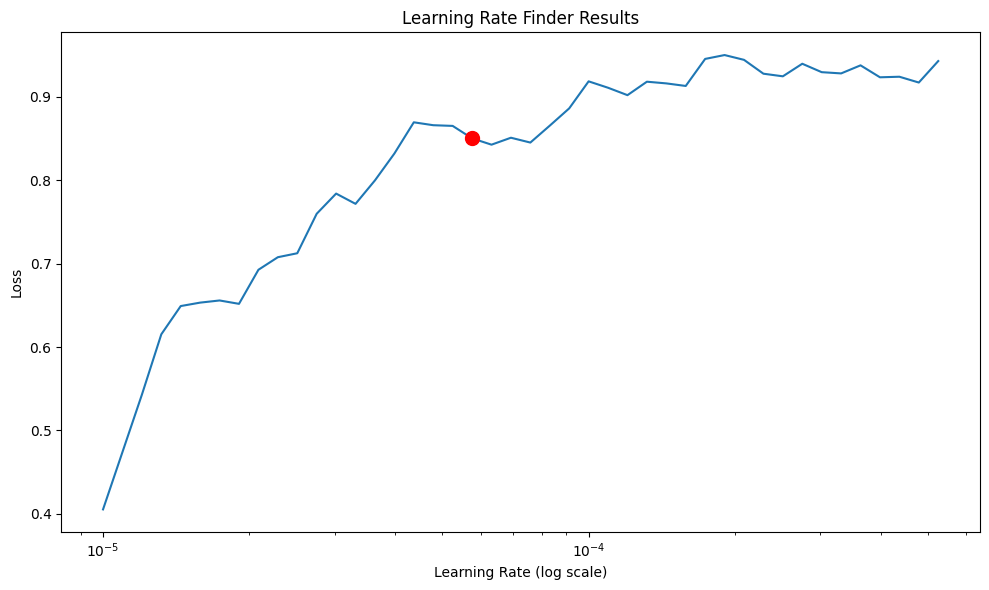

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00005754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 613.79it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4c352e6c-a577-42ec-9e84-22eba7e67a15.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4c352e6c-a577-42ec-9e84-22eba7e67a15.ckpt


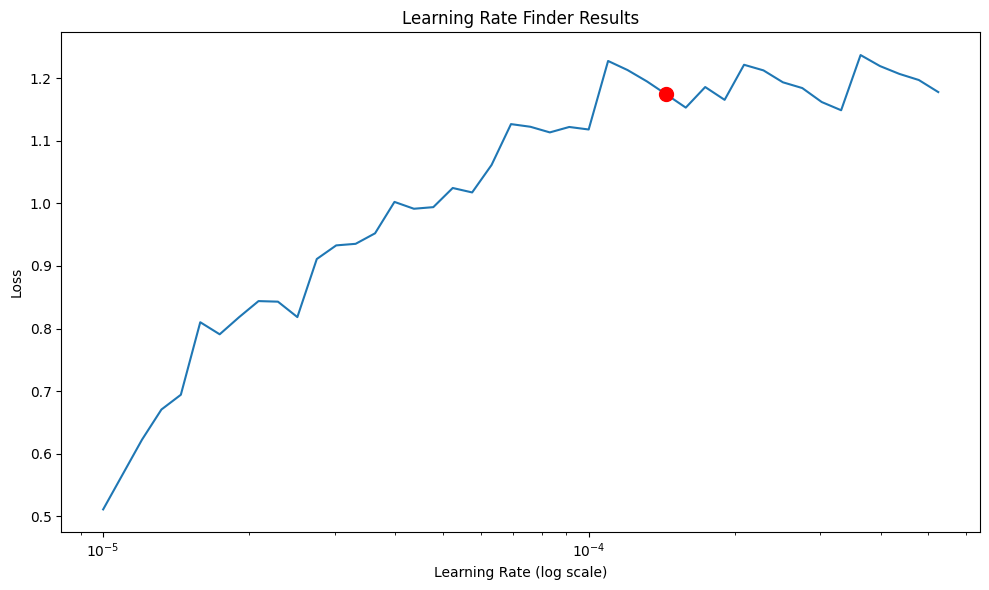

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454

Evaluating models with 2 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 2: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef2_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 2...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 2:
  learning_rate: 5.995987994669184e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 16

Best hyperparameters for household_debt with lag 2:
  learning_rate: 5.7652941253562285e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for private_debt with lag 2:
  learning_rate: 1.0032677499018372e-05
  hidden_size: 64
  num_layers: 2
  dropout: 0.4
  weight_decay: 1e-05
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 553.88it/s]
Learning rate set to 0.00020892961308540398
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_aff76a24-4013-4d6c-b58e-f2e524380392.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_aff76a24-4013-4d6c-b58e-f2e524380392.ckpt


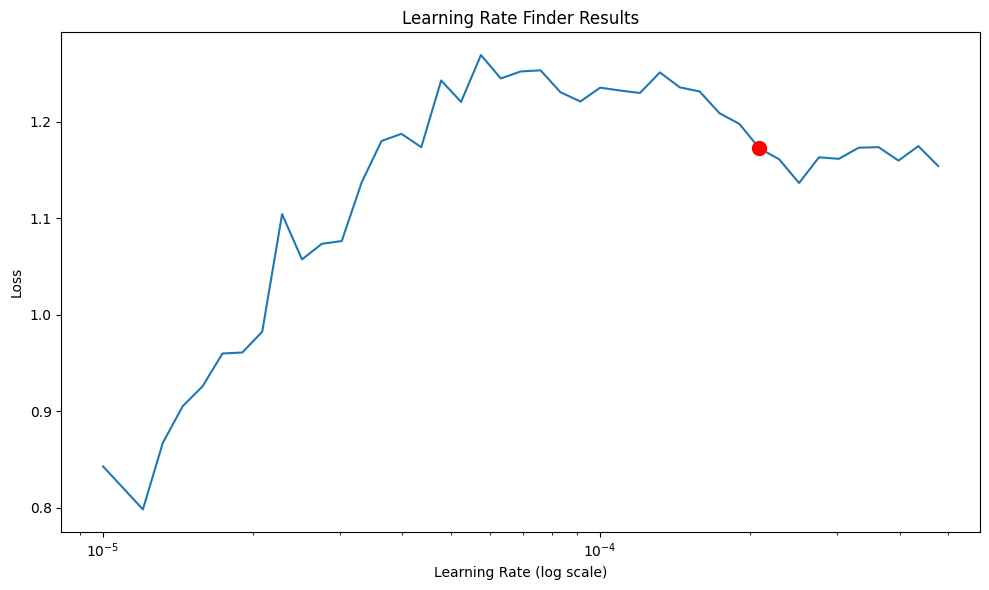

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00020893


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 582.56it/s]
Learning rate set to 0.00022908676527677737
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ce08fc36-7a7d-4b52-82d5-731830d7987e.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ce08fc36-7a7d-4b52-82d5-731830d7987e.ckpt


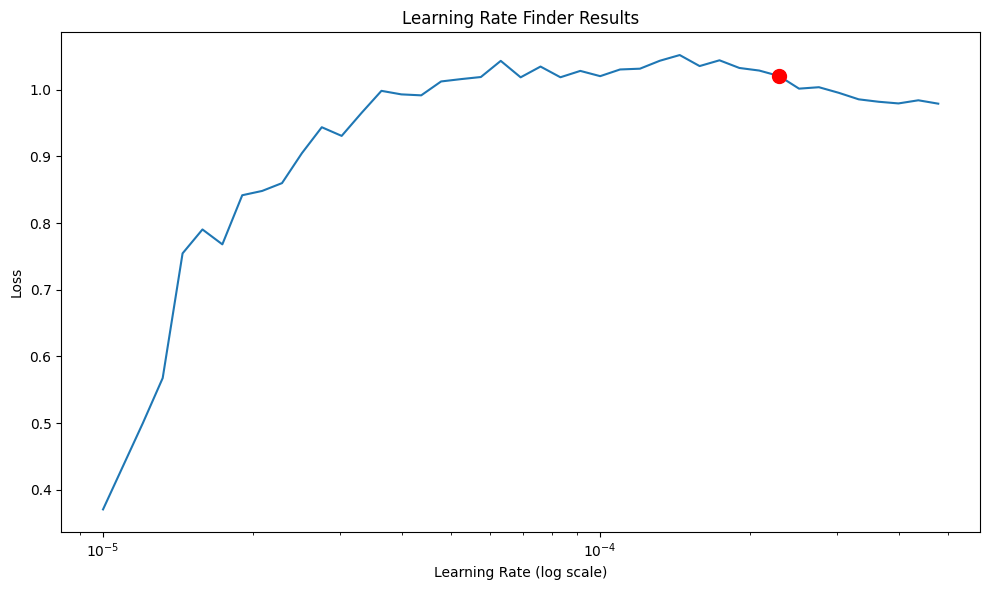

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00022909


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (42) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 599.66it/s]
Learning rate set to 9.120108393559098e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5896f8b0-9cca-405b-a99b-1ca6d75d9255.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5896f8b0-9cca-405b-a99b-1ca6d75d9255.ckpt


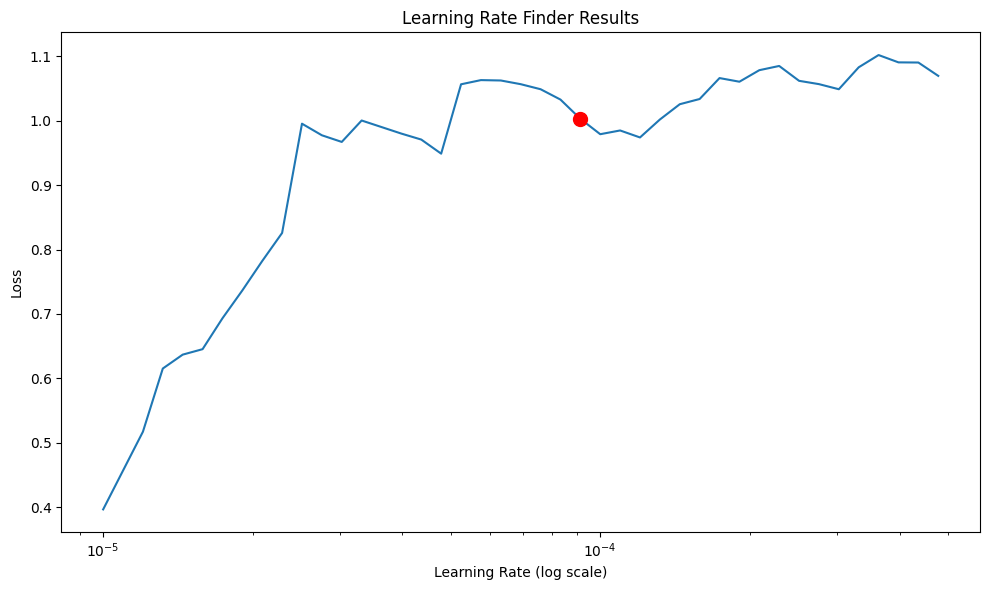

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00009120

Evaluating models with 3 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 3: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef3_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 3...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 3:
  learning_rate: 4.4240544943600556e-05
  hidden_size: 16
  num_layers: 3
  dropout: 0.3
  weight_decay: 1e-05
  batch_size: 128

Best hyperparameters for household_debt with lag 3:
  learning_rate: 0.0007663677654048468
  hidden_size: 128
  num_layers: 3
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 32

Best hyperparameters for private_debt with lag 3:
  learning_rate: 0.00012234251027886655
  hidden_size: 32
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.0001
  batch_size: 128
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 435.66it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_eca4f65f-3992-4981-9081-0f381d5346b3.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_eca4f65f-3992-4981-9081-0f381d5346b3.ckpt


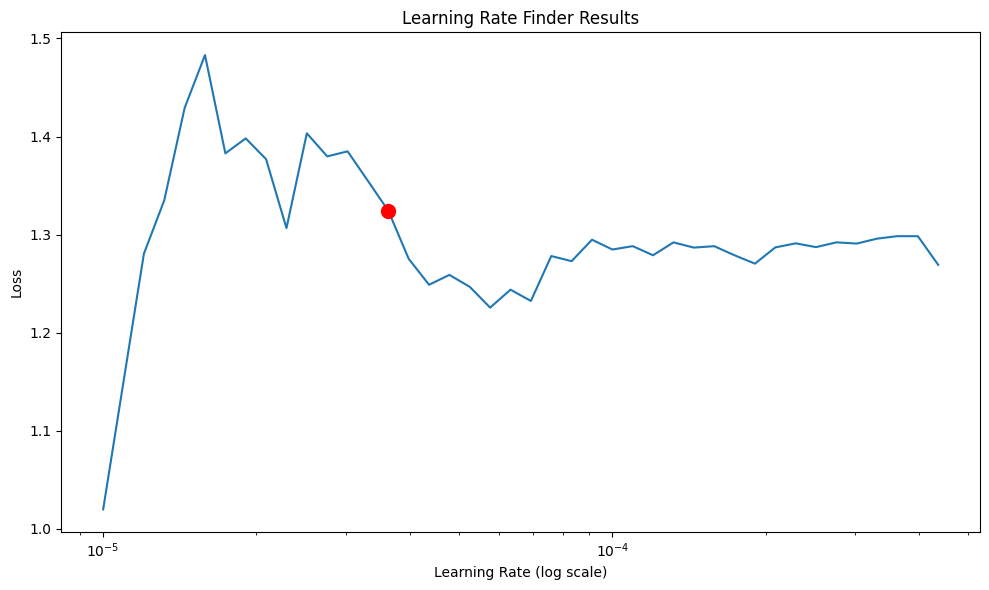

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003631


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 614.60it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_59af79ab-918c-4c27-834b-5f4a14a017f1.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_59af79ab-918c-4c27-834b-5f4a14a017f1.ckpt


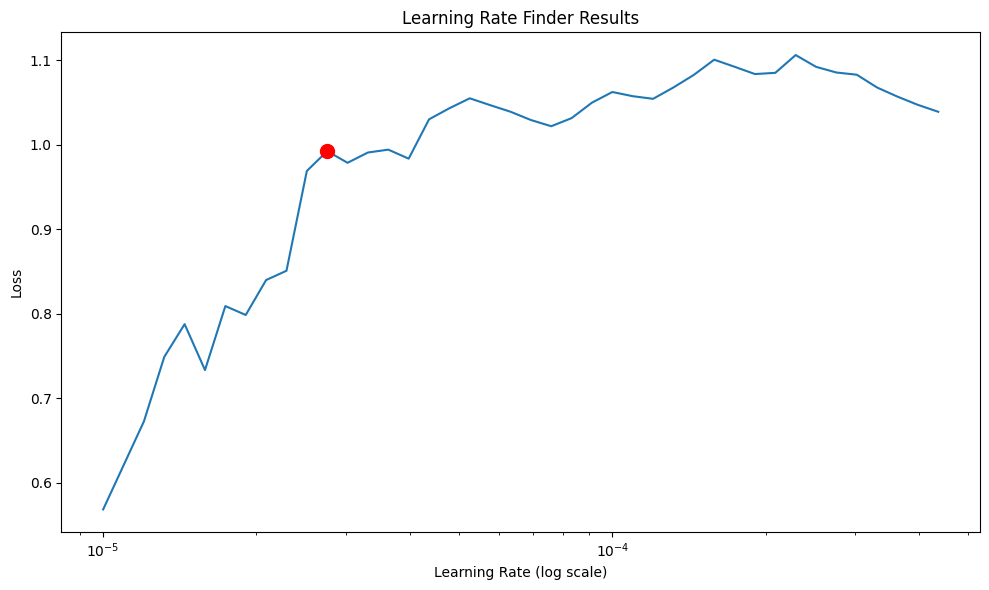

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 488.39it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_157e4971-bf14-4fbd-a673-4e0fff8db2e8.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_157e4971-bf14-4fbd-a673-4e0fff8db2e8.ckpt


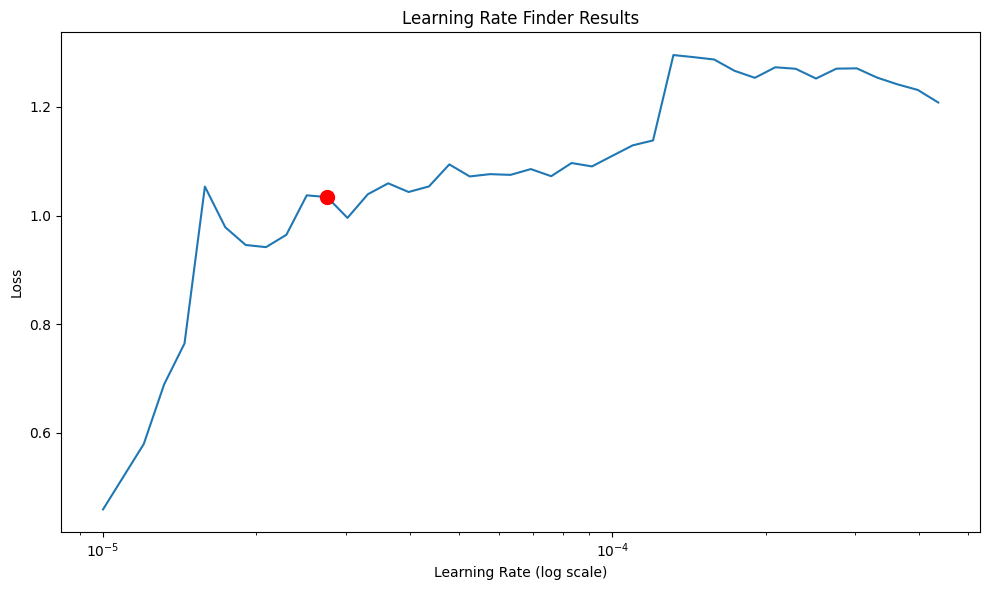

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 4 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 4: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef4_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 4...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 4:
  learning_rate: 1.0322214992633199e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.5
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for household_debt with lag 4:
  learning_rate: 0.0012852384123428855
  hidden_size: 32
  num_layers: 3
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 16

Best hyperparameters for private_debt with lag 4:
  learning_rate: 0.0006104213357978138
  hidden_size: 16
  num_layers: 3
  dropout: 0.5
  weight_decay: 1e-05
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 612.08it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0c6f4d80-fc5c-41d3-94c4-51801edc26f5.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0c6f4d80-fc5c-41d3-94c4-51801edc26f5.ckpt


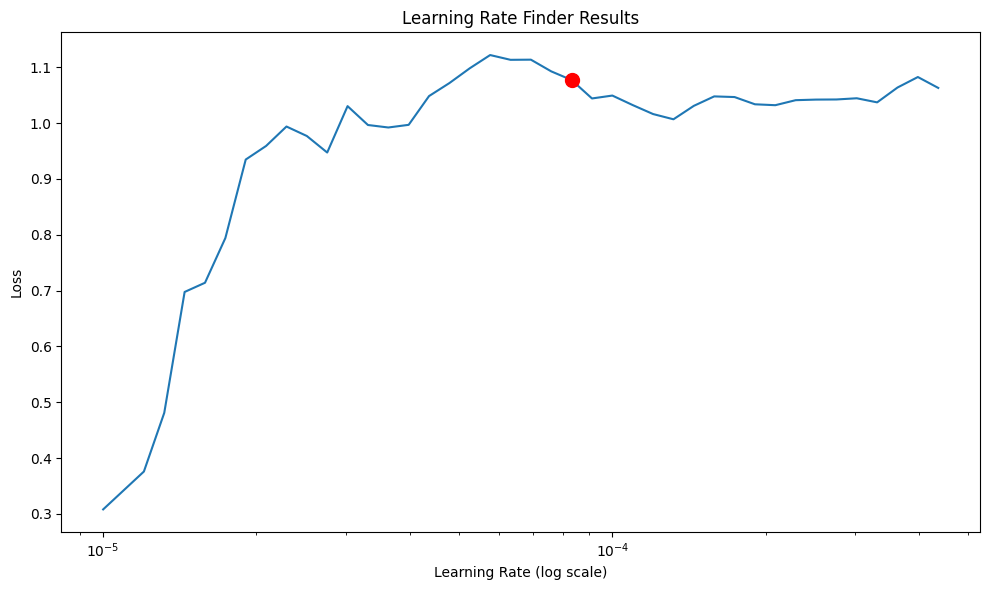

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 609.65it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_04e401c4-3ef5-413c-9f71-0dff947da9ca.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_04e401c4-3ef5-413c-9f71-0dff947da9ca.ckpt


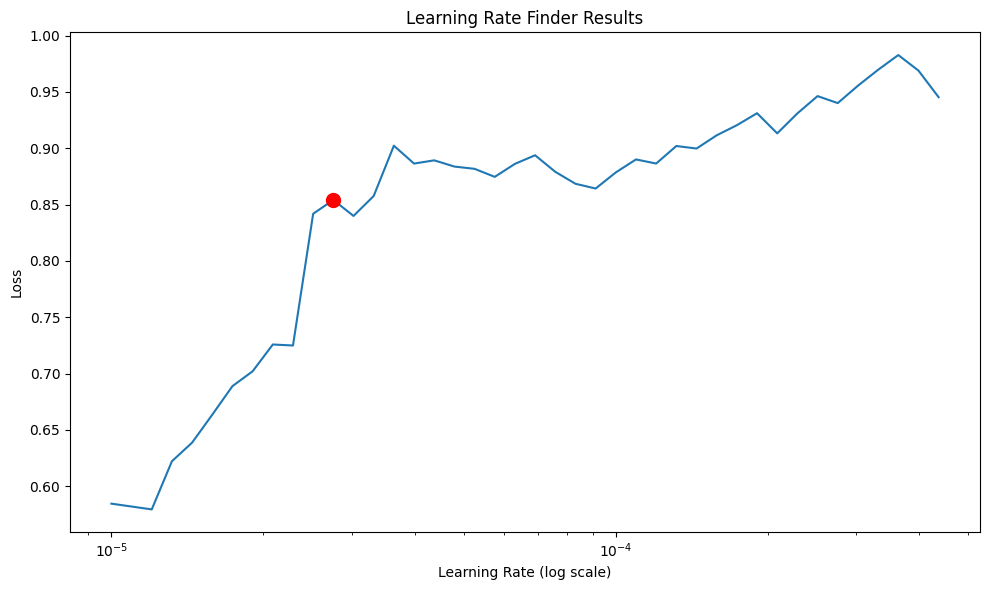

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 569.17it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_908a9000-bdbd-4865-a7de-9f49509722ce.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_908a9000-bdbd-4865-a7de-9f49509722ce.ckpt


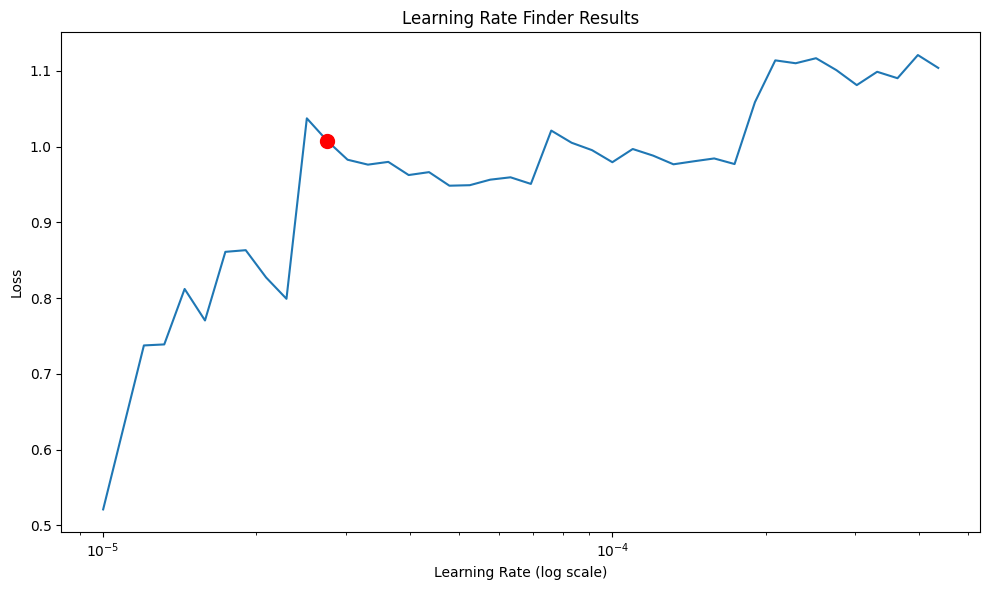

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 5 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 5: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef5_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 5...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 5:
  learning_rate: 0.0001397144927687686
  hidden_size: 64
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for household_debt with lag 5:
  learning_rate: 0.002429412790958581
  hidden_size: 32
  num_layers: 2
  dropout: 0.5
  weight_decay: 1e-05
  batch_size: 128

Best hyperparameters for private_debt with lag 5:
  learning_rate: 3.982040479541477e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.2
  weight_decay: 1e-05
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 471.43it/s]
Learning rate set to 3.981071705534973e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8edda60d-7e5d-4a1f-8226-1bb7b37c3390.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_8edda60d-7e5d-4a1f-8226-1bb7b37c3390.ckpt


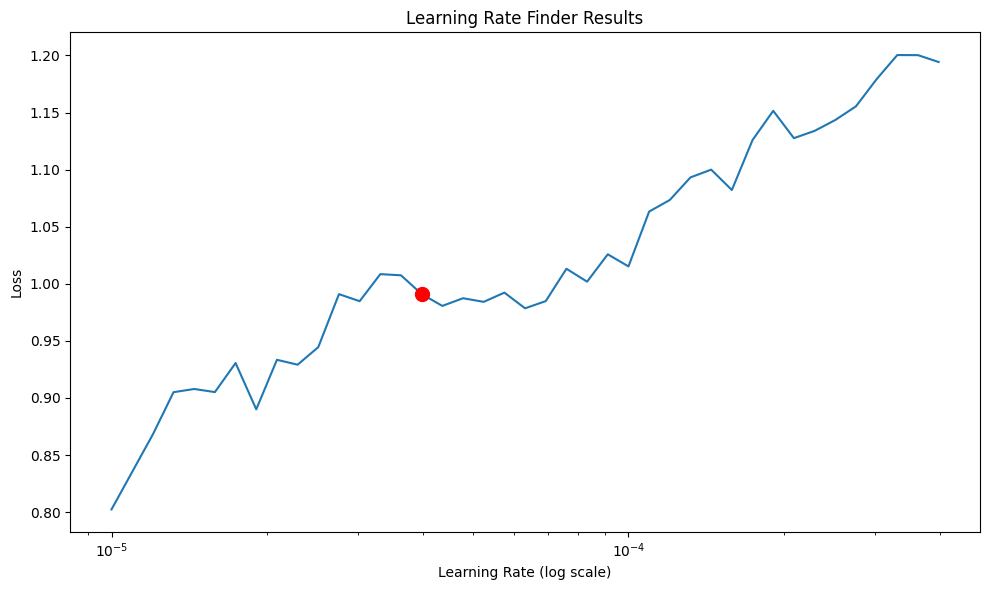

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003981


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 556.15it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2f83a8cf-2200-48fa-8a1c-d7b4d2529682.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2f83a8cf-2200-48fa-8a1c-d7b4d2529682.ckpt


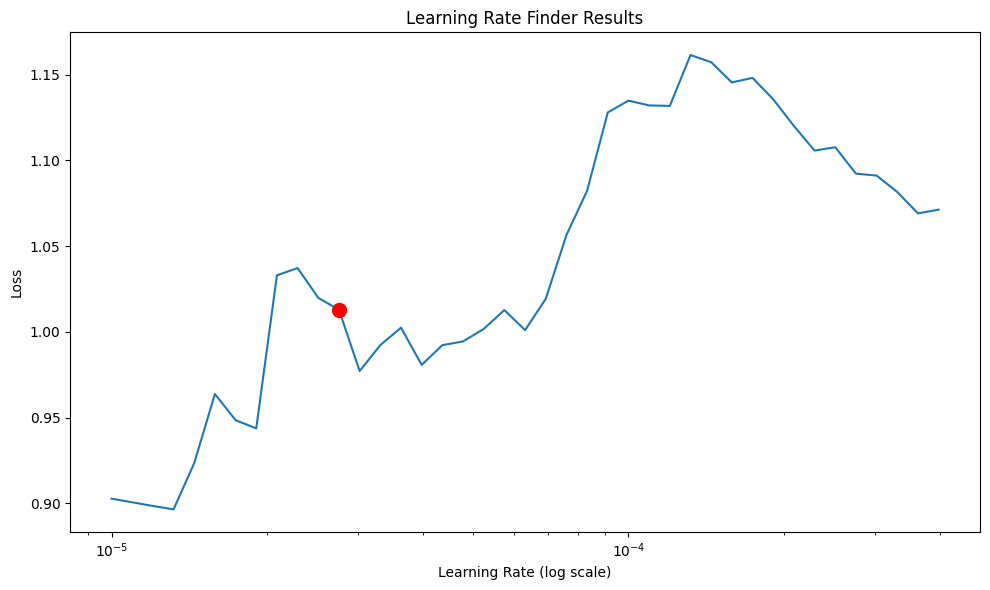

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 583.40it/s]
Learning rate set to 3.0199517204020165e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_96472a53-da87-4a0c-92a5-efb11f39ca6d.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_96472a53-da87-4a0c-92a5-efb11f39ca6d.ckpt


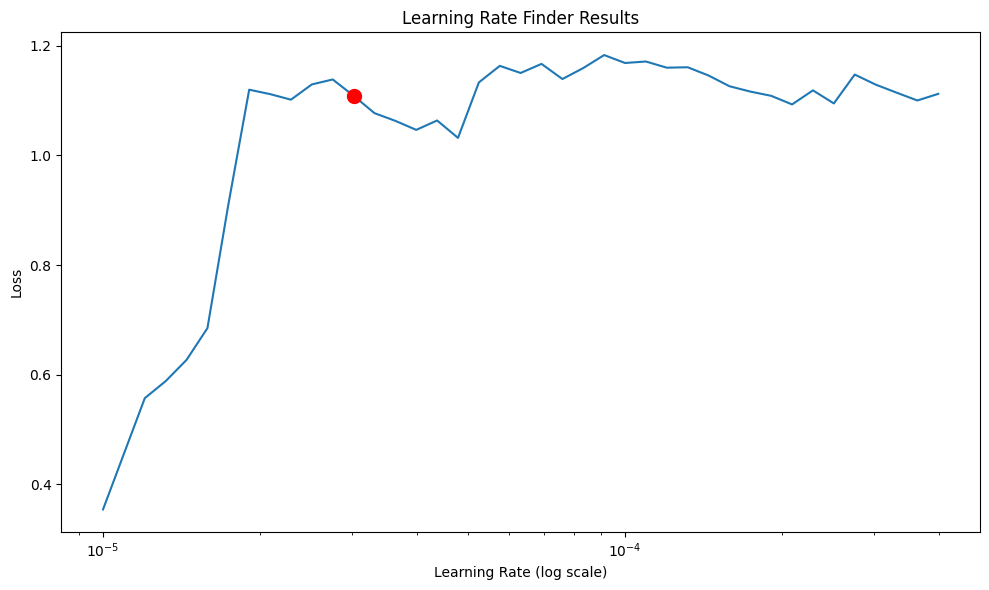

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003020

Evaluating models with 6 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 6: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef6_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 6...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 6:
  learning_rate: 6.589740760242555e-05
  hidden_size: 16
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for household_debt with lag 6:
  learning_rate: 2.1480554050291402e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.5
  weight_decay: 1e-05
  batch_size: 32

Best hyperparameters for private_debt with lag 6:
  learning_rate: 0.00012421871279966326
  hidden_size: 16
  num_layers: 3
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 586.91it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_39a59a2d-b964-463d-afdb-13a8a28b8734.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_39a59a2d-b964-463d-afdb-13a8a28b8734.ckpt


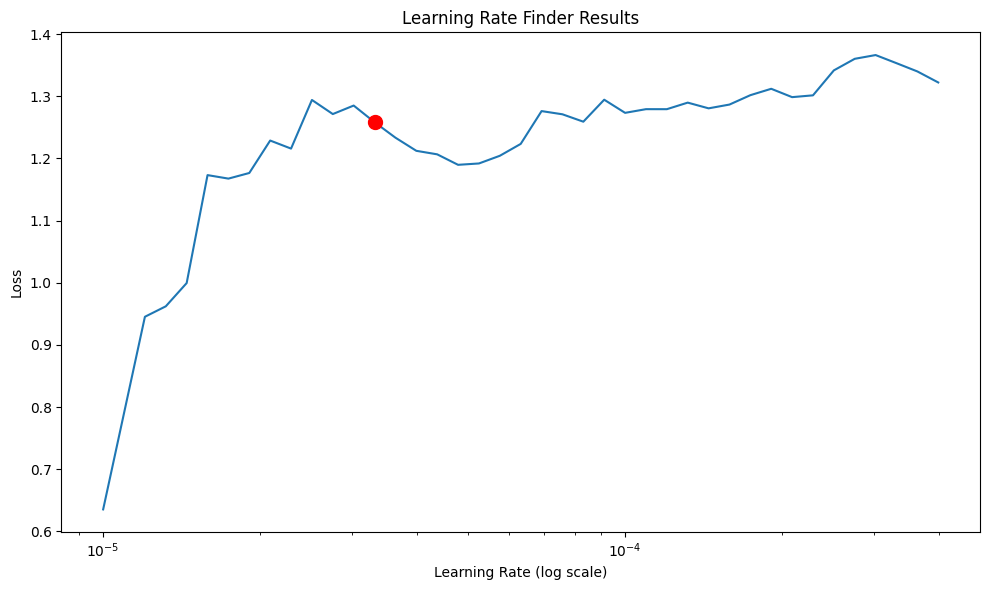

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 611.18it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_129aaf8f-1013-4fa5-b265-efdff43f766b.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_129aaf8f-1013-4fa5-b265-efdff43f766b.ckpt


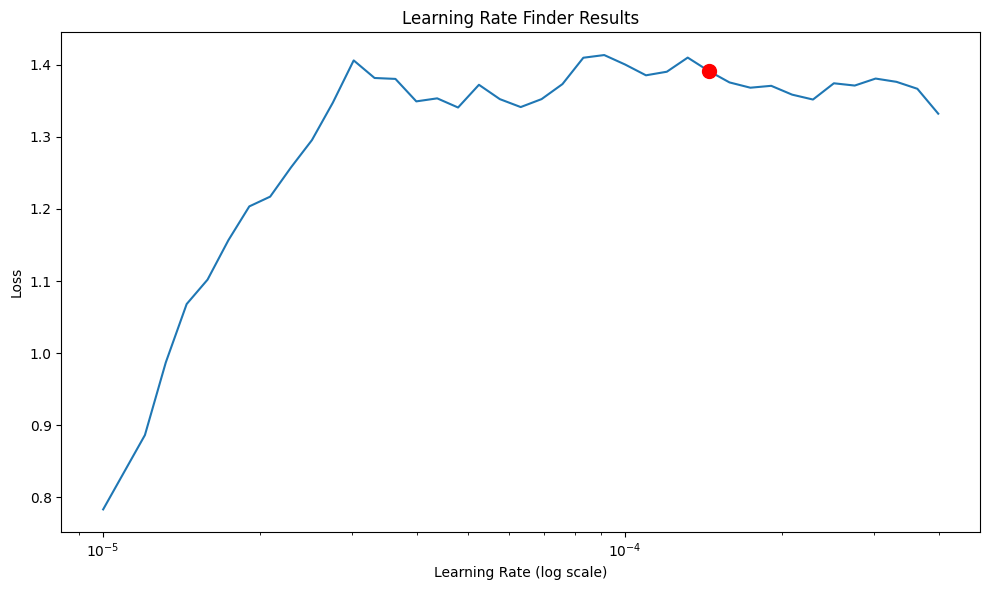

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00014454


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 619.81it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ae09aefb-1aa3-4460-aaa8-7b80256ac2fb.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ae09aefb-1aa3-4460-aaa8-7b80256ac2fb.ckpt


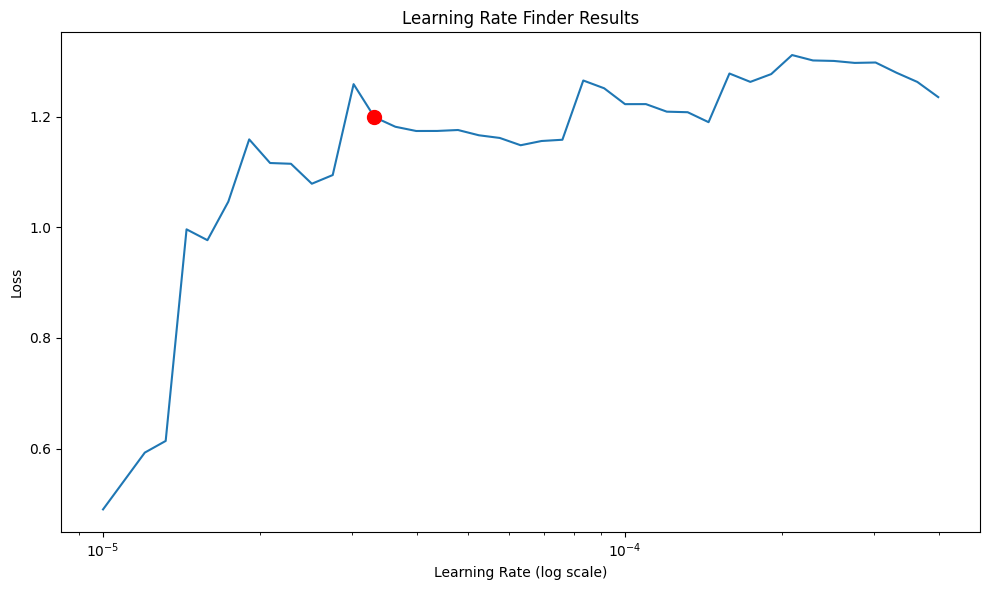

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003311


In [49]:
# max_lags_to_evaluate = 1  
variables_to_evaluate = ['log_GDP', 'household_debt', 'private_debt'] 
from var import var
# takes a while to run
robust_check_results2, robustness_dict2 = evaluate_models_with_lags(
    final_detrend, 
    train_dt_var, 
    test_dt_var, 
    variables_to_evaluate, 
    max_lags=max_lags_to_evaluate,
    seed = 100
)


Evaluating models with 1 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 1: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef1_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 1...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 1:
  learning_rate: 7.440758201839212e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.5
  weight_decay: 0.001
  batch_size: 16

Best hyperparameters for household_debt with lag 1:
  learning_rate: 5.725167884529067e-05
  hidden_size: 64
  num_layers: 2
  dropout: 0.5
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for private_debt with lag 1:
  learning_rate: 6.692053384450509e-05
  hidden_size: 32
  num_layers: 2
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 610.41it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_26de9535-3765-419d-b1fe-b0033c8804c3.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_26de9535-3765-419d-b1fe-b0033c8804c3.ckpt


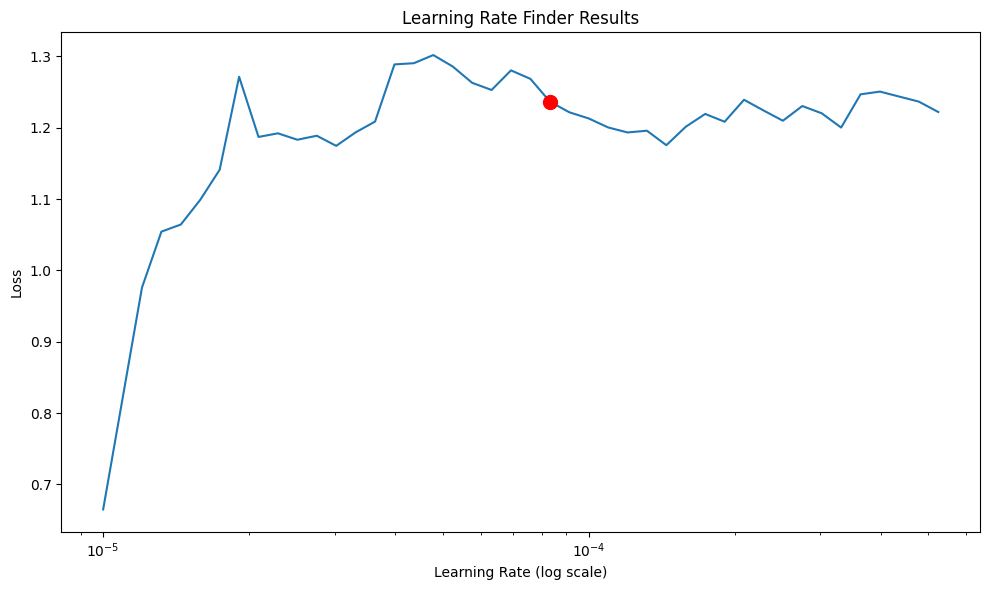

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 625.43it/s]
Learning rate set to 5.75439937337157e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4853e554-2f4f-4777-9a38-211320dcea12.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4853e554-2f4f-4777-9a38-211320dcea12.ckpt


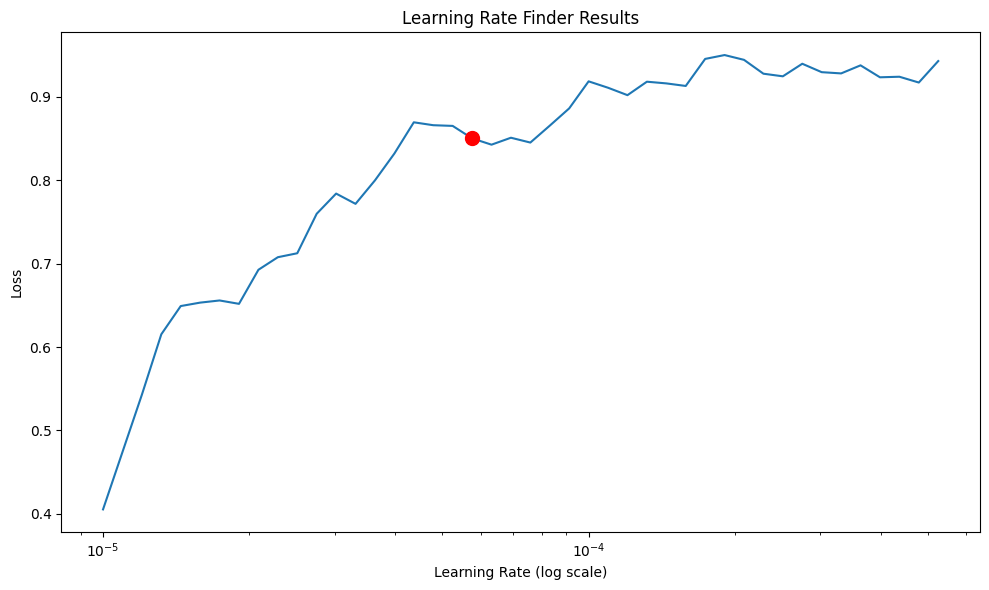

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00005754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 606.83it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5879302f-6ede-4ad9-9b8b-c383c9b449d1.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5879302f-6ede-4ad9-9b8b-c383c9b449d1.ckpt


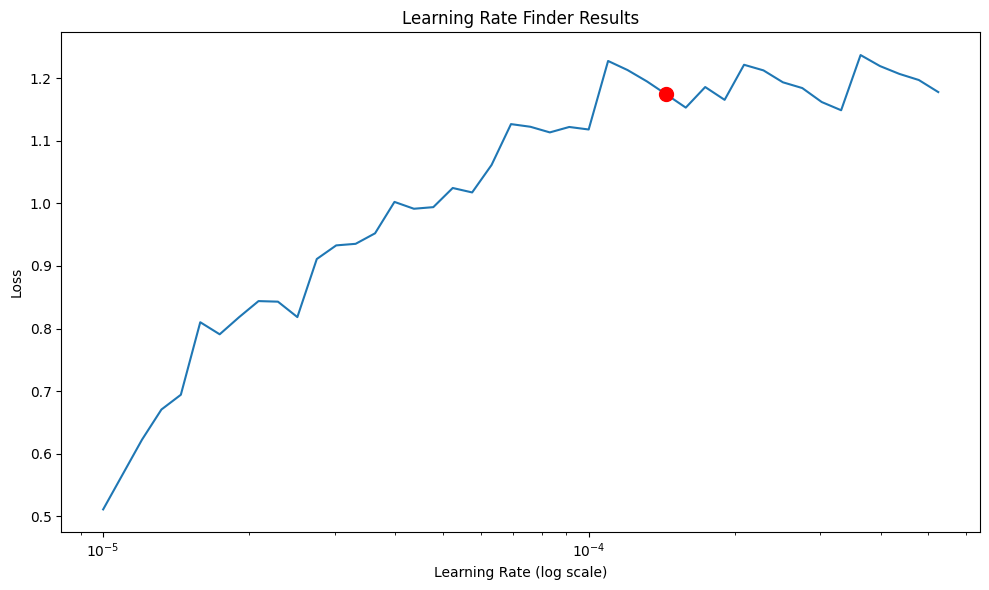

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454

Evaluating models with 2 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 2: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef2_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 2...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 2:
  learning_rate: 1.6316827870112352e-05
  hidden_size: 32
  num_layers: 2
  dropout: 0.5
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for household_debt with lag 2:
  learning_rate: 0.000522855414299136
  hidden_size: 32
  num_layers: 1
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for private_debt with lag 2:
  learning_rate: 0.0003065413683463797
  hidden_size: 128
  num_layers: 1
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 128
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 572.81it/s]
Learning rate set to 0.00020892961308540398
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_059fcbe0-981d-4adb-89cd-ff9699b43e88.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_059fcbe0-981d-4adb-89cd-ff9699b43e88.ckpt


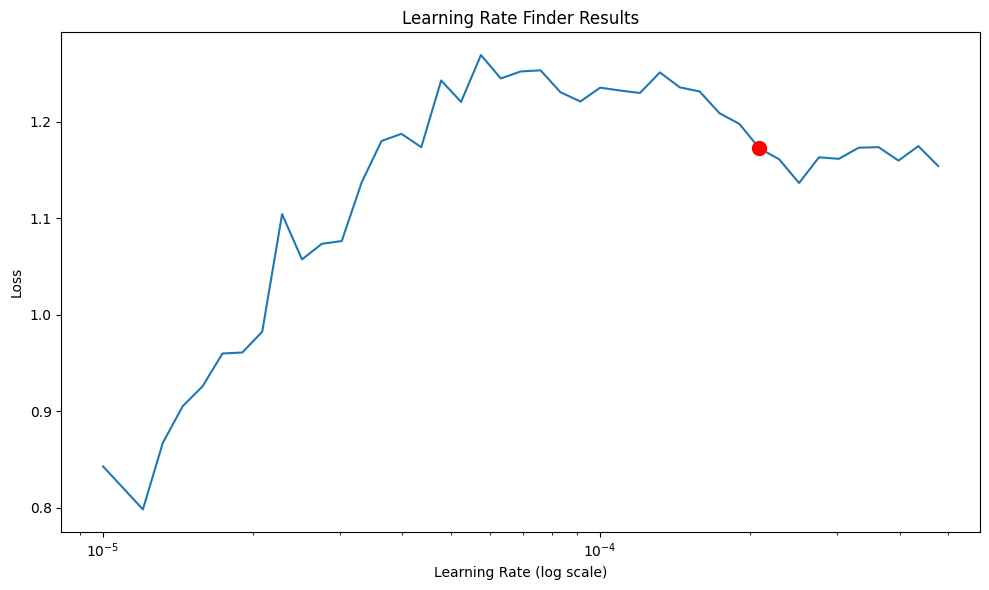

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00020893


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 538.19it/s]
Learning rate set to 0.00022908676527677737
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ae7eae90-3e9f-4fcf-a92b-e24902694505.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_ae7eae90-3e9f-4fcf-a92b-e24902694505.ckpt


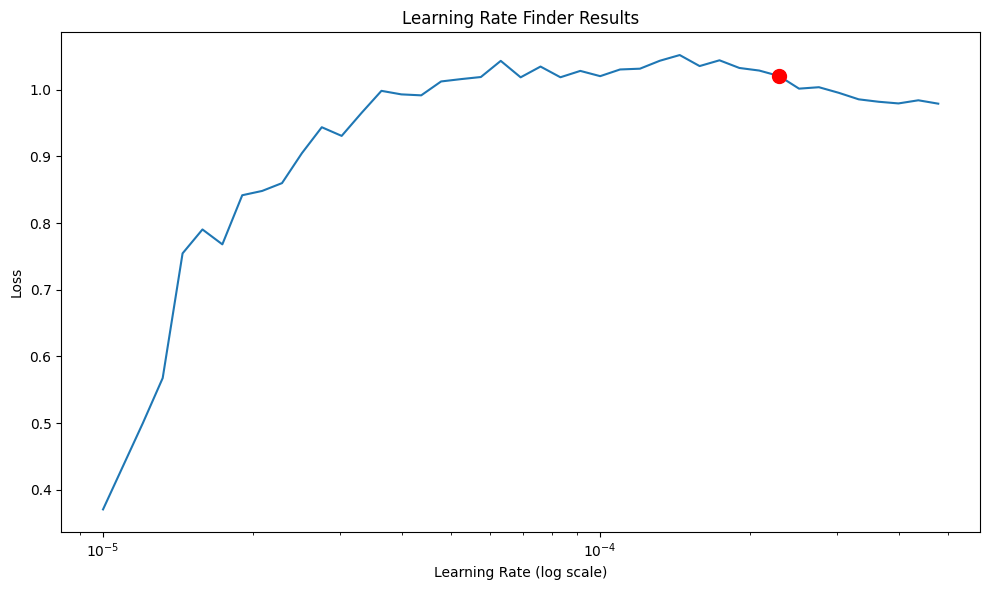

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00022909


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 593.29it/s]
Learning rate set to 9.120108393559098e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4956de6c-1693-42df-9458-70e66ec4f6ab.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_4956de6c-1693-42df-9458-70e66ec4f6ab.ckpt


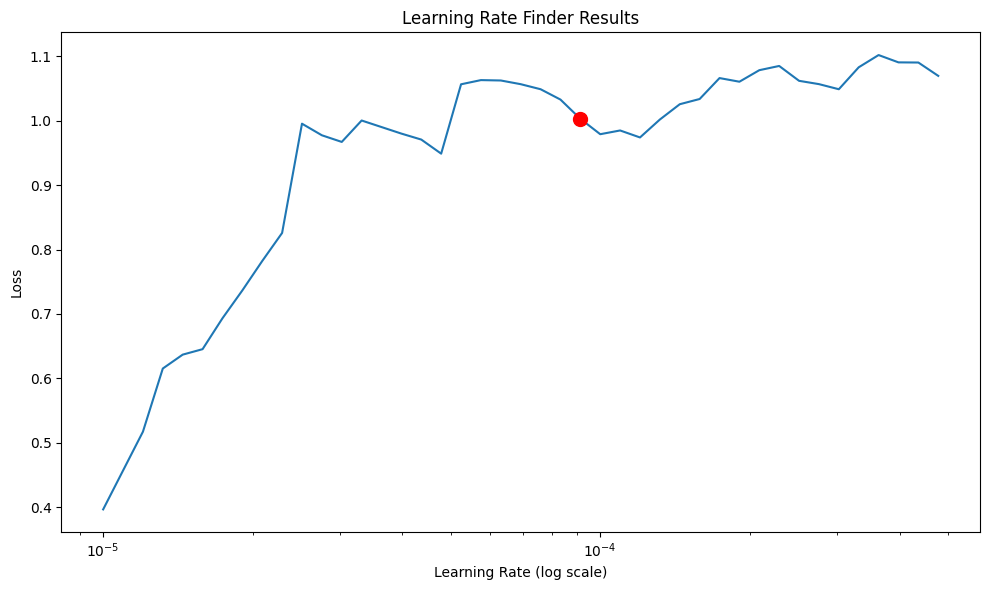

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00009120


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.



Evaluating models with 3 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 3: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef3_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 3...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 3:
  learning_rate: 0.0005187093958651712
  hidden_size: 16
  num_layers: 1
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 128

Best hyperparameters for household_debt with lag 3:
  learning_rate: 0.00032005436301857734
  hidden_size: 128
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 32

Best hyperparameters for private_debt with lag 3:
  learning_rate: 1.0129071159665107e-05
  hidden_size: 64
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 596.48it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2821e84a-73ee-4bb9-a1b4-7ba5bb0dae1f.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2821e84a-73ee-4bb9-a1b4-7ba5bb0dae1f.ckpt


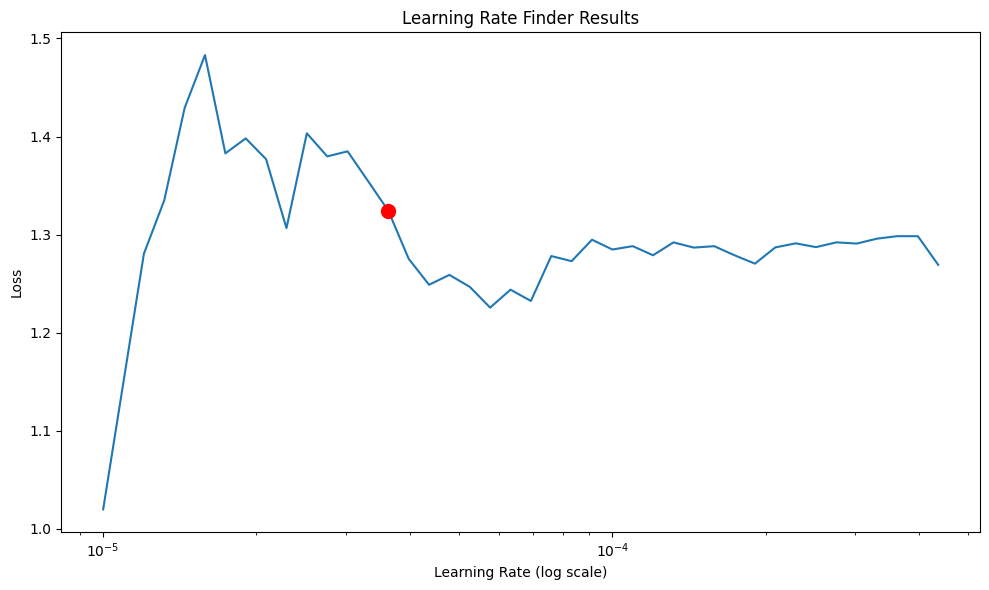

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003631


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 628.99it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7663a881-1ad3-4037-ae66-20a907ad732b.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_7663a881-1ad3-4037-ae66-20a907ad732b.ckpt


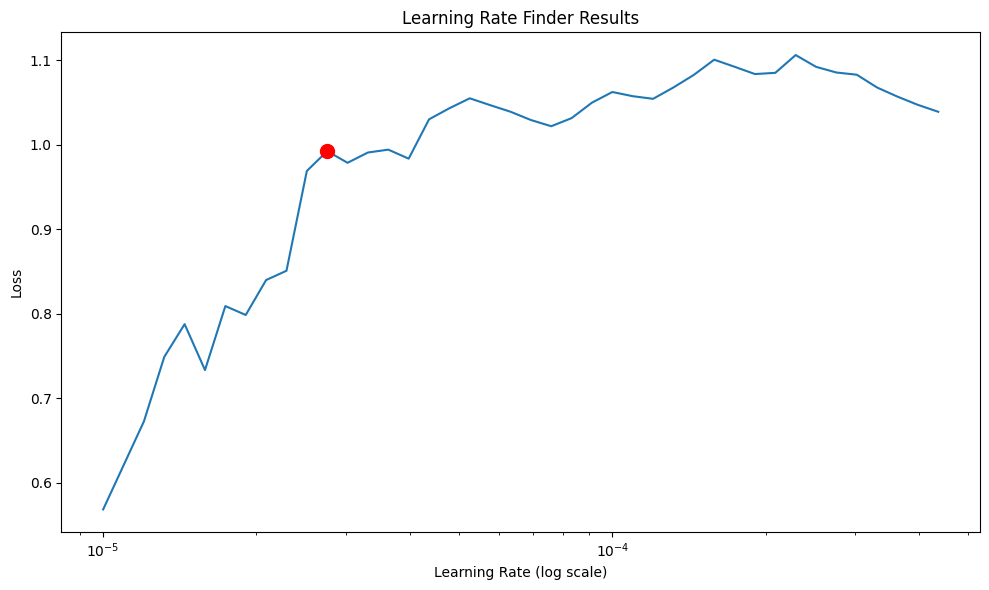

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 559.12it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b435ca1b-630e-4a73-aa98-b378602de595.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b435ca1b-630e-4a73-aa98-b378602de595.ckpt


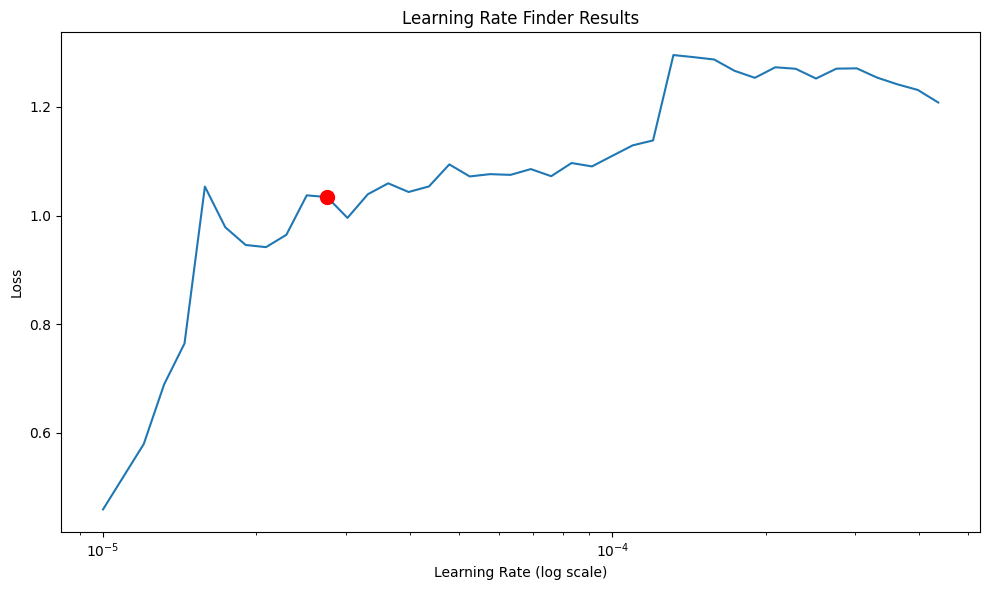

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 4 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 4: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef4_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 4...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 4:
  learning_rate: 0.0004147550895042578
  hidden_size: 64
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.0001
  batch_size: 32

Best hyperparameters for household_debt with lag 4:
  learning_rate: 2.3662353382292685e-05
  hidden_size: 64
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 16

Best hyperparameters for private_debt with lag 4:
  learning_rate: 0.00012610403711874808
  hidden_size: 16
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.01
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 623.60it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_1fd5c6bd-a082-404e-a8f1-a2e4e188e186.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_1fd5c6bd-a082-404e-a8f1-a2e4e188e186.ckpt


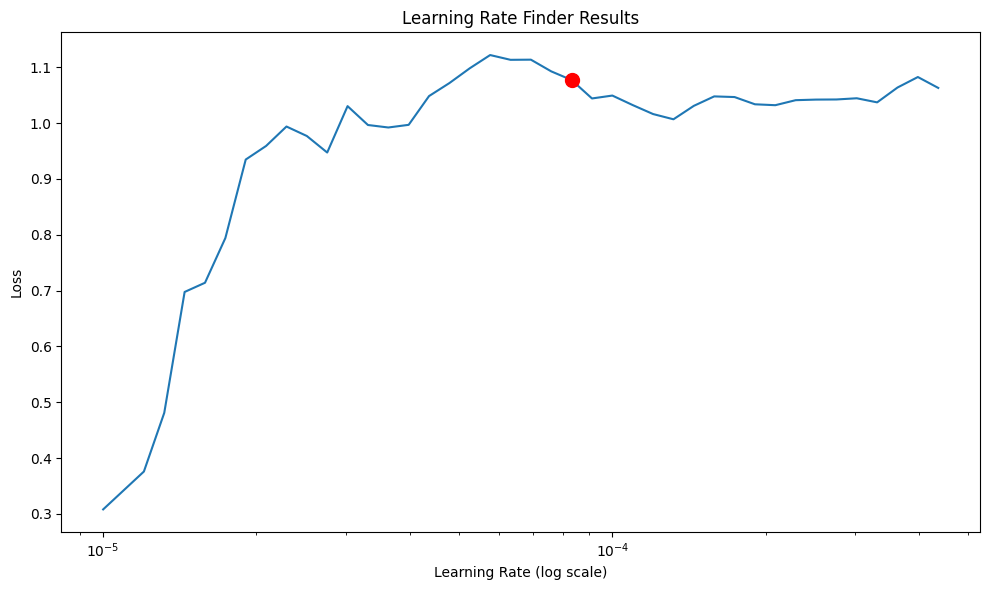

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 490.11it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3a6614e5-8e0e-47fb-8b03-d2dceaae86ad.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3a6614e5-8e0e-47fb-8b03-d2dceaae86ad.ckpt


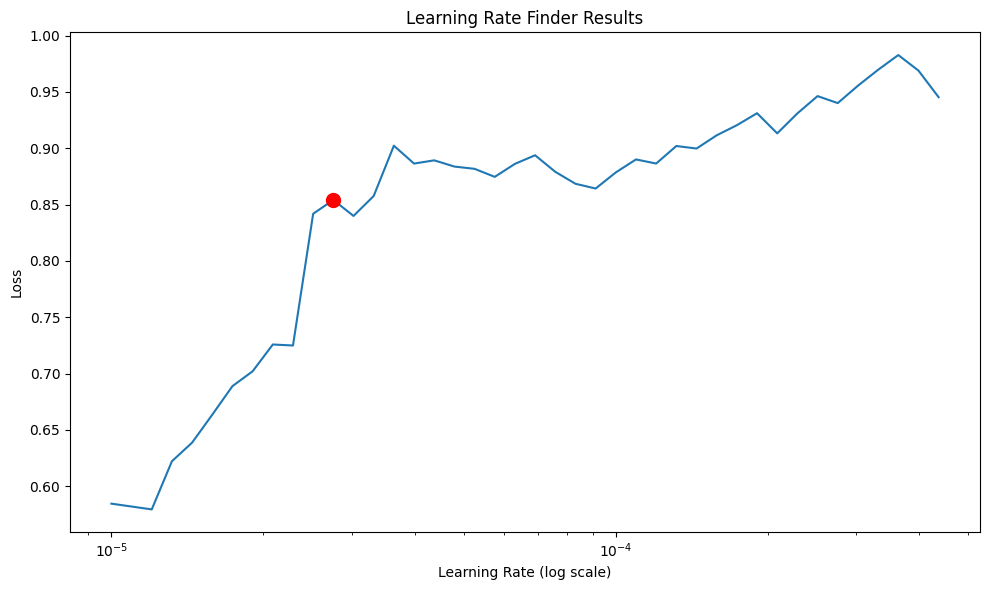

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 613.49it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e73a8ff2-046a-4d2b-8d23-be93ebab64ff.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e73a8ff2-046a-4d2b-8d23-be93ebab64ff.ckpt


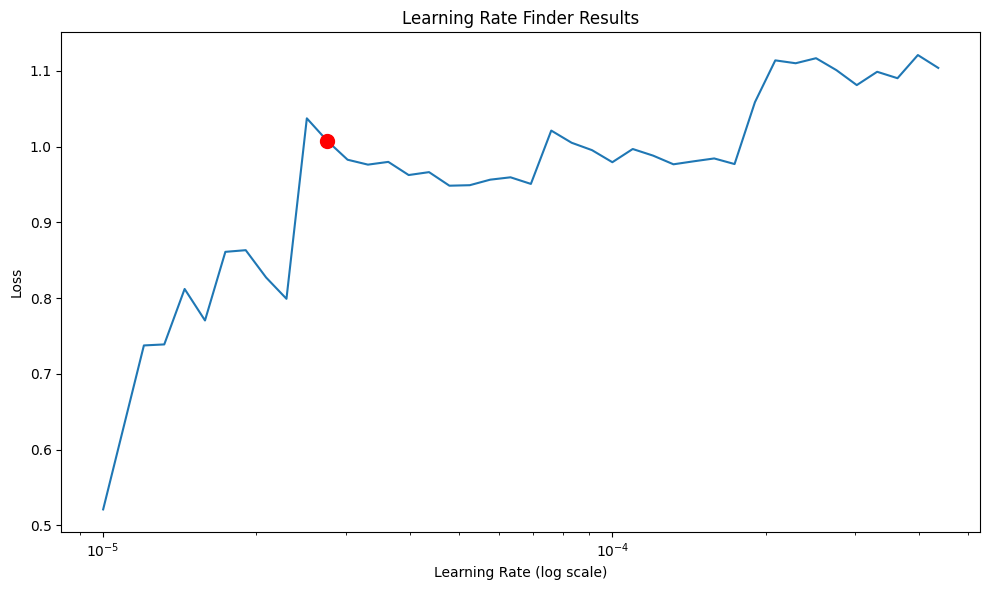

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 5 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 5: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef5_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 5...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 5:
  learning_rate: 0.008811384771178408
  hidden_size: 16
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for household_debt with lag 5:
  learning_rate: 1.1564270958060359e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.2
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for private_debt with lag 5:
  learning_rate: 0.0006431926586112001
  hidden_size: 16
  num_layers: 2
  dropout: 0.2
  weight_decay: 0.01
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  31%|███       | 31/100 [00:00<00:00, 309.52it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 271.23it/s]
Learning rate set to 3.981071705534973e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5d975f60-6801-47a4-906c-f30a642a1243.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5d975f60-6801-47a4-906c-f30a642a1243.ckpt


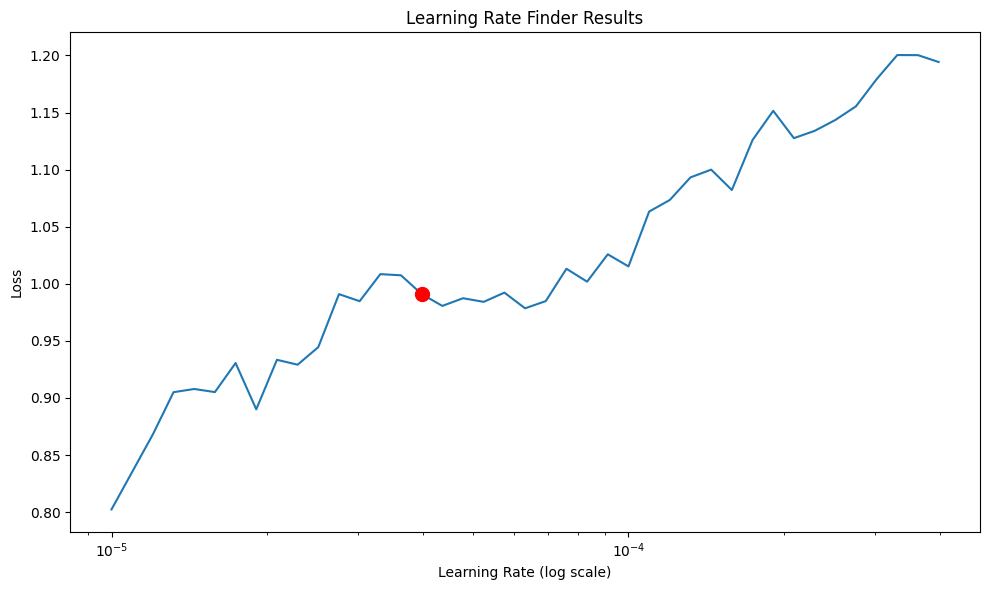

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Suggested learning rate: 0.00003981


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  35%|███▌      | 35/100 [00:00<00:00, 347.08it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 351.10it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_411810ad-ff01-4cef-9cd1-841652746848.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_411810ad-ff01-4cef-9cd1-841652746848.ckpt


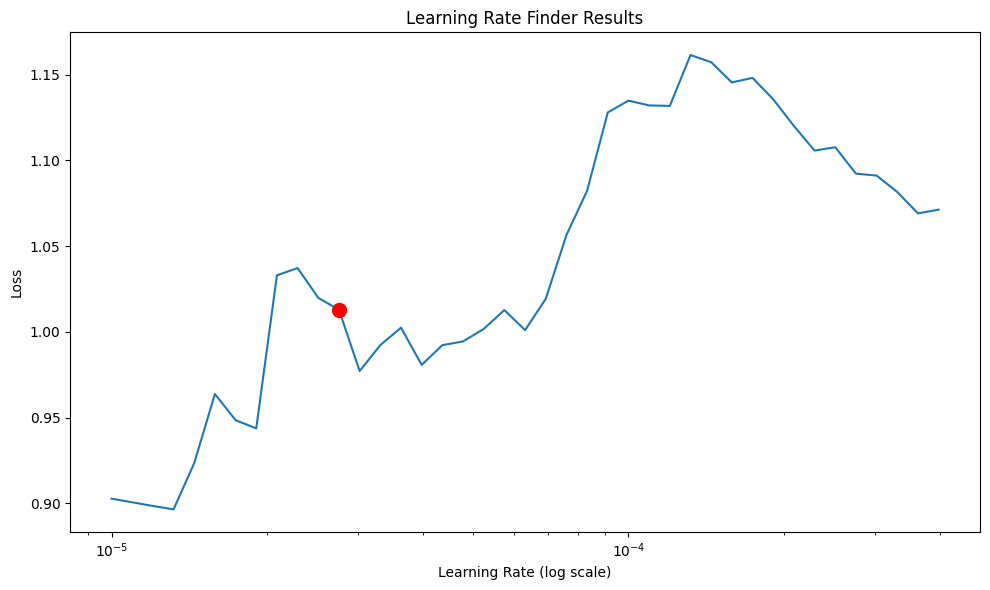

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 567.60it/s]
Learning rate set to 3.0199517204020165e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0f4ffa16-4cb0-4a21-ac36-c272ce1afa2f.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0f4ffa16-4cb0-4a21-ac36-c272ce1afa2f.ckpt


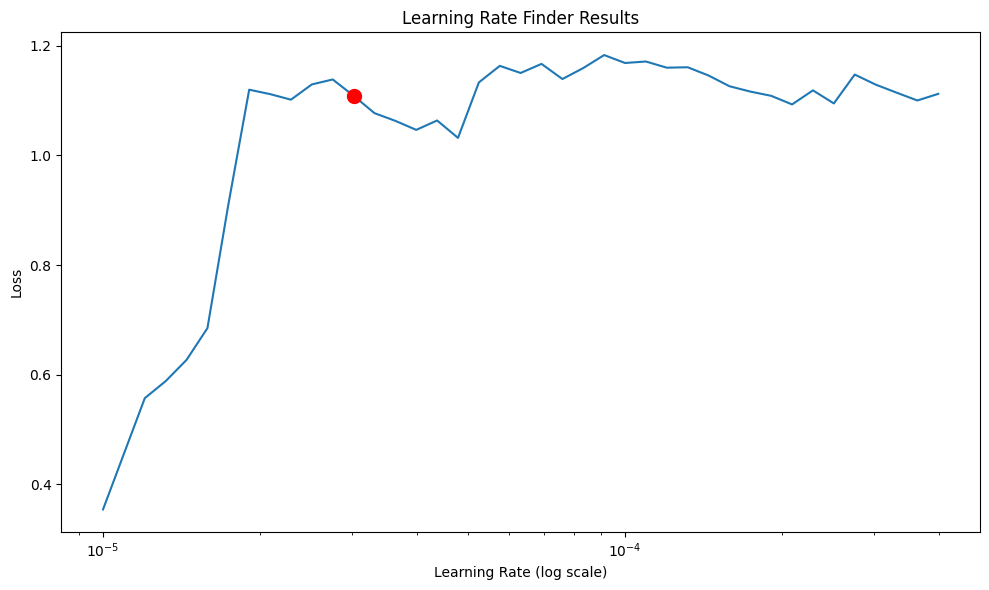

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003020

Evaluating models with 6 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 6: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef6_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 6...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 6:
  learning_rate: 0.000937990388742866
  hidden_size: 64
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for household_debt with lag 6:
  learning_rate: 1.6940447095242732e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 32

Best hyperparameters for private_debt with lag 6:
  learning_rate: 1.6940447095242732e-05
  hidden_size: 128
  num_layers: 1
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 526.02it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_49708f61-457f-4c3d-a52f-ba67dfd86914.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_49708f61-457f-4c3d-a52f-ba67dfd86914.ckpt


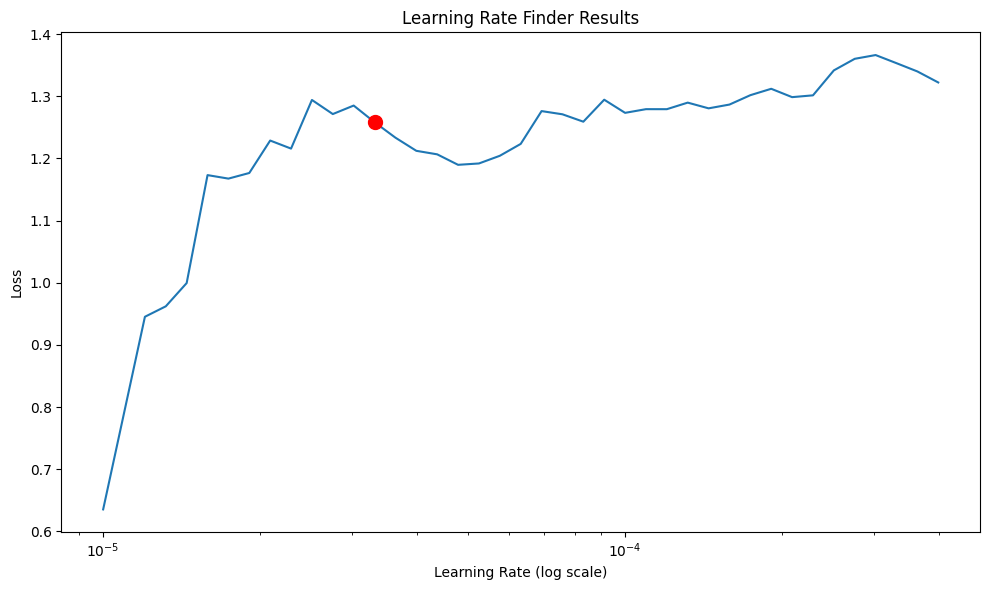

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 613.13it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5688cee7-815a-42f9-9f6b-29ccfcc47f64.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_5688cee7-815a-42f9-9f6b-29ccfcc47f64.ckpt


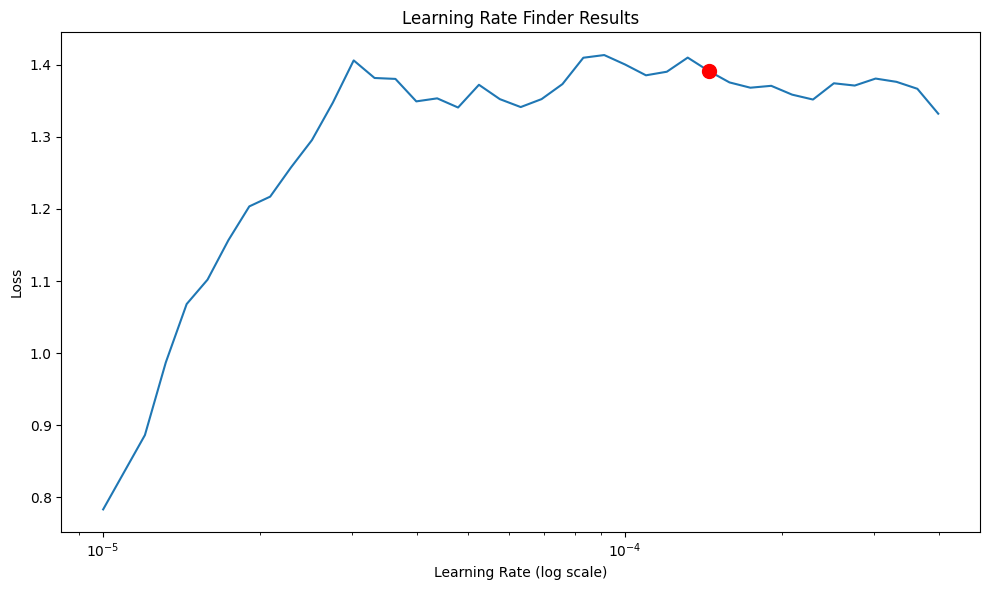

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00014454


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 623.72it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2c5a3cd0-9e6d-41c7-b458-7641762cead7.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_2c5a3cd0-9e6d-41c7-b458-7641762cead7.ckpt


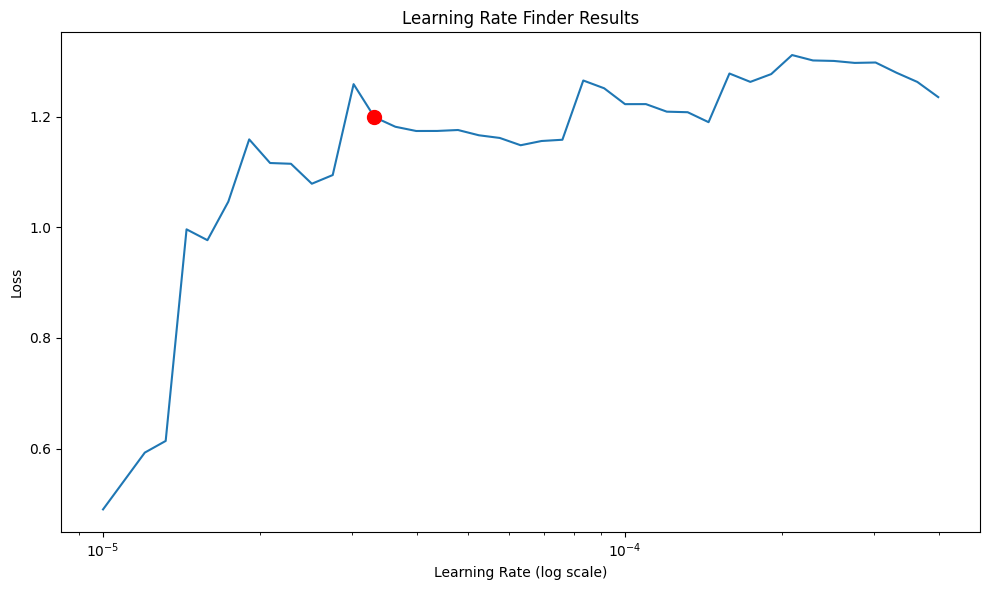

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


In [50]:
# max_lags_to_evaluate = 1  
variables_to_evaluate = ['log_GDP', 'household_debt', 'private_debt'] 
from var import var
# takes a while to run
robust_check_results3, robustness_dict3 = evaluate_models_with_lags(
    final_detrend, 
    train_dt_var, 
    test_dt_var, 
    variables_to_evaluate, 
    max_lags=max_lags_to_evaluate,
    seed = 1
)



Evaluating models with 1 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 1: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef1_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 1...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 1:
  learning_rate: 0.008619624447577313
  hidden_size: 128
  num_layers: 2
  dropout: 0.1
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for household_debt with lag 1:
  learning_rate: 1.040917150033408e-05
  hidden_size: 32
  num_layers: 2
  dropout: 0.4
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for private_debt with lag 1:
  learning_rate: 1.543612904853632e-05
  hidden_size: 32
  num_layers: 3
  dropout: 0.5
  weight_decay: 0.001
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 651.22it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e632cf24-97e7-4fd4-a021-9833e85eb387.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_e632cf24-97e7-4fd4-a021-9833e85eb387.ckpt


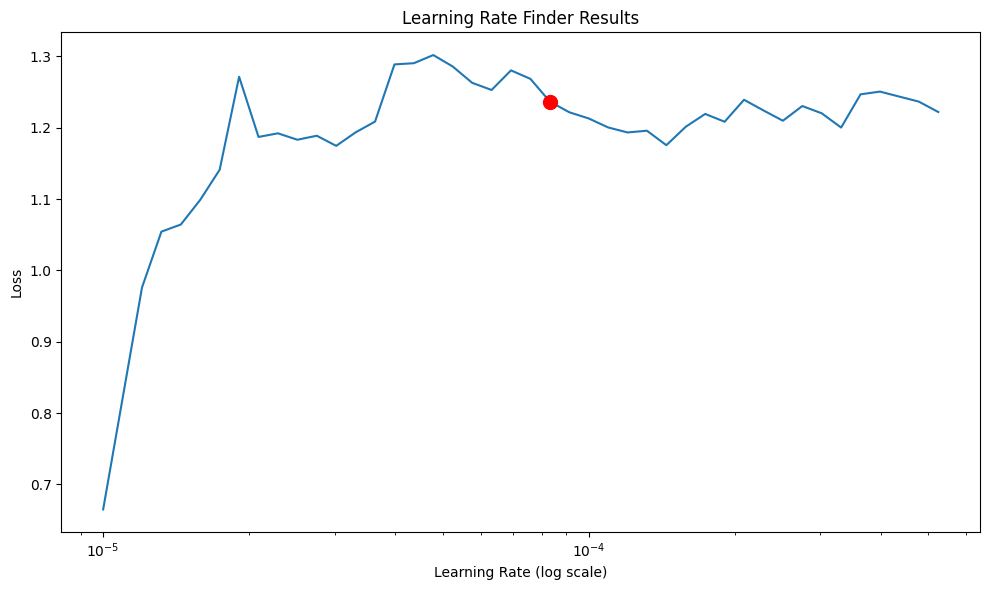

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 648.32it/s]
Learning rate set to 5.75439937337157e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f12e49cb-3207-4a81-9b02-09d8fbc32ae9.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f12e49cb-3207-4a81-9b02-09d8fbc32ae9.ckpt


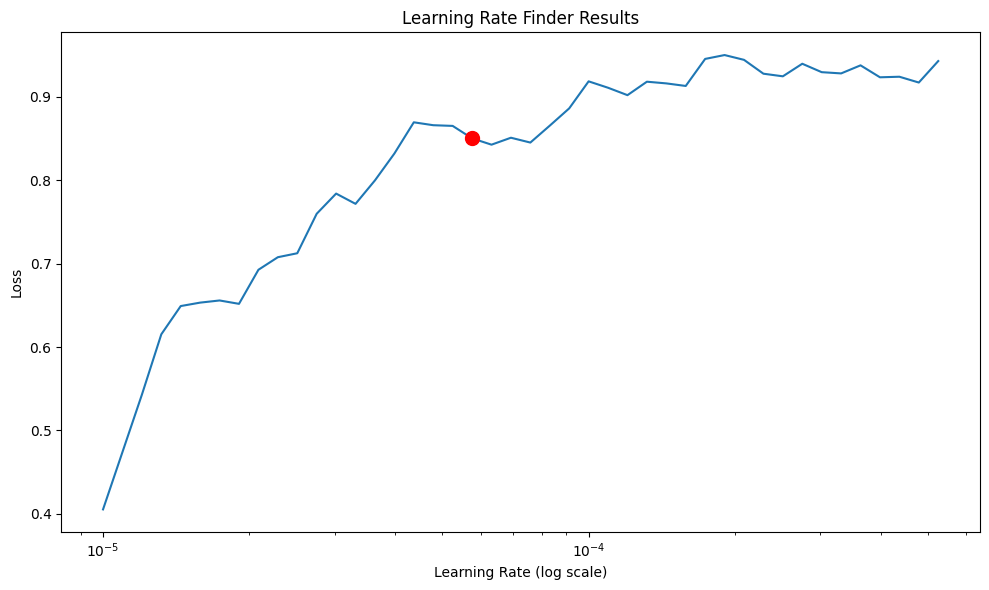

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00005754


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (43) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   9%|▉         | 9/100 [00:00<00:01, 89.39it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 43 steps due to diverging loss.
Finding best initial lr:  43%|████▎     | 43/100 [00:00<00:00, 254.57it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_869fb047-7083-46cd-9a58-7d0282c457e3.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_869fb047-7083-46cd-9a58-7d0282c457e3.ckpt


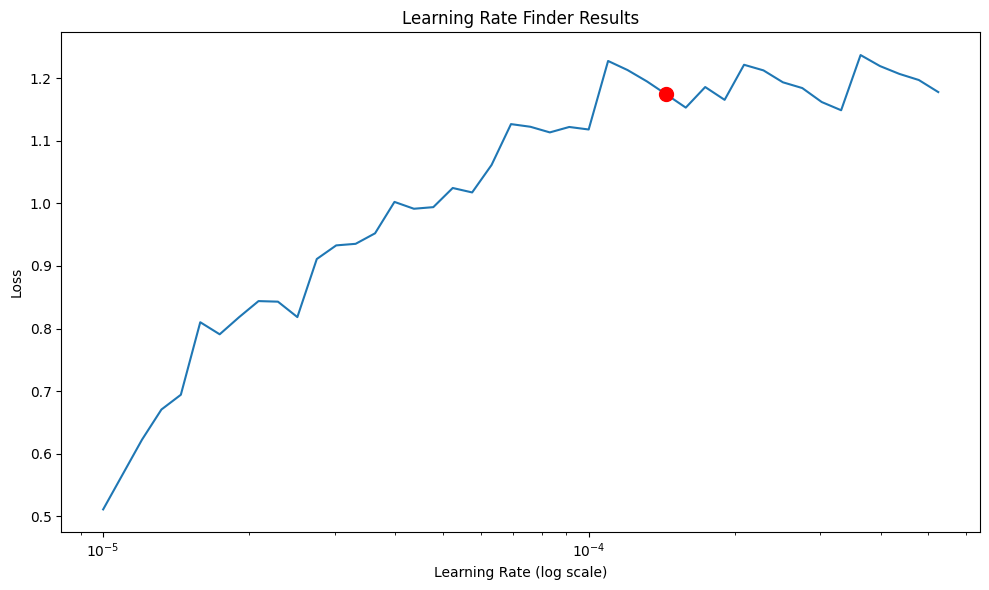

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00014454


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.



Evaluating models with 2 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 2: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef2_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 2...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 2:
  learning_rate: 1.451208053171308e-05
  hidden_size: 32
  num_layers: 3
  dropout: 0.2
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for household_debt with lag 2:
  learning_rate: 0.0036907689691455907
  hidden_size: 128
  num_layers: 3
  dropout: 0.5
  weight_decay: 0.0001
  batch_size: 16

Best hyperparameters for private_debt with lag 2:
  learning_rate: 0.0002473348608179178
  hidden_size: 32
  num_layers: 2
  dropout: 0.5
  weight_decay: 0.0001
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 579.92it/s]
Learning rate set to 0.00020892961308540398
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_251edfe1-6a02-4994-9176-5a7fdf565b1e.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_251edfe1-6a02-4994-9176-5a7fdf565b1e.ckpt


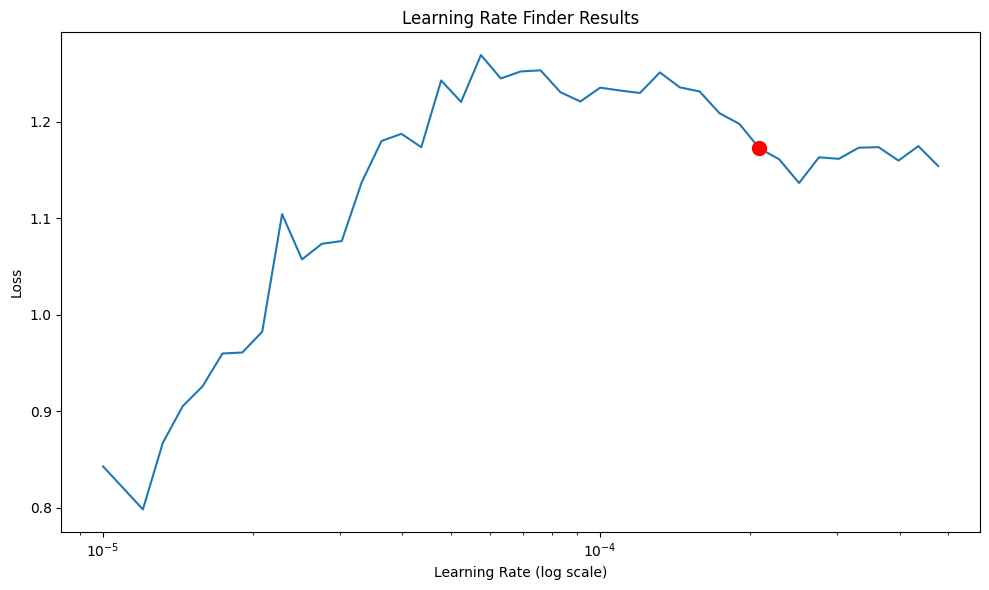

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Suggested learning rate: 0.00020893


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/L

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 501.41it/s]
Learning rate set to 0.00022908676527677737
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d1bf8013-0f38-4e82-bce9-de7182c5cc67.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_d1bf8013-0f38-4e82-bce9-de7182c5cc67.ckpt


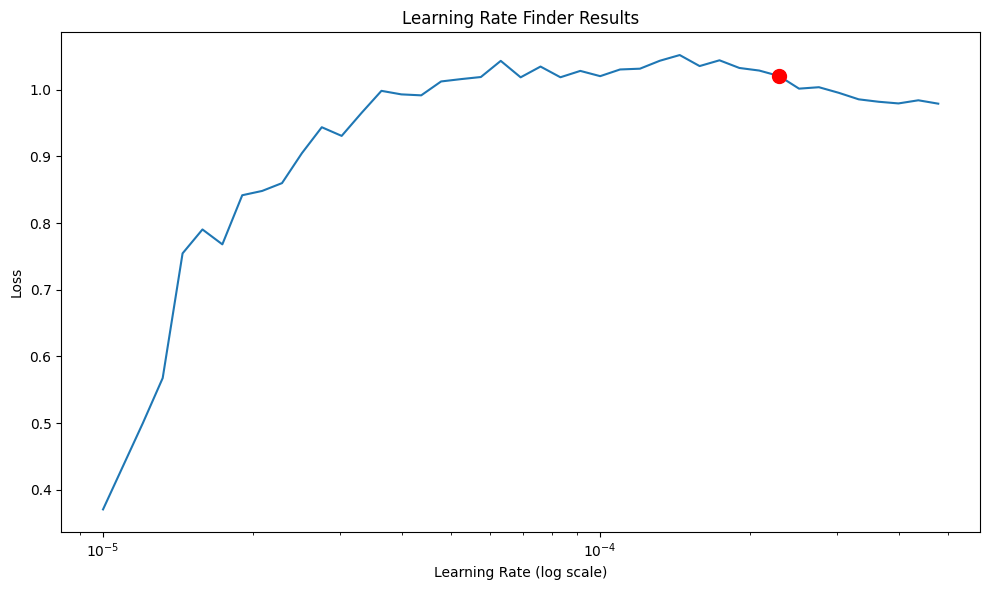

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00022909


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 42 steps due to diverging loss.
Finding best initial lr:  42%|████▏     | 42/100 [00:00<00:00, 572.86it/s]
Learning rate set to 9.120108393559098e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a0e5d1a4-6363-449c-8134-9342845e3496.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_a0e5d1a4-6363-449c-8134-9342845e3496.ckpt


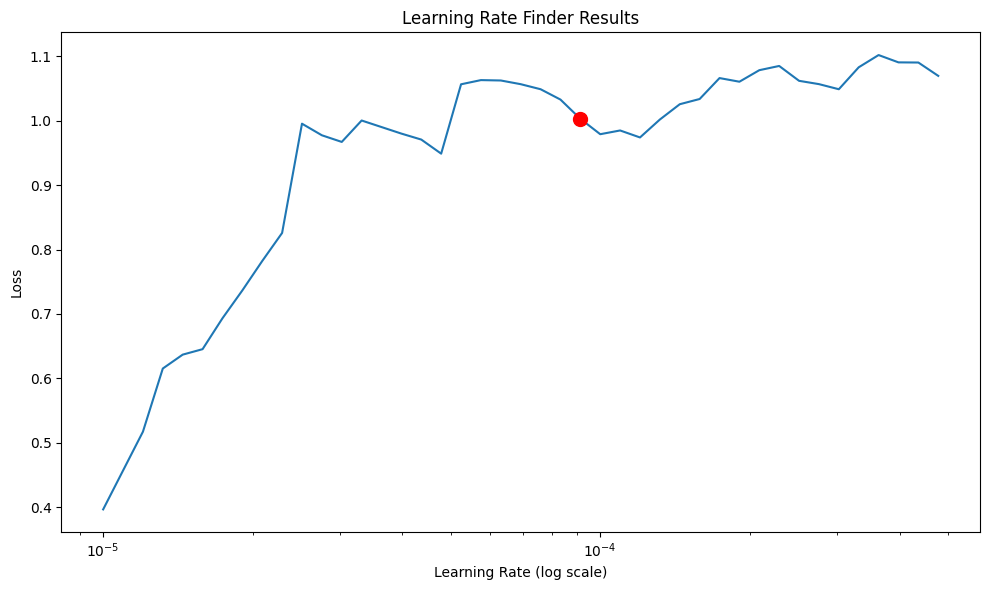

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00009120


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.



Evaluating models with 3 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 3: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef3_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 3...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 3:
  learning_rate: 0.00012077766202627528
  hidden_size: 64
  num_layers: 3
  dropout: 0.1
  weight_decay: 0.01
  batch_size: 32

Best hyperparameters for household_debt with lag 3:
  learning_rate: 0.0009841890748614579
  hidden_size: 128
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.01
  batch_size: 128

Best hyperparameters for private_debt with lag 3:
  learning_rate: 0.00013640880718965886
  hidden_size: 16
  num_layers: 1
  dropout: 0.5
  weight_decay: 0.01
  batch_size: 16
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 594.71it/s]
Learning rate set to 3.630780547701014e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_378a5b3f-3112-4228-9555-fa2f156573f9.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_378a5b3f-3112-4228-9555-fa2f156573f9.ckpt


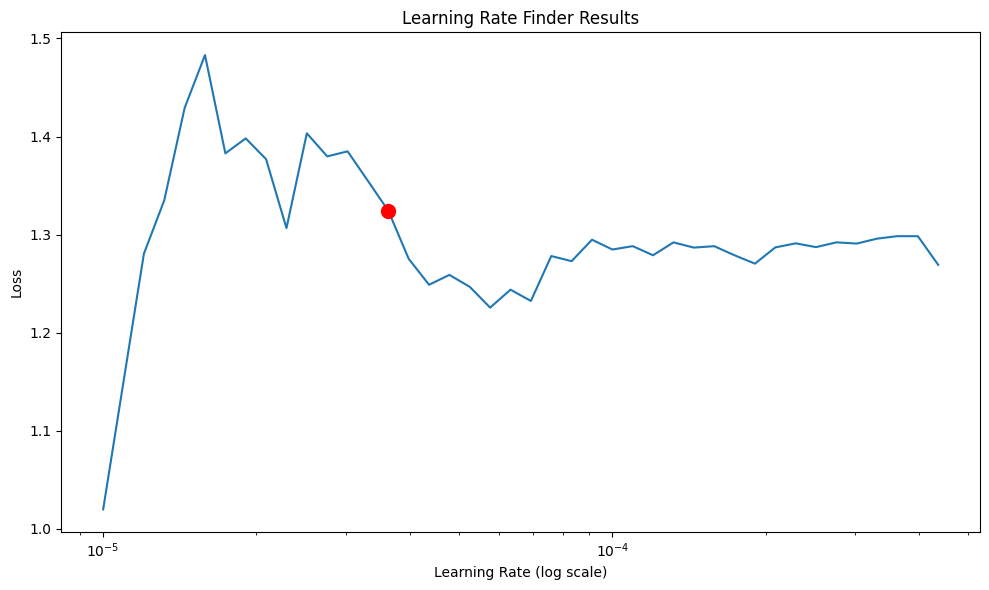

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003631


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (41) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 637.11it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0aeedf86-5bdd-4f5e-996c-eb95f89f12fa.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0aeedf86-5bdd-4f5e-996c-eb95f89f12fa.ckpt


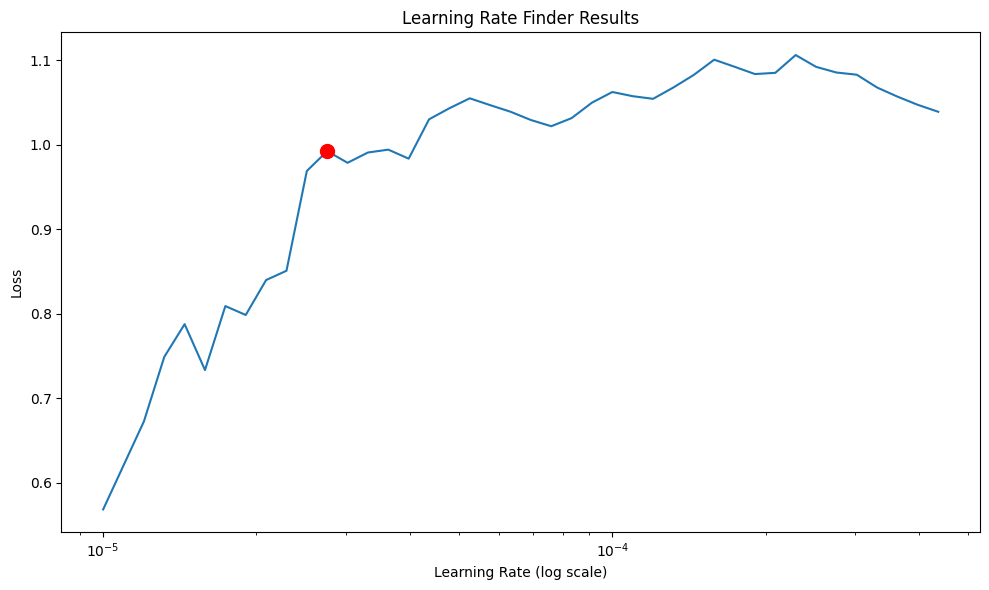

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 508.65it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0186f339-381b-4f2c-b8b1-e6551470a453.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_0186f339-381b-4f2c-b8b1-e6551470a453.ckpt


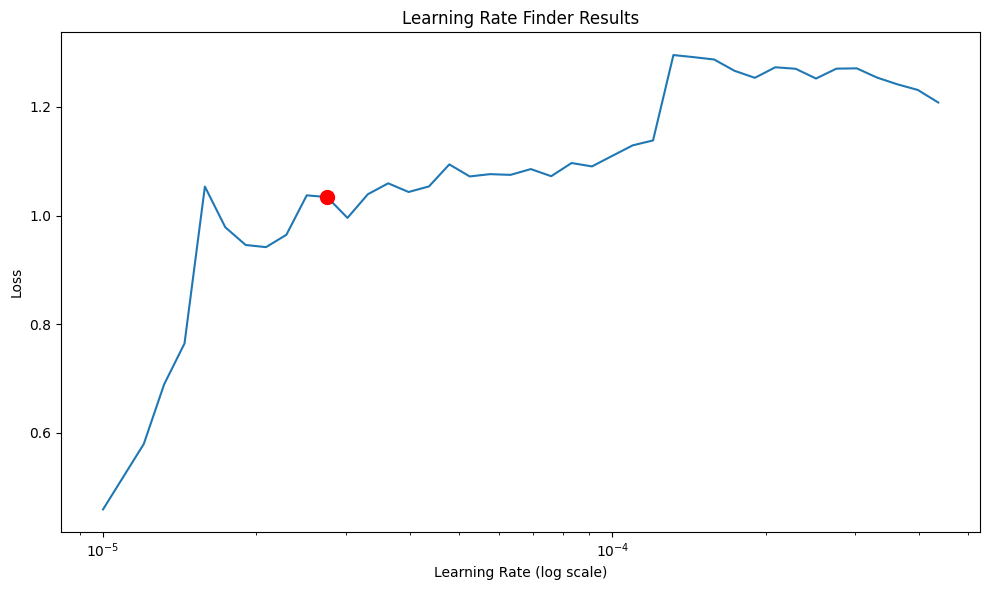

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00002754

Evaluating models with 4 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 4: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef4_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 4...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 4:
  learning_rate: 0.0010357095090366875
  hidden_size: 16
  num_layers: 1
  dropout: 0.1
  weight_decay: 1e-05
  batch_size: 32

Best hyperparameters for household_debt with lag 4:
  learning_rate: 2.8188626770722015e-05
  hidden_size: 64
  num_layers: 2
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 64

Best hyperparameters for private_debt with lag 4:
  learning_rate: 2.8188626770722015e-05
  hidden_size: 64
  num_layers: 2
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 506.43it/s]
Learning rate set to 8.317637711026712e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f8e66428-7f57-4e24-a6c5-392ec46a7a56.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f8e66428-7f57-4e24-a6c5-392ec46a7a56.ckpt


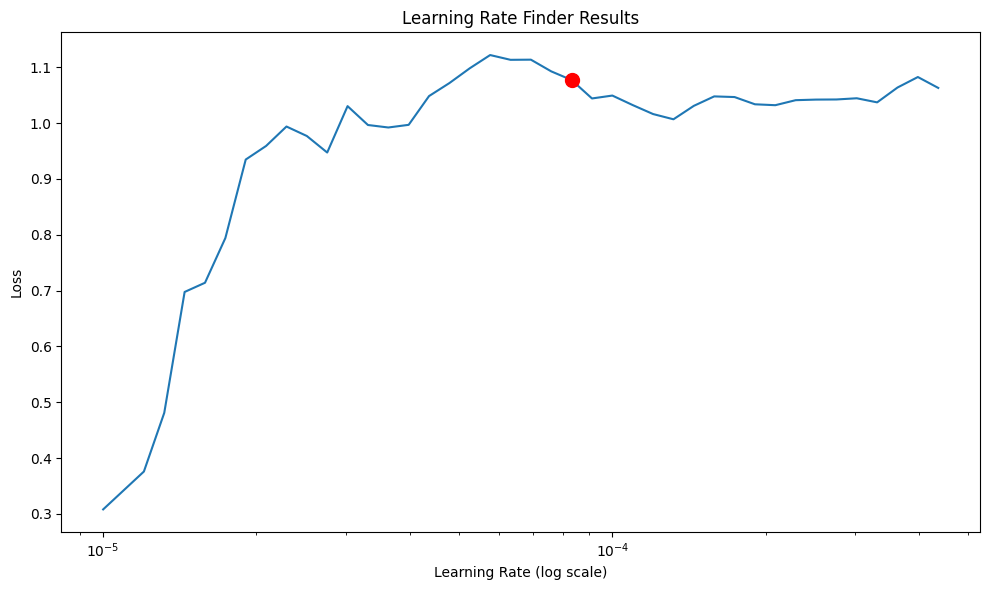

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00008318


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 628.33it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b8c5230b-4183-492b-aa25-4474527218f2.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_b8c5230b-4183-492b-aa25-4474527218f2.ckpt


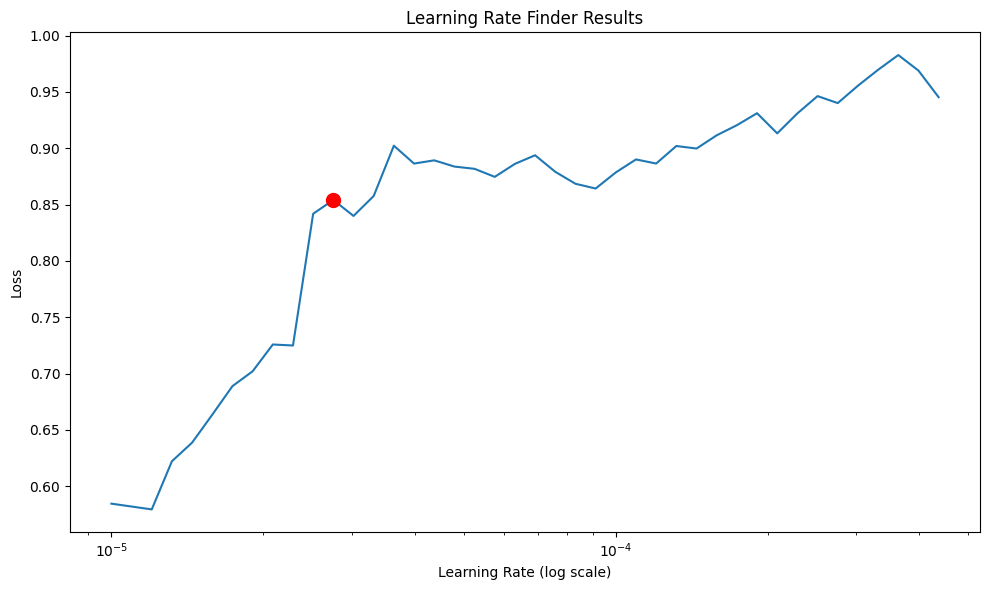

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 41 steps due to diverging loss.
Finding best initial lr:  41%|████      | 41/100 [00:00<00:00, 633.04it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_36c92cb8-e116-45c4-985b-9ba59161467e.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_36c92cb8-e116-45c4-985b-9ba59161467e.ckpt


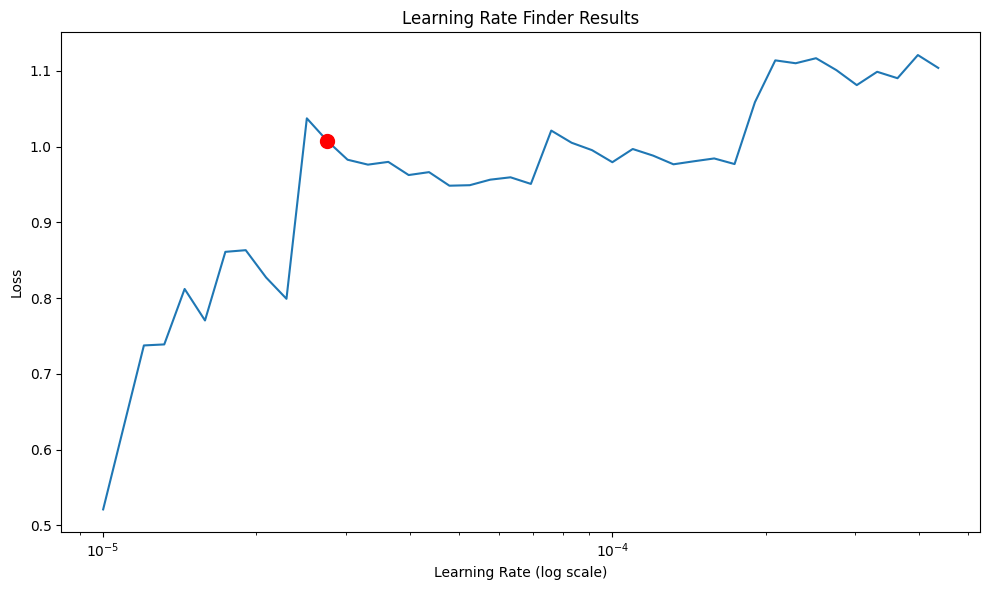

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.



Evaluating models with 5 lags...


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 5: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef5_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 5...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 5:
  learning_rate: 0.0005653906067290699
  hidden_size: 64
  num_layers: 1
  dropout: 0.5
  weight_decay: 1e-05
  batch_size: 64

Best hyperparameters for household_debt with lag 5:
  learning_rate: 7.398742625727105e-05
  hidden_size: 128
  num_layers: 2
  dropout: 0.4
  weight_decay: 0.0001
  batch_size: 32

Best hyperparameters for private_debt with lag 5:
  learning_rate: 0.00020542755772835823
  hidden_size: 16
  num_layers: 3
  dropout: 0.3
  weight_decay: 0.001
  batch_size: 64
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 570.57it/s]
Learning rate set to 3.981071705534973e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3e975dba-a8f6-4e54-9e87-4a4dd05c9030.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3e975dba-a8f6-4e54-9e87-4a4dd05c9030.ckpt


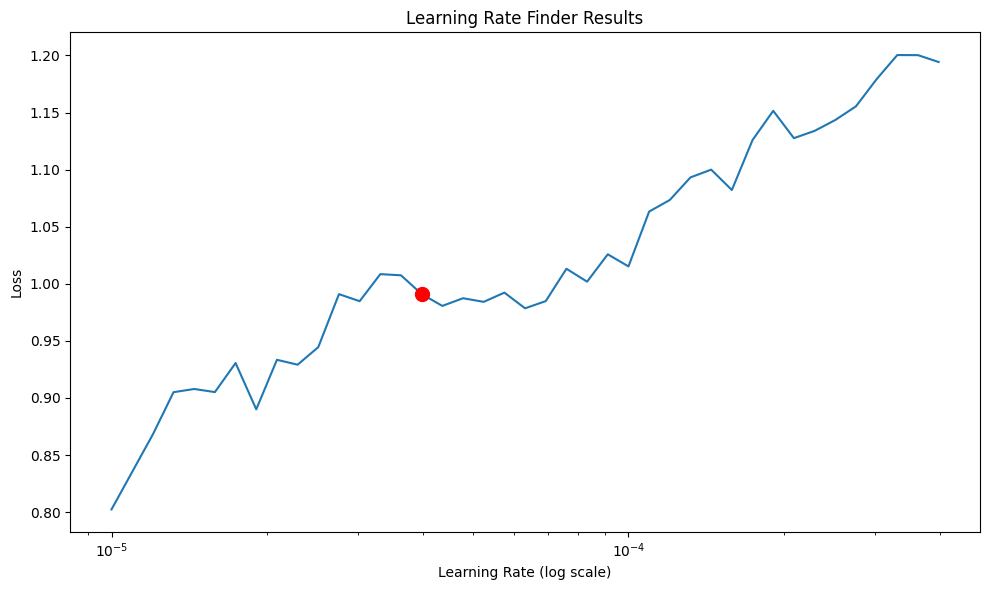

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003981


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:  34%|███▍      | 34/100 [00:00<00:00, 259.74it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 258.13it/s]
Learning rate set to 2.7542287033381663e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3a82529c-0eae-4541-993d-c1e3eed3bd30.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3a82529c-0eae-4541-993d-c1e3eed3bd30.ckpt


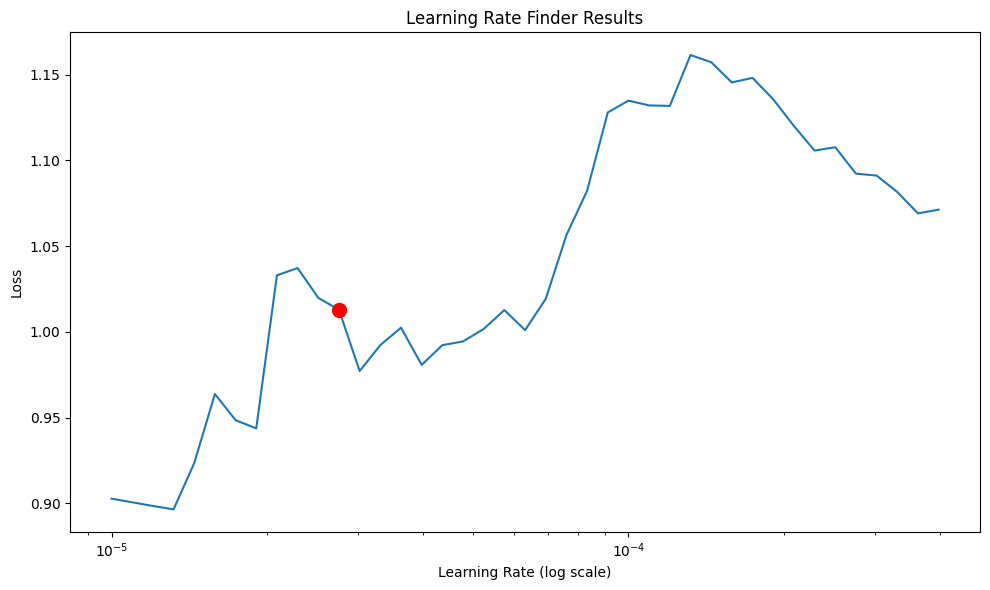

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00002754


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 530.77it/s]
Learning rate set to 3.0199517204020165e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f3630e4a-341d-4377-9a37-d44743bfe14c.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_f3630e4a-341d-4377-9a37-d44743bfe14c.ckpt


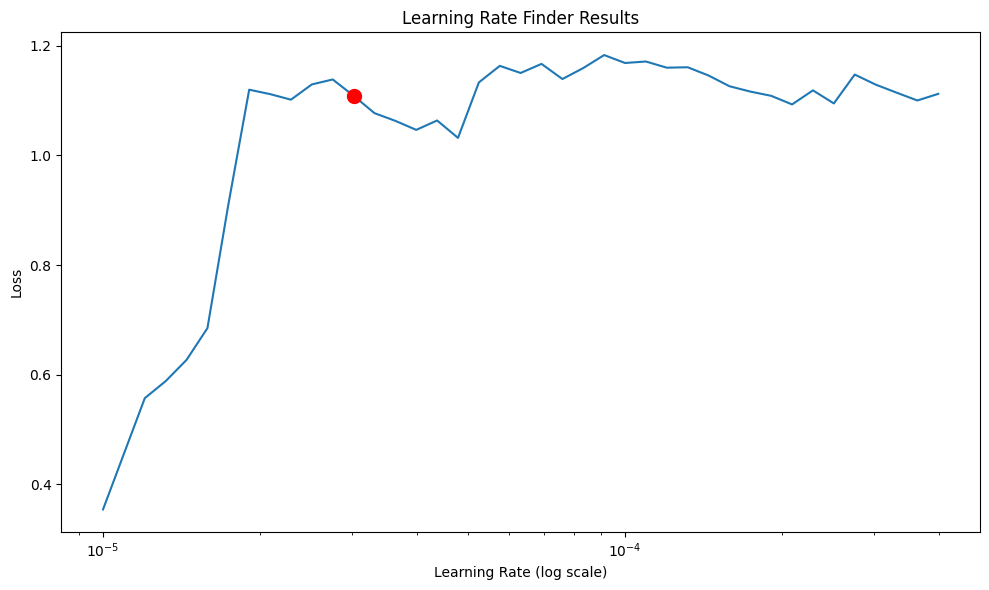

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003020


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.



Evaluating models with 6 lags...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Error evaluating Panel VAR with lag 6: [Errno 2] No such file or directory: './pvarcoefs_GDPHHD/coef6_GDPHHD.xlsx'
Starting hyperparameter optimization for lag 6...
Optimizing hyperparameters for log_GDP


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for household_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 

Optimizing hyperparameters for private_debt


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider 


Best hyperparameters for log_GDP with lag 6:
  learning_rate: 0.00012051000746179085
  hidden_size: 32
  num_layers: 2
  dropout: 0.4
  weight_decay: 0.001
  batch_size: 128

Best hyperparameters for household_debt with lag 6:
  learning_rate: 0.0016958291125619253
  hidden_size: 64
  num_layers: 1
  dropout: 0.3
  weight_decay: 0.01
  batch_size: 16

Best hyperparameters for private_debt with lag 6:
  learning_rate: 0.00016027007971075718
  hidden_size: 32
  num_layers: 1
  dropout: 0.1
  weight_decay: 0.001
  batch_size: 32
Training model for log_GDP with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 526.60it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_fe2c7a8f-05ce-4087-ba6a-3d1a54c619cc.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_fe2c7a8f-05ce-4087-ba6a-3d1a54c619cc.ckpt


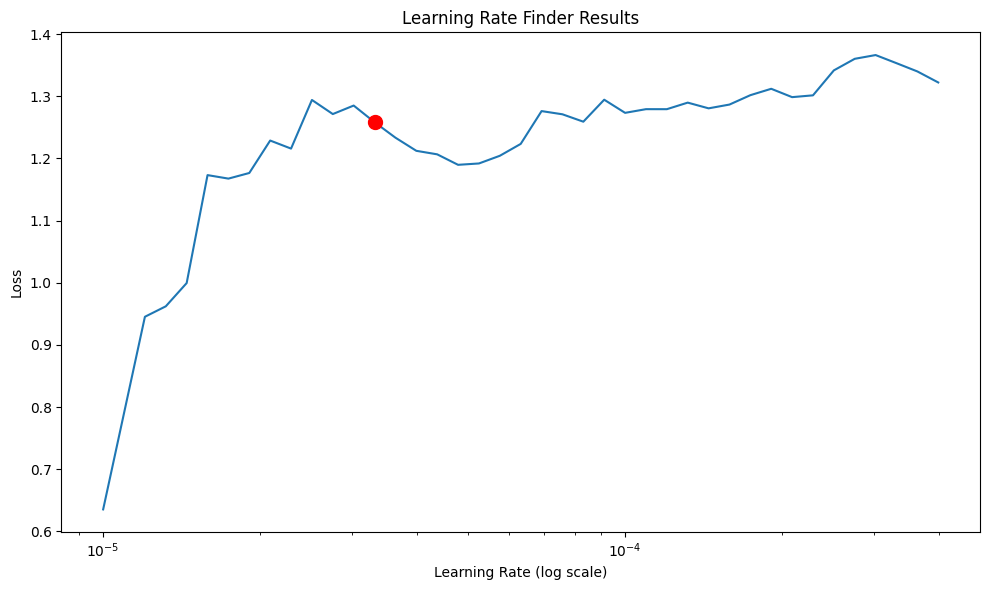

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for household_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 619.77it/s]
Learning rate set to 0.00014454397707459272
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3d42c59c-c59a-4d72-ba1e-3dc0b4b4db9a.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_3d42c59c-c59a-4d72-ba1e-3dc0b4b4db9a.ckpt


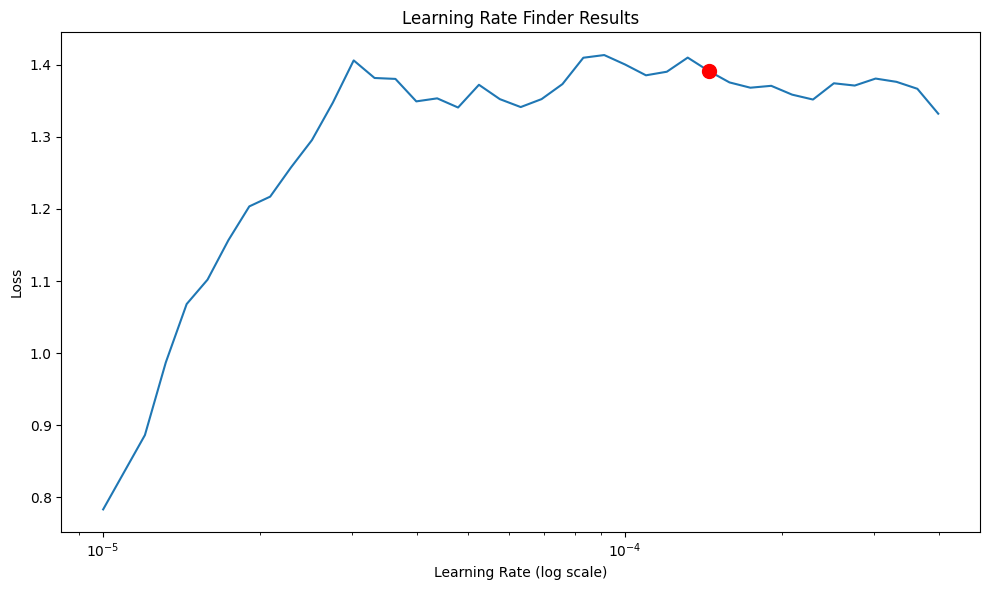

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.


Suggested learning rate: 0.00014454


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU ava

Training model for private_debt with optimized hyperparameters...
Finding optimal learning rate...


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]`Trainer.fit` stopped: `max_epochs=1` reached.
LR finder stopped early after 40 steps due to diverging loss.
Finding best initial lr:  40%|████      | 40/100 [00:00<00:00, 601.75it/s]
Learning rate set to 3.311311214825912e-05
Restoring states from the checkpoint path at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_96cdae5a-f36e-496f-86f5-d1f107d2c9a4.ckpt
Restored all states from the checkpoint at /Users/bram/Desktop/Honors Draft for Reviewers/Honors-DeepVAR-Household-Debt-Analysis/Results/experiments/HHD_GDP_PD/.lr_find_96cdae5a-f36e-496f-86f5-d1f107d2c9a4.ckpt


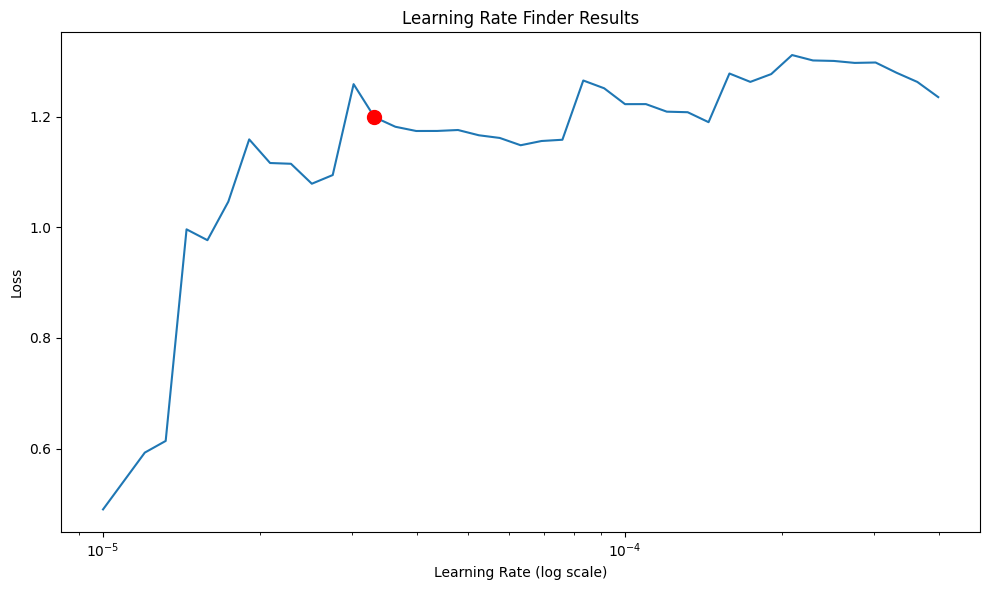

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'val_datal

Suggested learning rate: 0.00003311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


In [51]:
variables_to_evaluate = ['log_GDP', 'household_debt', 'private_debt'] 
from var import var
# takes a while to run
robust_check_results4, robustness_dict4 = evaluate_models_with_lags(
    final_detrend, 
    train_dt_var, 
    test_dt_var, 
    variables_to_evaluate, 
    max_lags=max_lags_to_evaluate,
    seed = 1000
)

In [52]:
def calculate_model_improvements(results_dict, base_model='DeepVAR', compare_models=None):
    improvements = {}
    
    variables = list(results_dict[base_model].keys())
    
    for variable in variables:
        improvements[variable] = {}
        
        for lag in results_dict[base_model][variable].keys():
        # for lag in range(5,6):
            improvements[variable][lag] = {}
            
            for compare_model in compare_models:
                if compare_model not in results_dict:
                    continue
                    
                if variable not in results_dict[compare_model]:
                    continue
                    
                if lag not in results_dict[compare_model][variable]:
                    continue
                
                improvements[variable][lag][compare_model] = {}
                
                # calculate improvment
                for metric in ['MSE', 'RMSE', 'MAE']:
                    print(base_model, variable,lag,metric)
                    base_value = results_dict[base_model][variable][lag][metric]
                    compare_value = results_dict[compare_model][variable][lag][metric]
                    
                    if compare_value != 0:
                        # positive % change means base_model has lower error
                        improvement = ((compare_value - base_value) / compare_value) * 100
                        improvements[variable][lag][compare_model][metric] = improvement
                    else:
                        improvements[variable][lag][compare_model][metric] = None
    
    return improvements

improvements = calculate_model_improvements(all_results)

DeepVAR log_GDP 1 MSE
DeepVAR log_GDP 1 RMSE
DeepVAR log_GDP 1 MAE
DeepVAR log_GDP 1 MSE
DeepVAR log_GDP 1 RMSE
DeepVAR log_GDP 1 MAE
DeepVAR log_GDP 2 MSE
DeepVAR log_GDP 2 RMSE
DeepVAR log_GDP 2 MAE
DeepVAR log_GDP 2 MSE
DeepVAR log_GDP 2 RMSE
DeepVAR log_GDP 2 MAE
DeepVAR log_GDP 3 MSE
DeepVAR log_GDP 3 RMSE
DeepVAR log_GDP 3 MAE
DeepVAR log_GDP 3 MSE
DeepVAR log_GDP 3 RMSE
DeepVAR log_GDP 3 MAE
DeepVAR log_GDP 4 MSE
DeepVAR log_GDP 4 RMSE
DeepVAR log_GDP 4 MAE
DeepVAR log_GDP 4 MSE
DeepVAR log_GDP 4 RMSE
DeepVAR log_GDP 4 MAE
DeepVAR log_GDP 5 MSE
DeepVAR log_GDP 5 RMSE
DeepVAR log_GDP 5 MAE
DeepVAR log_GDP 5 MSE
DeepVAR log_GDP 5 RMSE
DeepVAR log_GDP 5 MAE
DeepVAR log_GDP 6 MSE
DeepVAR log_GDP 6 RMSE
DeepVAR log_GDP 6 MAE
DeepVAR log_GDP 6 MSE
DeepVAR log_GDP 6 RMSE
DeepVAR log_GDP 6 MAE
DeepVAR household_debt 1 MSE
DeepVAR household_debt 1 RMSE
DeepVAR household_debt 1 MAE
DeepVAR household_debt 1 MSE
DeepVAR household_debt 1 RMSE
DeepVAR household_debt 1 MAE
DeepVAR household_de

In [53]:
all_results

{'VAR': {'log_GDP': {1: {'MSE': 6.547041753641074e-05,
    'RMSE': 0.008091379211012838,
    'MAE': 0.005069887766811554},
   2: {'MSE': 6.723007759229526e-05,
    'RMSE': 0.008199394952817877,
    'MAE': 0.005210292796308126},
   3: {'MSE': 6.928394226174754e-05,
    'RMSE': 0.008323697631566608,
    'MAE': 0.005244632903256197},
   4: {'MSE': 8.082407934741777e-05,
    'RMSE': 0.008990221318044276,
    'MAE': 0.005578532232999405},
   5: {'MSE': 9.904470000695981e-05,
    'RMSE': 0.009952120377435142,
    'MAE': 0.005739445729642663},
   6: {'MSE': 0.0001452409418767055,
    'RMSE': 0.0120515949930582,
    'MAE': 0.006299370745431639}},
  'household_debt': {1: {'MSE': 0.5853967010732891,
    'RMSE': 0.7651122146935632,
    'MAE': 0.5583415813695739},
   2: {'MSE': 0.5176055346143688,
    'RMSE': 0.7194480763852029,
    'MAE': 0.5109124823659944},
   3: {'MSE': 0.5505945561727326,
    'RMSE': 0.7420205901272097,
    'MAE': 0.5242552770675415},
   4: {'MSE': 0.7739588044423547,
    'RM

In [54]:
results = [all_results, robust_check_results, robust_check_results2, robust_check_results3, robust_check_results4]
for result in results:
    improvements = calculate_model_improvements(result)
    for variable in improvements:
        print(f"\nImprovements for {variable}:")
        for lag in range(1,6):
            print(f"  Lag {lag}:")
            for compare_model in improvements[variable][lag]:
                print(f"    vs {compare_model}:")
                for metric, value in improvements[variable][lag][compare_model].items():
                    print(f"      {metric}: {value:.2f}%")

DeepVAR log_GDP 1 MSE
DeepVAR log_GDP 1 RMSE
DeepVAR log_GDP 1 MAE
DeepVAR log_GDP 1 MSE
DeepVAR log_GDP 1 RMSE
DeepVAR log_GDP 1 MAE
DeepVAR log_GDP 2 MSE
DeepVAR log_GDP 2 RMSE
DeepVAR log_GDP 2 MAE
DeepVAR log_GDP 2 MSE
DeepVAR log_GDP 2 RMSE
DeepVAR log_GDP 2 MAE
DeepVAR log_GDP 3 MSE
DeepVAR log_GDP 3 RMSE
DeepVAR log_GDP 3 MAE
DeepVAR log_GDP 3 MSE
DeepVAR log_GDP 3 RMSE
DeepVAR log_GDP 3 MAE
DeepVAR log_GDP 4 MSE
DeepVAR log_GDP 4 RMSE
DeepVAR log_GDP 4 MAE
DeepVAR log_GDP 4 MSE
DeepVAR log_GDP 4 RMSE
DeepVAR log_GDP 4 MAE
DeepVAR log_GDP 5 MSE
DeepVAR log_GDP 5 RMSE
DeepVAR log_GDP 5 MAE
DeepVAR log_GDP 5 MSE
DeepVAR log_GDP 5 RMSE
DeepVAR log_GDP 5 MAE
DeepVAR log_GDP 6 MSE
DeepVAR log_GDP 6 RMSE
DeepVAR log_GDP 6 MAE
DeepVAR log_GDP 6 MSE
DeepVAR log_GDP 6 RMSE
DeepVAR log_GDP 6 MAE
DeepVAR household_debt 1 MSE
DeepVAR household_debt 1 RMSE
DeepVAR household_debt 1 MAE
DeepVAR household_debt 1 MSE
DeepVAR household_debt 1 RMSE
DeepVAR household_debt 1 MAE
DeepVAR household_de

   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0                0.0
   log_GDP_lag1  household_debt_lag1  private_debt_lag1
0           0.0                  0.0            

/var/folders/mg/jjtr9hhj5zj6g0svf83l817h0000gn/T/ipykernel_32424/3675448082.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


   log_GDP_lag1  log_GDP_lag2  log_GDP_lag3  log_GDP_lag4  \
0           0.0           0.0           0.0           0.0   

   household_debt_lag1  household_debt_lag2  household_debt_lag3  \
0                  0.0                  0.0                  0.0   

   household_debt_lag4  private_debt_lag1  private_debt_lag2  \
0                  0.0                0.0                0.0   

   private_debt_lag3  private_debt_lag4  
0                0.0                0.0  
   log_GDP_lag1  log_GDP_lag2  log_GDP_lag3  log_GDP_lag4  \
0           0.0           0.0           0.0           0.0   

   household_debt_lag1  household_debt_lag2  household_debt_lag3  \
0                  0.0                  0.0                  0.0   

   household_debt_lag4  private_debt_lag1  private_debt_lag2  \
0                  0.0                0.0                0.0   

   private_debt_lag3  private_debt_lag4  
0                0.0                0.0  
   log_GDP_lag1  log_GDP_lag2  log_GDP_lag3  log_GDP_l

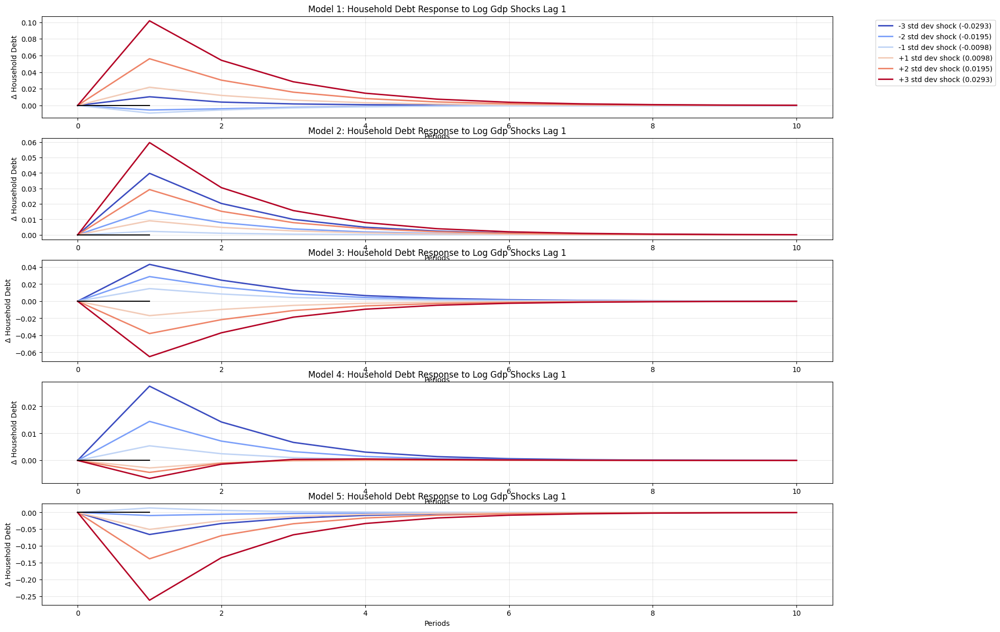

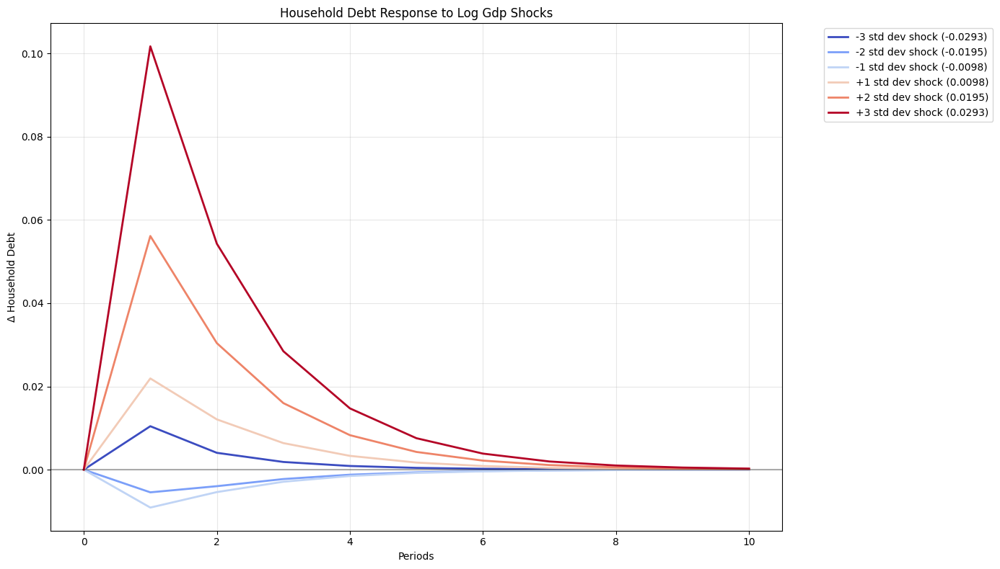

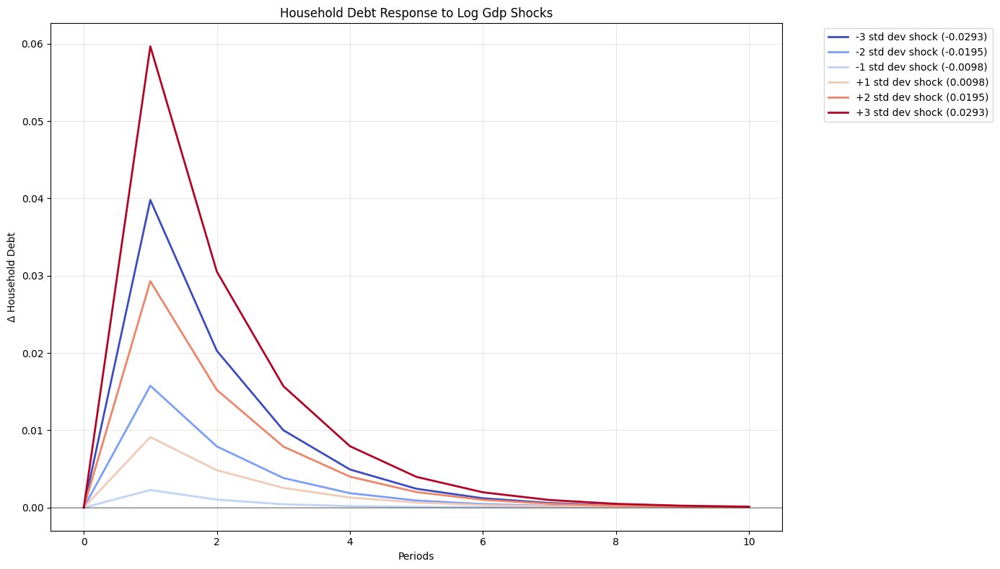

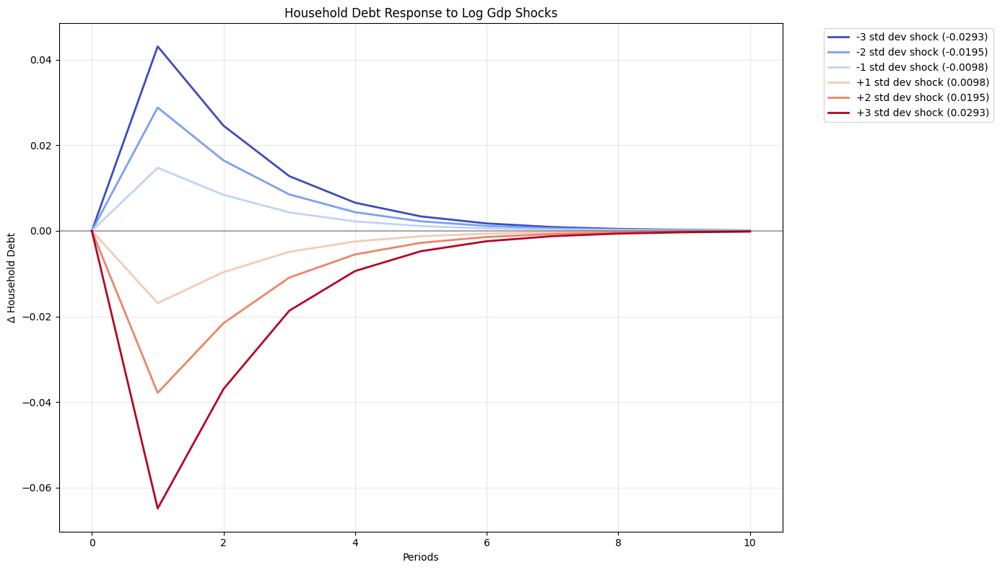

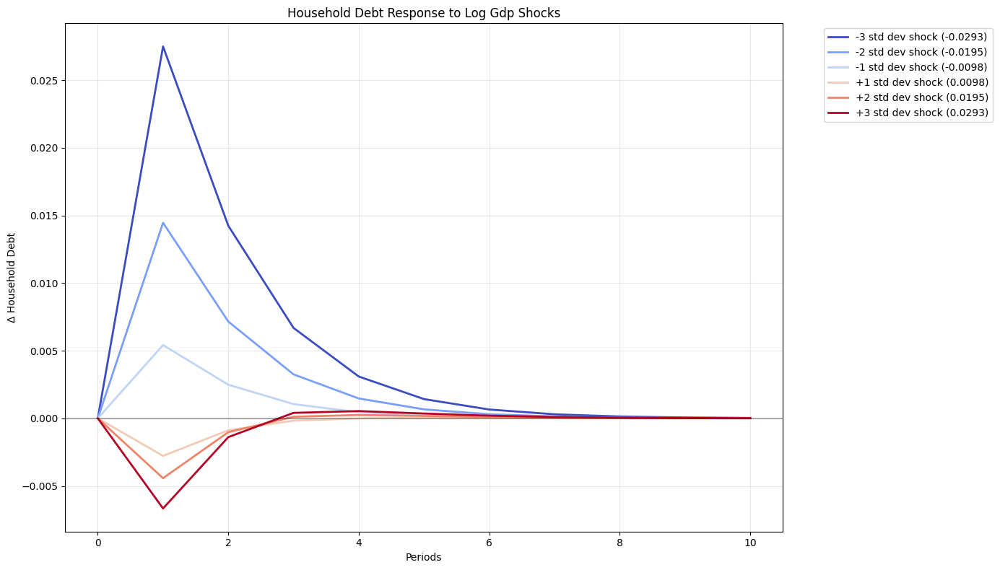

...

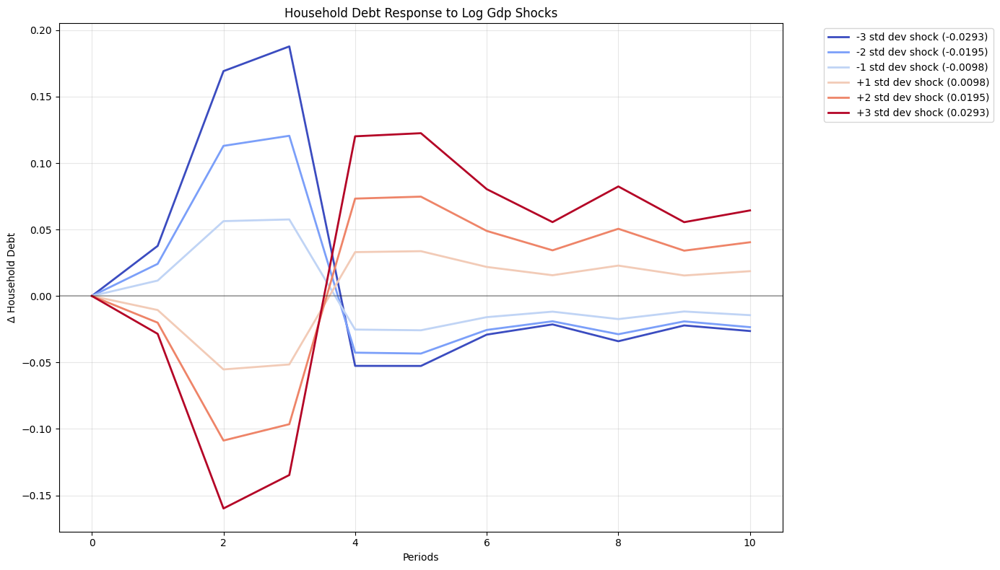

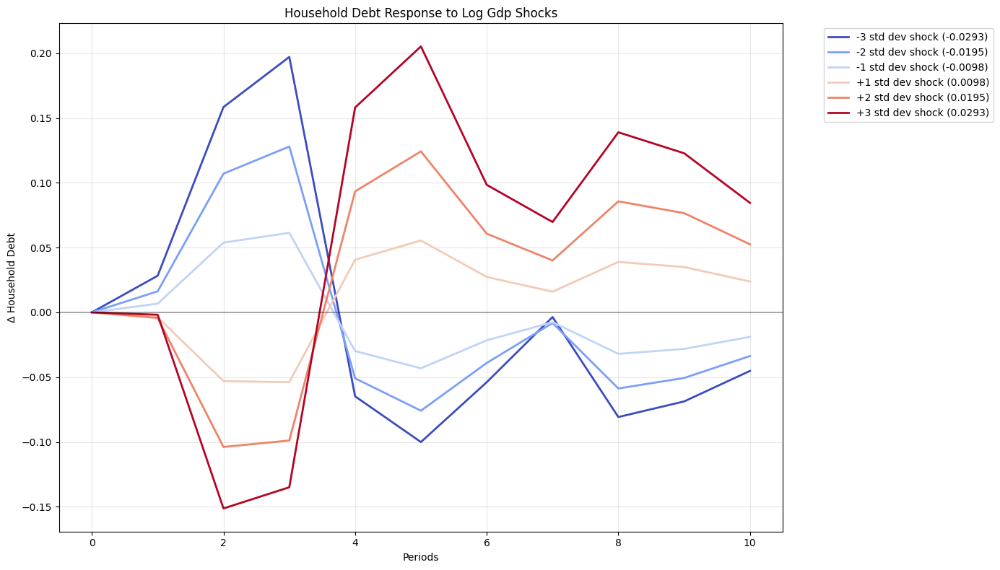

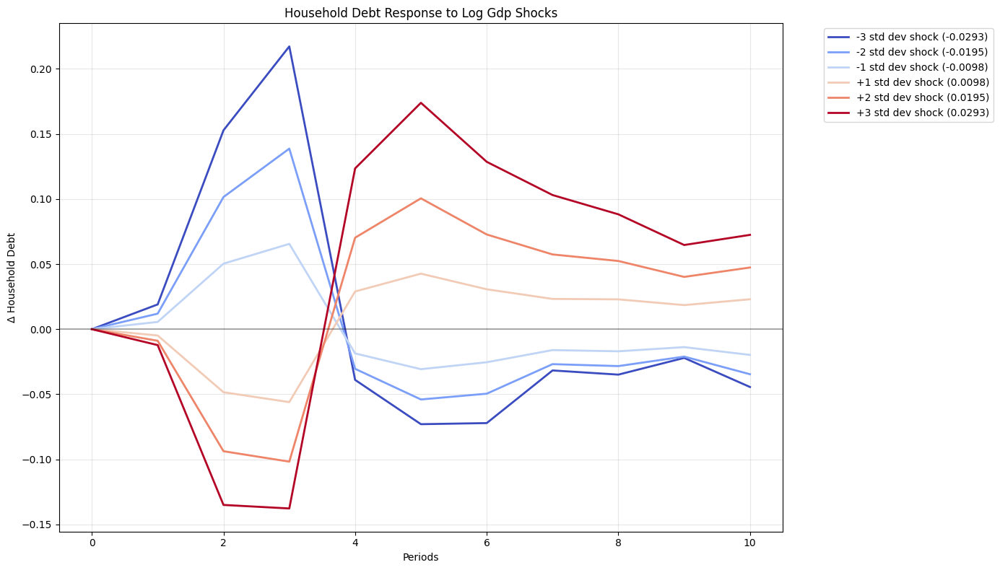

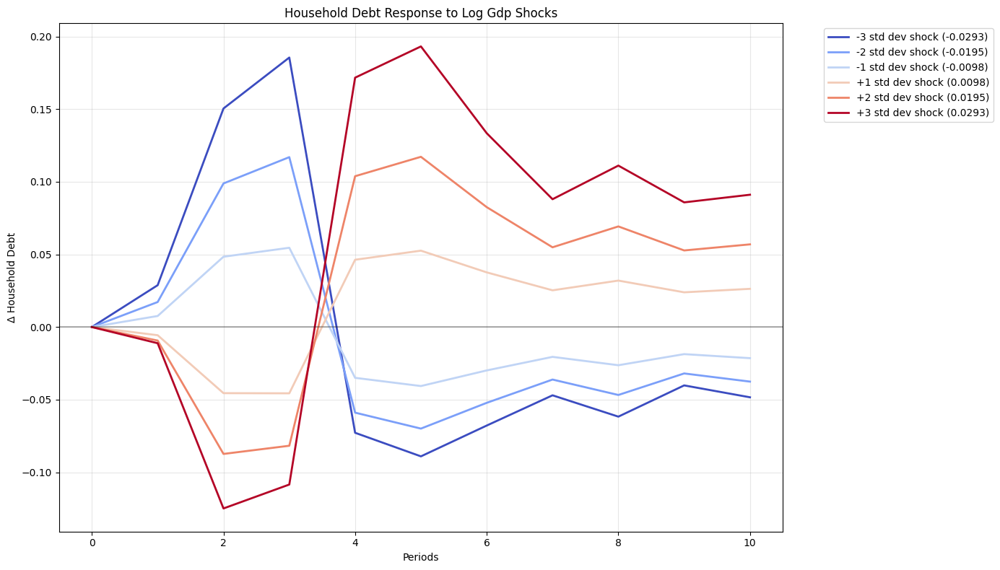

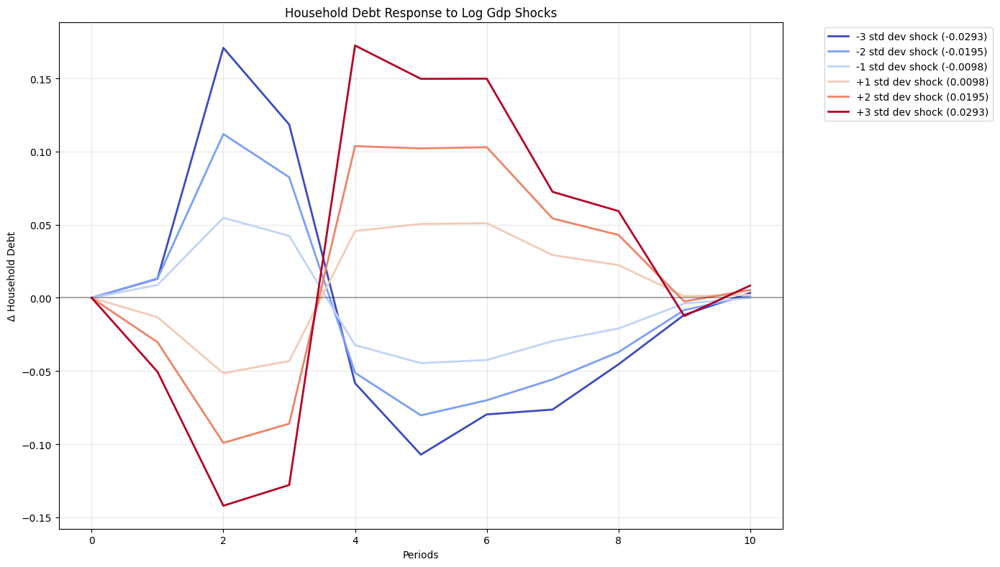

In [72]:
def plot_irf_with_multiple_shocks(df_zeros, inputs, shock_var, response_var, 
                                 model_dict, lags, periods=10, 
                                 std_multipliers=None, figsize=(14, 8), show_plot=True):
    """
    Plot Impulse Response Functions for multiple shock sizes.
    
    Parameters:
    -----------
    df_zeros : DataFrame
        DataFrame with zeros for all input variables
    inputs : list
        List of input variable names
    shock_var : str
        Variable name to shock (e.g., 'household_debt_lag1')
    response_var : str
        Variable name to measure response (e.g., 'log_GDP')
    model_dict : dict
        Dictionary containing trained models
    lags : int
        Number of lags in the model
    periods : int
        Number of periods to forecast
    std_multipliers : list, optional
        List of standard deviation multipliers for shock sizes
        Default is [-3, -2, -1, 1, 2, 3]
    figsize : tuple, optional
        Figure size (width, height)
    show_plot : bool, optional
        Whether to display the plot immediately (default: True)
        
    Returns:
    --------
    matplotlib.figure.Figure
        The created figure object
    """
    # Get standard deviation of the variable to shock
    base_var = shock_var.split('_lag')[0]
    response_base_var = response_var
    
    # Get standard deviations from the data
    std_devs = lstm_df[[base_var, response_base_var]].std()
    
    # Define standardized shock sizes if not provided
    if std_multipliers is None:
        std_multipliers = [-3, -2, -1, 1, 2, 3]
    
    # Sort multipliers from negative to positive
    std_multipliers.sort()
    
    # Create shock sizes
    shock_sizes = [std_devs[base_var] * m for m in std_multipliers]
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create color map
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(std_multipliers)))
    
    # Plot IRFs for different shock sizes
    for i, (mult, shock, color) in enumerate(zip(std_multipliers, shock_sizes, colors)):
        irf_result = irf.predict(df_zeros, inputs, shock_var, shock, response_var, periods, model_dict, lags)
        label = f'{mult:+d} std dev shock ({shock:.4f})'
        ax.plot(irf_result, label=label, color=color, linewidth=2)
    
    ax.axhline(y=0, color='k', linestyle='-', alpha=0.3)
    
    # Set title and labels
    shock_name = base_var.replace('_', ' ').title()
    response_name = response_var.replace('_', ' ').title()
    
    if response_var == 'log_GDP':
        response_label = '%Δ GDP'
    else:
        response_label = f'Δ {response_name}'
        
    ax.set_title(f'{response_name} Response to {shock_name} Shocks')
    ax.set_xlabel('Periods')
    ax.set_ylabel(response_label)
    
    # Add legend and grid
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if show_plot:
        plt.show()
    
    return fig, ax

def create_irf_grid(models, lag, shock_var, shocked_var, periods=20, std_multipliers=None, figsize=(20, 15)):
    """
    Create a grid of IRF plots for multiple models.
    
    Parameters:
    -----------
    models : list
        List of model dictionaries
    lag : int
        Lag specification to use
    periods : int
        Number of periods to forecast
    std_multipliers : list, optional
        List of standard deviation multipliers for shock sizes
    figsize : tuple, optional
        Figure size for the entire grid
        
    Returns:
    --------
    matplotlib.figure.Figure
        The created figure object
    """
    # Number of models
    n_models = len(models)
    
    # Create a grid with n_models rows and 1 column
    fig, axes = plt.subplots(n_models, 1, figsize=figsize)
    
    # If there's only one model, make axes iterable
    if n_models == 1:
        axes = [axes]
    
    # Get inputs for the specified lag
    lag_inputs = models[0][lag]['inputs']
    df_zeros = pd.DataFrame(np.zeros((1, len(lag_inputs))), columns=lag_inputs)
    
    # Create IRF plots for each model
    for i, model in enumerate(models):
        # Generate IRF plot
        _, ax = plot_irf_with_multiple_shocks(
            df_zeros, 
            lag_inputs,  
            shock_var, 
            shocked_var, 
            model[lag]['model_dict'], 
            lag,  
            periods=periods, 
            std_multipliers=std_multipliers,
            show_plot=False
        )
        
        # Copy the plot to the grid
        axes[i].clear()
        for line in ax.lines:
            axes[i].plot(line.get_xdata(), line.get_ydata(), 
                        color=line.get_color(), 
                        linestyle=line.get_linestyle(),
                        linewidth=line.get_linewidth(),
                        label=line.get_label())
        
        # Copy other elements
        axes[i].set_title(f'Model {i+1}: {ax.get_title()} Lag {lag}')
        axes[i].set_xlabel(ax.get_xlabel())
        axes[i].set_ylabel(ax.get_ylabel())
        axes[i].grid(True, alpha=0.3)
        
        # Add legend
        if i == 0:  # Only add legend to the first plot to save space
            axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.4)  
    
    return fig

models = [model_dict_1, robustness_dict, robustness_dict2, robustness_dict3, robustness_dict4]
lag_to_use = 6
std_multipliers = [-3, -2, -1, 1, 2, 3]

for lag in range(1,7):
    irf_grid = create_irf_grid(models, lag, 'log_GDP_lag1', 'household_debt', periods=10, std_multipliers=std_multipliers)


In [61]:
# Generate LaTeX tables
latex_tables = create_latex_table_from_results(all_results, variables_to_evaluate)

# Display the LaTeX tables
for var, table in latex_tables.items():
    print(f"\nLaTeX table for {var}:")
    print(table)



LaTeX table for log_GDP:
\begin{table}[htbp]
\centering
\caption{Performance Comparison for log_GDP}
\begin{tabular}{lccccccc}
\hline
\textbf{Model} & \textbf{Metric} & \textbf{Lag 1} & \textbf{Lag 2} & \textbf{Lag 3} & \textbf{Lag 4} & \textbf{Lag 5} & \textbf{Lag 6} \\
\hline
VAR & MSE & 0.000065 & 0.000067 & 0.000069 & 0.000081 & 0.000099 & 0.000145 \\
 & RMSE & 0.008091 & 0.008199 & 0.008324 & 0.008990 & 0.009952 & 0.012052 \\
 & MAE & 0.005070 & 0.005210 & 0.005245 & 0.005579 & 0.005739 & 0.006299 \\
\hline
PVAR & MSE & nan & nan & nan & nan & nan & nan \\
 & RMSE & nan & nan & nan & nan & nan & nan \\
 & MAE & nan & nan & nan & nan & nan & nan \\
\hline
DeepVAR & MSE & 0.000056 & 0.000056 & 0.000061 & 0.000055 & 0.000063 & 0.000057 \\
 & RMSE & 0.007507 & 0.007484 & 0.007812 & 0.007440 & 0.007939 & 0.007571 \\
 & MAE & 0.004674 & 0.004676 & 0.004968 & 0.004654 & 0.005063 & 0.004751 \\
\hline
\end{tabular}
\end{table}

LaTeX table for household_debt:
\begin{table}[htbp]
\centerin

In [ ]:
de